 <center> <h1> <b> Pattern Recognition and Machine Learning (EE2802 - AI2000) </b> </h1> </center>

<b> Programming Assignment - 03 : Classification</b>

This programming assignment offers you an opportunity to implement various linear classification models. You'll begin with straightforward algorithms like Least Squares classification, LDA, and FDA. Subsequently, you'll delve into implementing the perceptron algorithm. Lastly, you'll tackle probabilistic approaches for classification. To deepen your understanding of these methods, you'll compare their performance and application scenarios critically.

<b> Instructions </b>

1. Plagiarism is strictly prohibited.
2. Delayed submissions will be penalized with a scaling factor of 0.5 per day.
3. Please DO NOT use any machine learning libraries unless and otherwise specified.


## Part-1) Least squares approach to classification


**Part-1) Least squares approach to classification**

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Find the decision boundary: Assign the target value "0" to all data points in class 1 and the target value "1" to all data points in class 2. Implement the pseudo-inverse solution to determine the weight vector, which represents the decision boundary.

c). Evaluate the quality of decision boundary: A decision boundary is deemed effective if it correctly classifies all data points. Accuracy measures the performance of a classification problem. Calculate the accuracy of the test data using the decision boundary obtained from the pseudo-inverse solution.

d). Visualize the decision boundary: You can either display the decision hyperplane or use different colors to distinguish regions corresponding to the two classes on a 2D plane. Superimpose the test points onto the decision boundary plot.

e). Assign the value "-1" to class1 and the value "+1" to class 2. Repeat the experiments.

f). Experiment with Laplacian distribution and compare the performance of it with the Gaussian distribution experiments

g. Report your observations.


In [3]:
#All imports
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import random
import math

Accuracy is  88.0
Accuracy on test Dataset:  88.0  % 


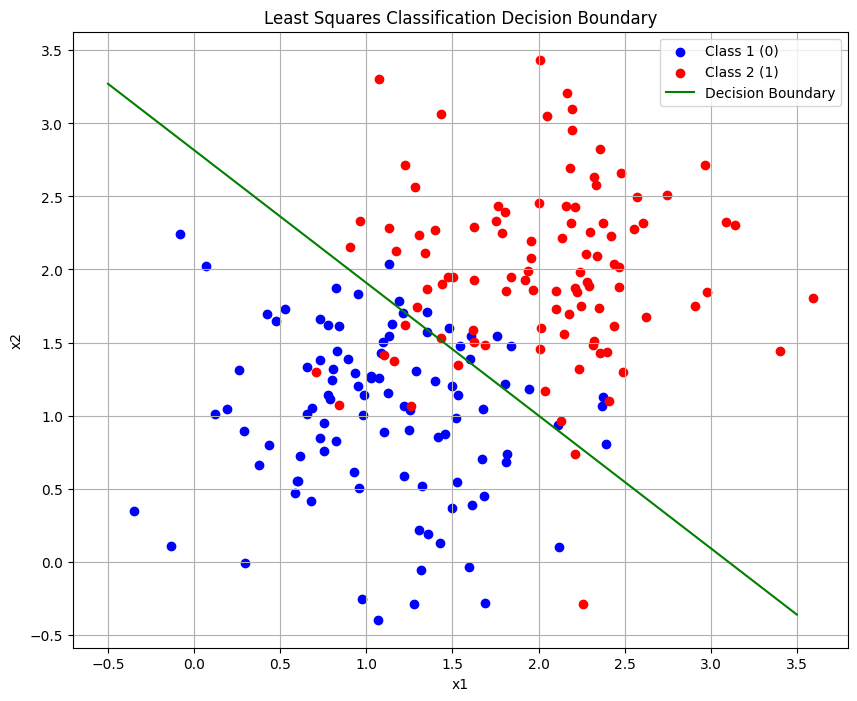

Accuracy is  88.0
Accuracy on test Dataset(Labelled as -1 or 1):  88.0  % 


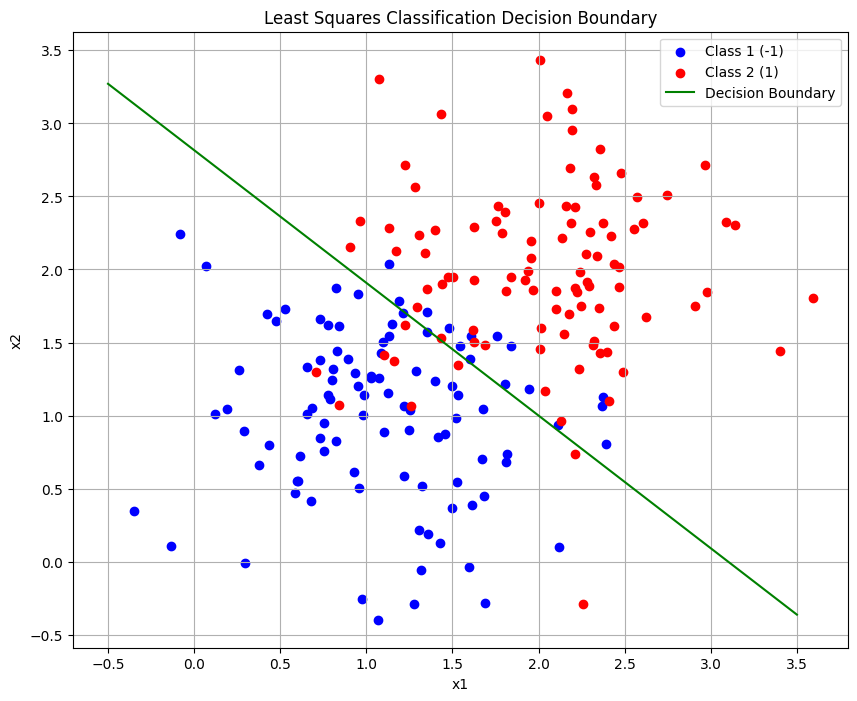

Laplacian test Dataset(Labelled as 0 or 1)
Accuracy is  97.5


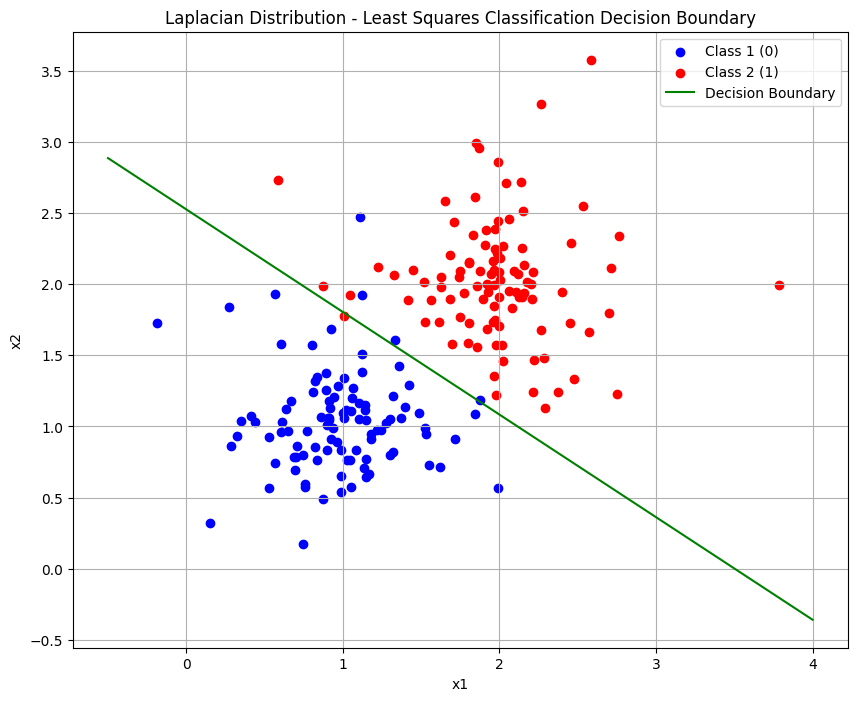

Laplacian test Dataset(Labelled as -1 or 1)
Accuracy is  97.5
[-0.63941601  0.32526984  0.45111422] [-2.27883202  0.65053968  0.90222845]


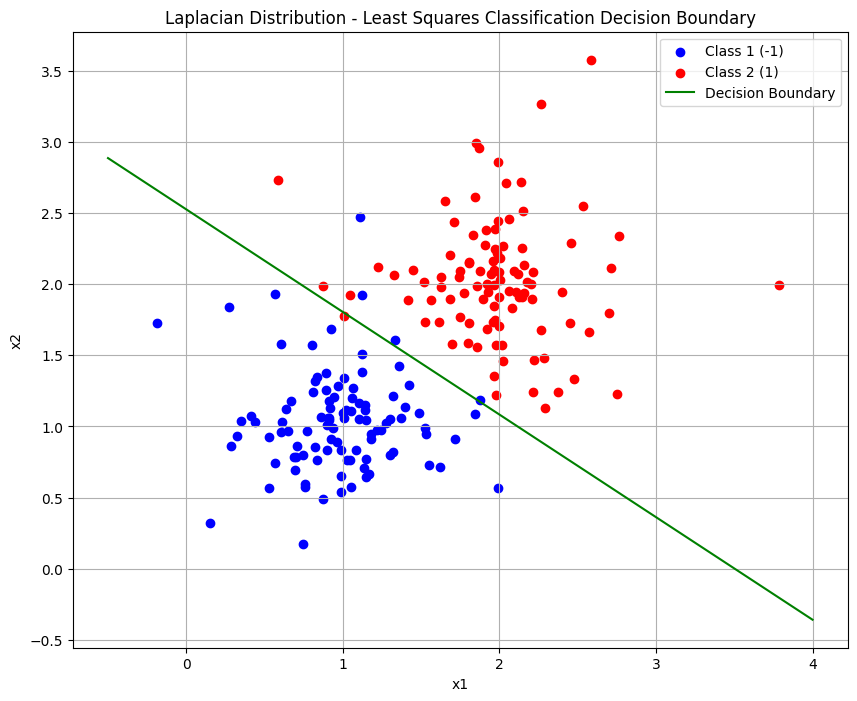

In [ ]:

########################################
#Part-1)-a: Data generation
########################################

#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
cov = [[0.3,0],[0,0.3]] #Covariance matrix. Same covariance for class1 and class2
n_tr = 100
n_te = 200


def generate_data(mean,cov_mat,n_sample):
    return np.random.multivariate_normal(mean,cov_mat,size=n_sample)

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
class1_tr =  generate_data(mean1,cov,n_tr//2)         
class2_tr =   generate_data(mean2,cov,n_tr//2)         
tr_data = np.vstack((class1_tr, class2_tr))     #total training data
tr_targets =  np.vstack((np.zeros((n_tr//2,1)), np.ones((n_tr//2,1))))    #Class labels. Assign the value "0" to class1 and the value "1" to class2.
# tr_targets.shape , tr_data.shape

class1_te = generate_data(mean1,cov,n_te//2)              
class2_te = generate_data(mean2,cov,n_te//2)            
te_data =    np.vstack((class1_te, class2_te))         # total testing data
te_targets =  np.vstack((np.zeros((n_te//2,1)), np.ones((n_te//2,1))))  #Class labels. Assign the value "0" to class1 and the value "1" to class2.
# te_targets.shape , te_data.shape

########################################
#Part-1)-b: Find the decision boundary
########################################
#Complete the below function
def LS_Classify(X_train, Y_train, X_test,thres=0.5):
    #Inputs: Training data, Training labels, and Testing data
    #Outputs: Testing labels,w as [w0,w1.w2]
    n_tr = len(X_train)
    n_te = len(X_test)
    
    X_tr_new = np.hstack((np.ones((n_tr,1)),X_train)) #[1,x1,x2]
    X_te_new = np.hstack((np.ones((n_te,1)),X_test)) #[1,x1,x2]
    # print(X_new.shape)
    
    w =(np.linalg.inv(X_tr_new.T@X_tr_new)@X_tr_new.T)@Y_train #[w0,w1,w2]

    Y_pred = X_te_new @ w
    # print(Y_pred.shape)
    Y_pred  = Y_pred.flatten()
    Y_te_pred = np.ones(n_te)
    if(thres == 0.5):
        Y_te_pred[Y_pred<thres] =0
    else:
        Y_te_pred[Y_pred<thres] =-1
    return Y_te_pred.reshape((n_te,1)),w.flatten()


# #Get the test data predictions
# predictions,W = LS_Classify(tr_data, tr_targets, te_data)

##########################################
#Part-1)-c: Evaluate the quality of decision boundary
##########################################
#Complete the below function
def LS_Classify_Accuracy(Y_test, Y_pred):
    '''
    #Inputs: Ground truth test labels and predicted test labels
    #Outputs: Accuracy
    # '''
    n = len(Y_test)
    corr = 0
  
    for i in range(n):
        if(Y_test[i][0] == Y_pred[i][0]):
            corr += 1
    acc = (corr/n) *100
    print("Accuracy is ",acc)
    return acc


predictions ,W= LS_Classify(tr_data, tr_targets, te_data,thres=0.5)
acc = LS_Classify_Accuracy(te_targets,predictions)
print("Accuracy on test Dataset: ",acc," % " )


# ##########################################
# #Part-1)-d: Visualize the decision boundary
# ##########################################
w0,w1,w2 = W
plt.figure(figsize=(10,8))
x1 = np.linspace(-0.5,3.5,10000)
# Solving for x2: x2 = (0.5 - w0 - w1*x1) / w2
x2 = (0.5 - w0 - w1*x1) / w2

plt.scatter(class1_te[:, 0], class1_te[:, 1], c='blue', label='Class 1 (0)')
plt.scatter(class2_te[:, 0], class2_te[:, 1], c='red', label='Class 2 (1)')
plt.plot(x1, x2, 'g-', label='Decision Boundary')

plt.title('Least Squares Classification Decision Boundary')
plt.xlabel('x1')
plt.ylabel('x2')
plt.grid(True)
plt.legend()
plt.show()

# # ##########################################
# # #Part-1)-e: Change the target label notation, and repeat the experiments
# # ##########################################
tr_targets2 =  np.vstack((-np.ones((n_tr//2,1)), np.ones((n_tr//2,1))))    #Class labels. Assign the value "-1" to class1 and the value "1" to class2.
te_targets2 =  np.vstack((-np.ones((n_te//2,1)), np.ones((n_te//2,1))))  #Class labels. Assign the value "-1" to class1 and the value "1" to class2.

predictions2,W2 = LS_Classify(tr_data, tr_targets2, te_data,0)
acc2 = LS_Classify_Accuracy(te_targets2,predictions2)
print("Accuracy on test Dataset(Labelled as -1 or 1): ",acc2," % " )

w0,w1,w2 = W2
plt.figure(figsize=(10,8))
x1 = np.linspace(-0.5,3.5,10000)
# Solving for x2: x2 = (- w0 - w1*x1) / w2
x2 = (- w0 - w1*x1) / w2

# Plot data points
plt.scatter(class1_te[:, 0], class1_te[:, 1], c='blue', label='Class 1 (-1)')
plt.scatter(class2_te[:, 0], class2_te[:, 1], c='red', label='Class 2 (1)')
# Plot decision boundary
plt.plot(x1, x2, 'g-', label='Decision Boundary')

plt.title('Least Squares Classification Decision Boundary')
plt.xlabel('x1')
plt.ylabel('x2')
plt.grid(True)
plt.legend()
plt.show()


# ##########################################
# #Part-1)-f: Repeat the experiments with Laplacial distribution
# ##########################################
#Set the parameters of class distribution
mean1 = [1,1]           #Mean of class1
mean2 = [2,2]           #Mean of class2
scale_vector = [0.3,0.3] #Covariance matrix. Same covariance for class1 and class2
n_tr = 100
n_te = 200

# 1D laplacian data
def generate_lap_data(loc,scale, size):
    return np.random.laplace(loc=loc, scale=scale, size=size)

def generate_multivariate_laplacian(mean_vector, scale_vector, n_samples):
    dim = len(mean_vector)
    samples = np.zeros((n_samples, dim))
    # N-Dim data 
    for i in range(dim):
        samples[:,i] = generate_lap_data(mean_vector[i],scale_vector[i], n_samples)
    return samples

#Generate training data. You can use "np.random.multivariate_normal()" function to sample data points from multivariate Gaussian distribution
print("Laplacian test Dataset(Labelled as 0 or 1)")
class1_tr_lap =  generate_multivariate_laplacian(mean1,scale_vector,n_tr//2)         
class2_tr_lap =   generate_multivariate_laplacian(mean2,scale_vector,n_tr//2)         
tr_data_lap = np.vstack((class1_tr_lap, class2_tr_lap))
tr_targets_lap =  np.vstack((np.zeros((n_tr//2,1)), np.ones((n_tr//2,1))))    #Class labels. Assign the value "0" to class1 and the value "1" to class2.

#Generate testing data.
class1_te_lap = generate_multivariate_laplacian(mean1,scale_vector,n_te//2)             
class2_te_lap = generate_multivariate_laplacian(mean2,scale_vector,n_te//2)            
te_data_lap =    np.vstack((class1_te_lap, class2_te_lap))    # total testing data
te_targets_lap =  np.vstack((np.zeros((n_te//2,1)), np.ones((n_te//2,1))))  #Class labels. Assign the value "0" to class1 and the value "1" to class2.

# for laplacian
predictions_lap,W_lap = LS_Classify(tr_data_lap, tr_targets_lap, te_data_lap,0.5)
acc_lap = LS_Classify_Accuracy(te_targets_lap,predictions_lap)


w0,w1,w2 = W_lap
plt.figure(figsize=(10,8))
x1 = np.linspace(-0.5,4,10000)
# Solving for x2: x2 = (0.5 - w0 - w1*x1) / w2
x2 = (0.5- w0 - w1*x1) / w2

plt.scatter(class1_te_lap[:, 0], class1_te_lap[:, 1], c='blue', label='Class 1 (0)')
plt.scatter(class2_te_lap[:, 0], class2_te_lap[:, 1], c='red', label='Class 2 (1)')
plt.plot(x1, x2, 'g-', label='Decision Boundary')
plt.title('Laplacian Distribution - Least Squares Classification Decision Boundary')
plt.xlabel('x1')
plt.ylabel('x2')
plt.grid(True)
plt.legend()
plt.show()


print("Laplacian test Dataset(Labelled as -1 or 1)")
tr_targets2_lap =  np.vstack((-np.ones((n_tr//2,1)), np.ones((n_tr//2,1))))  #Class labels. Assign the value "-1" to class1 and the value "1" to class2.
te_targets2_lap =  np.vstack((-np.ones((n_te//2,1)), np.ones((n_te//2,1))))  #Class labels. Assign the value "-1" to class1 and the value "1" to class2.
predictions2_lap,W2_lap = LS_Classify(tr_data_lap, tr_targets2_lap, te_data_lap,0)
acc2_lap = LS_Classify_Accuracy(te_targets2_lap,predictions2_lap)

w0,w1,w2 = W2_lap
print(W_lap,W2_lap)
plt.figure(figsize=(10,8))
x1 = np.linspace(-0.5,4,10000)
# Solving for x2: x2 = (- w0 - w1*x1) / w2
x2 = (- w0 - w1*x1) / w2

plt.scatter(class1_te_lap[:, 0], class1_te_lap[:, 1], c='blue', label='Class 1 (-1)')
plt.scatter(class2_te_lap[:, 0], class2_te_lap[:, 1], c='red', label='Class 2 (1)')
plt.plot(x1, x2, 'g-', label='Decision Boundary')
plt.title('Laplacian Distribution - Least Squares Classification Decision Boundary')
plt.xlabel('x1')
plt.ylabel('x2')
plt.grid(True)
plt.legend()
plt.show()

<b> Report your observations </b>

1.  After adjusting the decision threshold appropriately, regardless of whether we use 0/1 or -1/+1 label encoding ,we'll get the same decision boundary.

2.  Inverse square solution classifies better when data coming from laplacian than gaussian.

3.  The weight vector or the decision surface that we get on changing the target labels remain the same. This is because the relative magnitude of difference caused in the Error function remains same.

4.  The laplace distribution has more points located towards their respective means. As a result, the Accuracy that we get in classification of Laplacian points is higher than that of Gaussian.

5.  The accuracy of the linear classification model can be further improved by employing more robust approaches like perceptron rather than regression.

6.  This method doesn't handle the true outliers correctly and can output incorrect decision boundaries.


## Part - (2) : Linear & Fisher Discriminant analysis


<b> Part - (2) : Linear & Fisher Discriminant analysis : </b> In this segment of the programming task, you'll learn the technique of projecting data from higher-dimensional to lower-dimensional space using both Linear Discriminant Analysis and Fisher Discriminant Analysis.

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Projection using only the between-class covariance: Develop a function for performing projection from 2-D space to 1-D utilizing Linear Discriminant Analysis. It's important to emphasize that this method only considers the between-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

c). Projection utilizing both between-class and within-class covariance: Create a function to perform projection from 2-D space to 1-D using Fisher Discriminant Analysis. It's essential to mention that this method considers both between-class covariance and within-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

d). Extend Fisher discriminant analysis function to project the data from N dimenision to K dimension.

e). Report your observations.


In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import random

3
[[ 0.        ]
 [-0.72013629]
 [-0.69383263]]


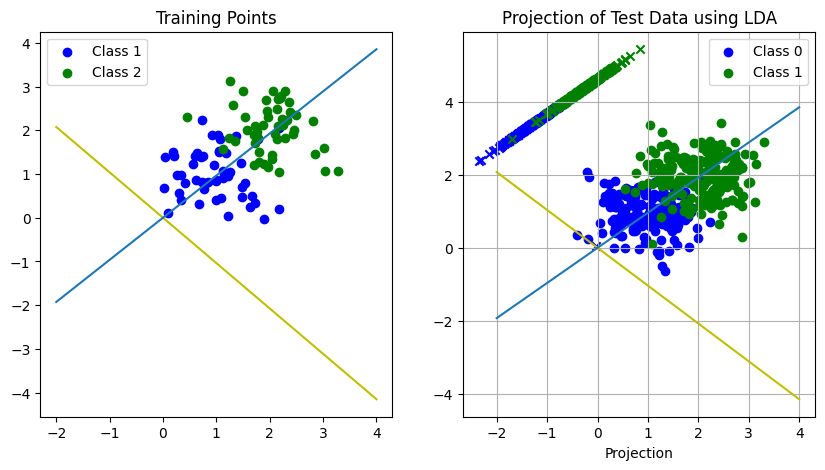

Accuracy with LDA: 91.75


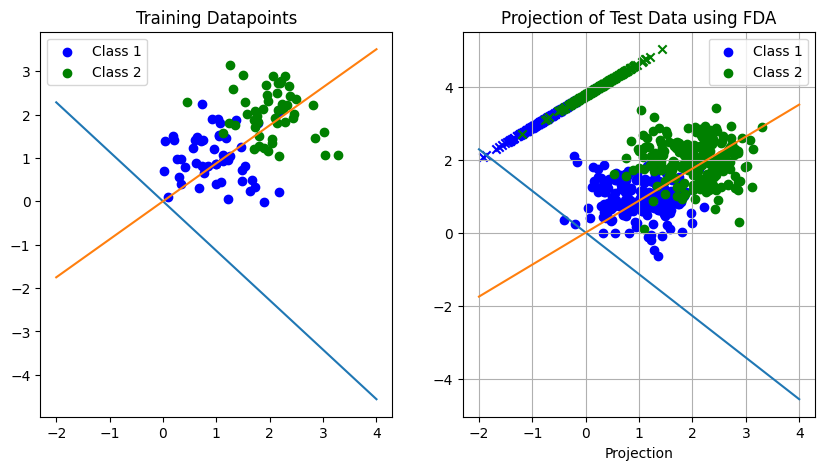

Accuracy with FDA: 91.75
Accuracy with FDA_K: 91.75


In [ ]:

from os import name
########################################
#Part-2)-(a): Data generation
########################################

# Set the parameters of class distribution
mean1 = [1, 1]           # Mean of class1
mean2 = [2, 2]           # Mean of class2
cov = [[0.3, 0], [0, 0.3]] # Covariance matrix. Same covariance for class1 and class2

# Generate training data
class1_tr = np.random.multivariate_normal(mean1, cov, 50)  # Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)  # Class2 training data
tr_data = np.concatenate((class1_tr, class2_tr))  # Combine class1 training and class2 training data
tr_targets = np.reshape(np.concatenate((np.zeros(50), np.ones(50))),(100,1))  # Class labels. Assign the value "0" to class1 and the value "1" to class2.

# Generate testing data
class1_te = np.random.multivariate_normal(mean1, cov, 200)  # Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)  # Class2 testing data
te_data = np.concatenate((class1_te, class2_te))  # Combine class1 testing and class2 testing data
te_targets = np.reshape(np.concatenate((np.zeros(200), np.ones(200))),(400,1))  # Class labels. Assign the value "0" to class1 and the value "1" to class2.       #Class labels. Assign the value "0" to class1 and the value "1" to class2.
def LS_hard(Y_pred, a, b):
    c = []
    for i in Y_pred:
        if abs(a - i) > abs(b - i):
            c.append(b)
        else:
            c.append(a)
    return np.reshape(c, Y_pred.shape)


def LS_Classify_Accuracy(Y_pred, Y_test, a, b):
    # Inputs: Ground truth test labels and predicted test labels
    # Outputs: Accuracy
    # Calculate the number of correct predictions
    yi=LS_hard(Y_pred, a, b)
    correct=0
    for i in range(0,yi.shape[0]):
      if(yi[i]==Y_test[i]):
        correct+=1
    total = Y_test.shape[0]
    accuracy = (correct / total) * 100
    return accuracy

########################################
#Part-2)-(b)
########################################
#Complete the below function

globalpoint=[0,0]
def LDA_classify(X_train, Y_train, X_test):
    # Inputs: Training data, Training labels, and Testing data
    # Outputs: Between class covariance
    # Compute the mean vectors for each class
    X_train=np.hstack((np.ones((X_train.shape[0],1)),X_train))
    Y_train=Y_train.reshape((X_train.shape[0],1))
    X_test=np.hstack((np.ones((X_test.shape[0],1)),X_test))
    mean_class1= np.array([0,0,0],dtype='float')
    mean_class2 = np.array([0,0,0],dtype='float')
    for i in range(0,X_train.shape[0]):
      if(Y_train[i]==0):
        mean_class1+=X_train[i]
      else:
        mean_class2+=X_train[i]
    print(mean_class1.shape[0])
    mean_class1=mean_class1/mean_class1[0]
    mean_class2=mean_class2/mean_class2[0]
    between_class_cov=np.identity(3)
    w = np.linalg.inv(between_class_cov) @ (mean_class1 - mean_class2)
    w=w.reshape((w.shape[0],1))
    w=w/np.linalg.norm(w)
    
    # the threshold for classification
    threshold = 0.5 *( w.T@(mean_class1+mean_class2))
    globalpoint=(mean_class1+mean_class2)*0.5
    
    # projecting the data onto 1-dimensional space
    projection = np.dot(X_test, w)
    
    predictions=[]
    for i in projection:
      if(i>=threshold):
        predictions.append(0)
      else:
        predictions.append(1)
    return np.reshape(predictions,(projection.shape[0],1)), w

predictions, w = LDA_classify(tr_data, tr_targets, te_data)
fig,plot1=plt.subplots(1,2,figsize=(10, 5))
plot1[0].scatter(tr_data[:50,0],tr_data[:50,1],color='blue',label="Class 1")
plot1[0].scatter(tr_data[50:,0],tr_data[50:,1],color='green',label="Class 2")
plot1[1].scatter(te_data[:200,0],te_data[:200,1],color='blue',label="Class 1")
plot1[1].scatter(te_data[200:,0],te_data[200:,1],color='green',label="Class 2")
plot1[0].set_title("Training Points")
plot1[1].set_title("Testing Points")
xvalues=np.linspace(-2,4,1000)
yvalues=((-w[0,0]-w[1,0]*xvalues)/w[2,0])
plot1[0].plot(xvalues,yvalues,color='y')
plot1[1].plot(xvalues,yvalues,color='y')
plot1[0].legend()
plot1[1].legend()
print(w)


def project_points_on_line(points, line_point1, line_point2):
    points = np.array(points)
    line_point1 = np.array(line_point1)
    line_point2 = np.array(line_point2)
    line_vector = line_point2 - line_point1
    projection_lengths = np.dot(points - line_point1, line_vector) / np.dot(line_vector, line_vector)
    projected_points = line_point1 + projection_lengths[:, np.newaxis] * line_vector
    return projected_points


def LDA_project(w, X_test, Y_test):
  #Inputs: weight vector, testing data, and testing labels
  w_n=np.reshape([w[0,0],-w[2,0],w[1,0]],(3,1))
  xvalues=np.linspace(-2,4,1000)
  yvalues=((-w_n[0,0]-w_n[1,0]*xvalues)/w_n[2,0])
  plot1[0].plot(xvalues,yvalues,label="Projected Line")
  plot1[1].plot(xvalues,yvalues,label="Projected Line")
  s=project_points_on_line(X_test,[-10,-5],[1-10,-5+w[2,0]/w[1,0]])
  X_test=np.hstack((np.ones((X_test.shape[0],1)),X_test))
  plot1[1].scatter(s[:200,0],s[:200,1],color='b',marker='x')
  plot1[1].scatter(s[200:,0],s[200:,1],color='g',marker='x')
  s=project_points_on_line([globalpoint],[2,2],[2+1,2+w[2,0]/w[1,0]])
  plot1[1].scatter(s[:,0],s[:,1],color='b',marker='x')
  plot1[1].set_xlabel('Projection')
  plot1[1].set_title('Projection of Test Data using LDA')
  plot1[1].legend(['Class 0', 'Class 1'])
  plot1[1].grid(True)
  plt.show()


LDA_project(w, te_data, te_targets)
acc=LS_Classify_Accuracy(predictions,te_targets,0,1)
print('Accuracy with LDA:', acc)


########################################
#Part-2)-(c)
########################################
def FDA_classify(X_train, Y_train, X_test):
    # Inputs: Training data, Training labels, and Testing data
    # Outputs: Between class covariance
    # Compute the mean vectors for each class
    
    X_train=np.hstack((np.ones((X_train.shape[0],1)),X_train))
    Y_train=Y_train.reshape((X_train.shape[0],1))
    X_test=np.hstack((np.ones((X_test.shape[0],1)),X_test))
    mean_class1= np.array([0,0,0],dtype='float')
    mean_class2 = np.array([0,0,0],dtype='float')
    for i in range(0,X_train.shape[0]):
      if(Y_train[i]==0):
        mean_class1+=X_train[i]
      else:
        mean_class2+=X_train[i]
    mean_class1=mean_class1/mean_class1[0]
    mean_class2=mean_class2/mean_class2[0]
  
    cov_class1 = np.cov(X_train[:int(X_train.shape[0]/2)].T)
    cov_class2 = np.cov(X_train[int(X_train.shape[0]/2):].T)
    Sw=cov_class1+cov_class2
    between_class_cov=np.identity(3) # between_class_cov = np.outer((mean_class1 - mean_class2), (mean_class1 - mean_class2))
    lamda=1e-10
    Sw+=lamda*np.identity(Sw.shape[0])

    # Compute the weight vector (LDA projection vector)
    # print(mean_class1,mean_class2,between_class_cov)
    w = np.linalg.inv(Sw) @ (mean_class1 - mean_class2)
    w=w.reshape((w.shape[0],1))
    w=w/np.linalg.norm(w)
    threshold = 0.5 *( w.T@(mean_class1+mean_class2))
    
    projection = np.dot(X_test, w)
    predictions=[]
    for i in projection:
      if(i>=threshold):
        predictions.append(0)
      else:
        predictions.append(1)
    return np.array(predictions), w


predictions,w = FDA_classify(tr_data, tr_targets, te_data)
fig,plot1=plt.subplots(1,2,figsize=(10, 5))
plot1[0].scatter(tr_data[:50,0],tr_data[:50,1],color='blue',label="Class 1")
plot1[0].scatter(tr_data[50:,0],tr_data[50:,1],color='green',label="Class 2")
plot1[1].scatter(te_data[:200,0],te_data[:200,1],color='blue',label="Class 1")
plot1[1].scatter(te_data[200:,0],te_data[200:,1],color='green',label="Class 2")
plot1[0].legend()
plot1[1].legend()
xvalues=np.linspace(-2,4,1000)
yvalues=((-w[0,0]-w[1,0]*xvalues)/w[2,0])
plot1[0].plot(xvalues,yvalues)
plot1[1].plot(xvalues,yvalues)

def FDA_project(w, X_test, Y_test):
  #Inputs: weight vector, testing data, and testing labels
  w_n=np.reshape([w[0,0],-w[2,0],w[1,0]],(3,1))
  xvalues=np.linspace(-2,4,1000)
  yvalues=((-w_n[0,0]-w_n[1,0]*xvalues)/w_n[2,0])
  plot1[0].plot(xvalues,yvalues,label="Projected Line")
  plot1[0].set_title('Training Datapoints')
  plot1[1].plot(xvalues,yvalues,label="Projected Line")
  s=project_points_on_line(X_test,[-10,-5],[1-10,-5+w[2,0]/w[1,0]])
  X_test=np.hstack((np.ones((X_test.shape[0],1)),X_test))
  plot1[1].scatter(s[:200,0],s[:200,1],color='b',marker='x')
  plot1[1].scatter(s[200:,0],s[200:,1],color='g',marker='x')
  plot1[1].set_xlabel('Projection')
  plot1[1].set_title('Projection of Test Data using FDA')
  plot1[1].legend(['Class 1', 'Class 2'])
  plot1[1].grid(True)
  plt.show()
  return 0


FDA_project(w, te_data, te_targets)
acc=LS_Classify_Accuracy(predictions,te_targets,0,1)
print('Accuracy with FDA:', acc)

########################################
#Part-2)-(d)
########################################
def FDA_project_K(X_train, Y_train, X_test, k):
  X_train=np.hstack((np.ones((X_train.shape[0],1)),X_train))
  Y_train=Y_train.reshape((X_train.shape[0],1))
  X_test=np.hstack((np.ones((X_test.shape[0],1)),X_test))
  mean_class1= np.array([0,0,0],dtype='float')
  mean_class2 = np.array([0,0,0],dtype='float')
  for i in range(0,X_train.shape[0]):
    if(Y_train[i]==0):
      mean_class1+=X_train[i]
    else:
      mean_class2+=X_train[i]
  mean_class1=np.reshape(mean_class1/mean_class1[0],(3,1))
  mean_class2=np.reshape(mean_class2/mean_class2[0],(3,1))
  #  between-class scatter matrix
  cov_class1 = np.cov(X_train[:int(X_train.shape[0]/2)].T)
  cov_class2 = np.cov(X_train[int(X_train.shape[0]/2):].T)
  Sw=cov_class1+cov_class2
  d=mean_class1-mean_class2
  print(d)
  Sb=(mean_class1-mean_class2)@((mean_class1-mean_class2).T)
  lamda=0.00001
  # weight vector (LDA projection vector)
  Sw=Sw+np.identity(Sw.shape[0])*lamda
  print(Sb.shape,Sw.shape)
  matrix=np.linalg.inv(Sw)@Sb

  eigenvalues, eigenvectors = np.linalg.eig(matrix)
  print(eigenvectors)
  w = eigenvectors[:,k]
  w=w.reshape((3,1))
  #threshold for classification
  threshold = 0.5 *( w.T@(mean_class1+mean_class2))

  # data onto 1-dimensional space
  projection = np.dot(X_test, w)
  predictions=[]
  for i in projection:
    if(i>=threshold):
      predictions.append(0)
    else:
      predictions.append(1)
  return np.array(predictions), w


def FDA_project_l(w, X_test, Y_test):
  #Inputs: weight vector, testing data, and testing labels
  w_n=np.reshape([w[0,0],-w[2,0],w[1,0]],(3,1))  # w_n,w=w,w_n
  xvalues=np.linspace(-2,4,1000)
  yvalues=((-w_n[0,0]-w_n[1,0]*xvalues)/w_n[2,0])
  plot1[0].plot(xvalues,yvalues,label="Projected Line")
  plot1[1].plot(xvalues,yvalues,label="Projected Line")
  plot1[0].set_title('Training Datapoints')
  s=project_points_on_line(X_test,[-10,-5],[1-10,-5+w[2,0]/w[1,0]])
  plot1[1].scatter(s[:200,0],s[:200,1],color='b',marker='x')
  plot1[1].scatter(s[200:,0],s[200:,1],color='g',marker='x')
  X_test=np.hstack((np.ones((X_test.shape[0],1)),X_test))
  plot1[1].legend()
  plot1[1].set_xlabel('Projection')
  plot1[1].set_title('Projection of Test Data using FDA_K')
  plot1[1].legend(['Class 0', 'Class 1'])
  plot1[1].grid(True)
  plt.show()
  #Project the test data onto 1-dimensional space
  return 0


FDA_project_l(w, te_data, te_targets)
acc=LS_Classify_Accuracy(predictions,te_targets,0,1)
print('Accuracy with FDA_K:', acc)


<b> Report your observations </b>

1. Linear Discriminant analysis ensures that the means of the projected data are as highly separated as possible.

2. However this method doesn't handle the errors caused due to the overlapping of the projected datapoints.

3. Finding the appropriate threshold is also a challenging task as we dont take into account the variance of the data.

4. FDA is an improvement over LDA as it tries to take into account even the variance in the data.

5. The accuracy of both the models is around 92% in this example. The multiclass FDA model which projects into to K dimensional space is much better and yields slightly higher accuracy.


## <b> Part (3) : Classification using perceptron algorithm </b>


a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Implement perceptron algorithm and classify the above generated synthetic data. Plot the decision boundary/regions.

c). Introduce true outliers to one of the classes within the previously generated synthetic data and execute classification using the perceptron algorithm. Illustrate the decision boundary/regions. Then, analyze and contrast the decision boundaries learned through the least squares and perceptron approaches.

d). Let us consider four Gaussian distributions with mean vectors as $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$, $\begin{bmatrix} 0  \\ 1  \end{bmatrix}$, $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$, and $\begin{bmatrix} 1  \\ 0  \end{bmatrix}$, respectively. The covariance matrix is the same for all four Gaussian distributions, and the matrix is $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Sample 60 data points from each distribution to get 240 data points. Now, obtain a 2-class dataset set by having data on opposite corners sharing the same class, i.e., data points sampled from Gaussian distributions with mean vectors $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$ and $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ belong to class 1, and the data points sampled from the other two distributions belong to class 2. Assign class 1 data points with the label +1 and class 2 with the label -1. Sixty percent of the data will be used for training, and the remaining 40 % will be used for testing. You can see that it represents the XOR problem. Classify this data set using the perceptron algorithm.

e). Report your observations


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random

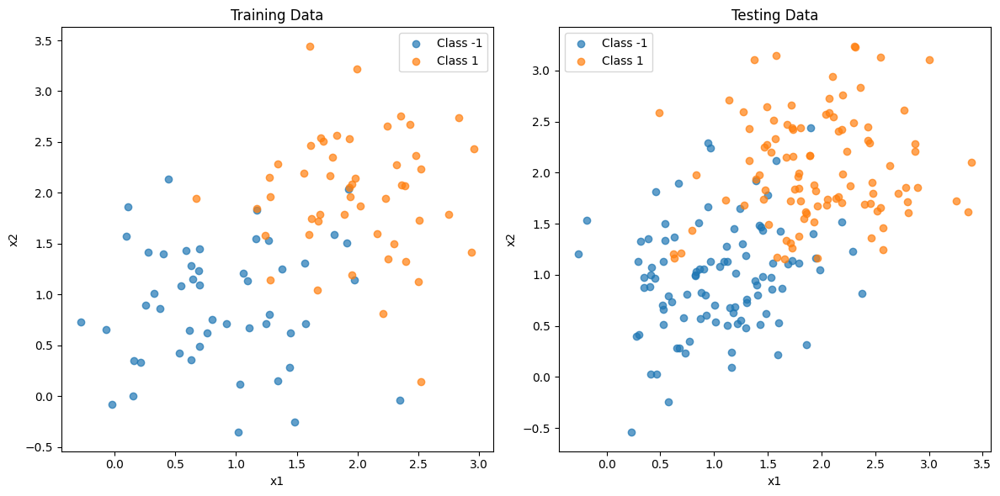

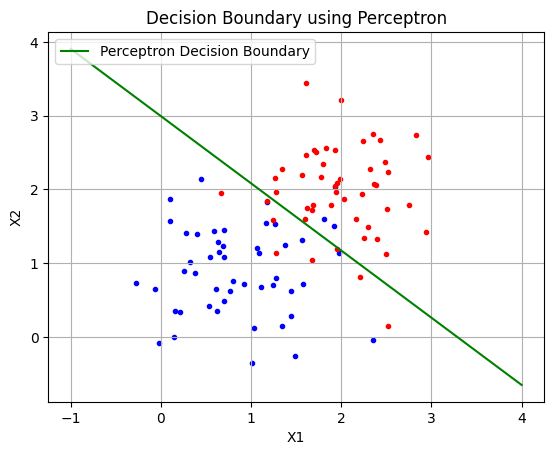

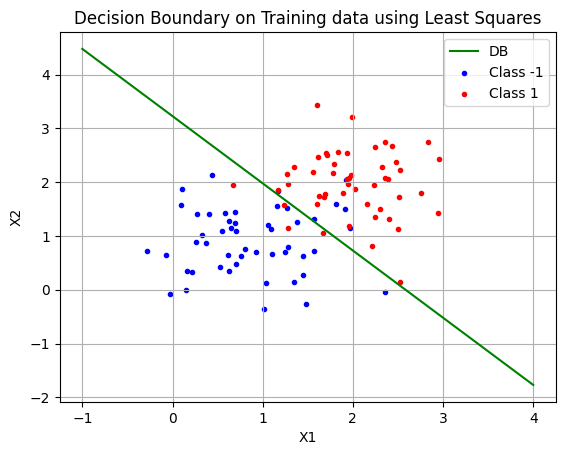

Outlier is added to training data


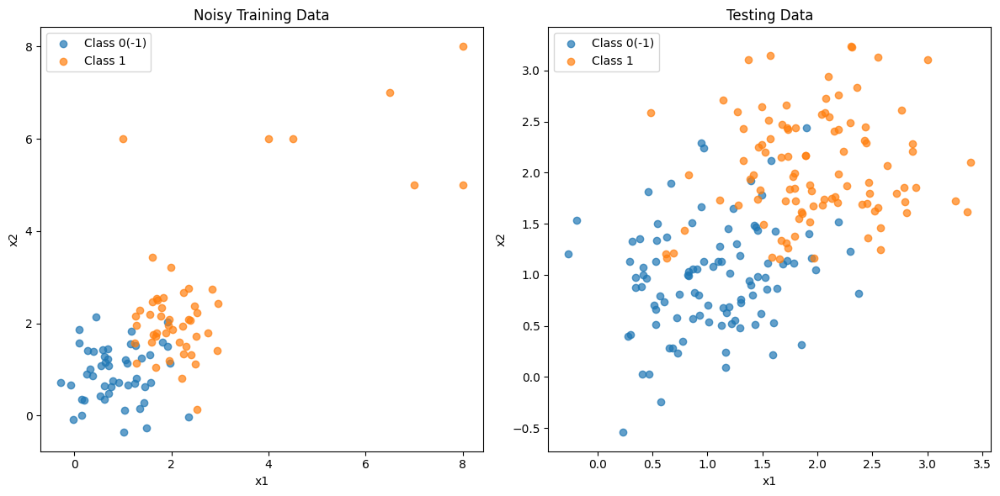

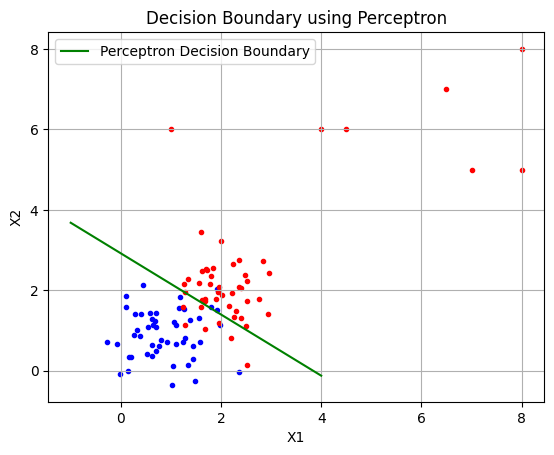

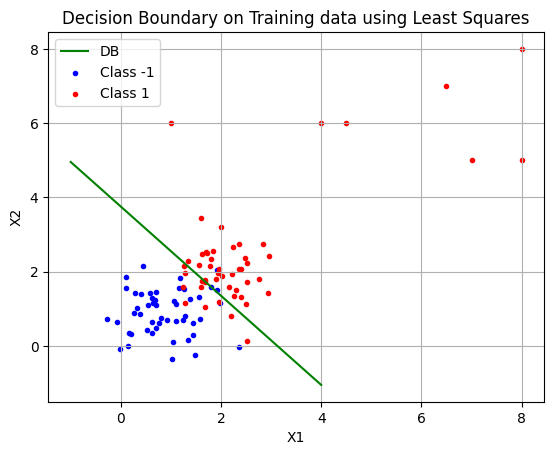

Weights from Perceptron (Part b): [  73.81549305   67.27923247 -221.        ]
Weights from Least Squares (Part b): [ 0.65755387  0.52643532 -1.6992001 ]
Weights from Perceptron with Outliers (Part c): [  77.42222876   58.86951492 -226.        ]
Weights from Least Squares with Outliers (Part c): [ 0.241277    0.20085716 -0.75394042]
Misclassified points with Perceptron (Part b): 25
Misclassified points with Least Squares (Part b): 27
Misclassified points with Perceptron with Outliers (Part c): 25
Misclassified points with Least Squares with Outliers (Part c): 25


In [ ]:
########################################
# Part-3)-(a): Data generation
########################################
mean1 = [1, 1]  # Mean of class1
mean2 = [2, 2]  # Mean of class2
cov = [[0.3, 0], [0, 0.3]]  # Covariance matrix. Same covariance for class1 and class2

n_tr = 100
n_te = 200

# Generate training data
class1_tr = np.random.multivariate_normal(mean1, cov, n_tr//2)  # Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, n_tr//2)  # Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))  # Combine class1 and class2 training data
tr_targets = np.hstack((-np.ones(n_tr//2), np.ones(n_tr//2)))  # Class labels: 0 for class1, 1 for class2

# Generate testing data
class1_te = np.random.multivariate_normal(mean1, cov, n_te//2)
class2_te = np.random.multivariate_normal(mean2, cov, n_te//2)
te_data = np.vstack((class1_te, class2_te))
te_targets = np.hstack((-np.ones(n_te//2), np.ones(n_te//2)))

# Visualization subplots for train and test data
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].scatter(class1_tr[:, 0], class1_tr[:, 1], label="Class -1", alpha=0.7)
axes[0].scatter(class2_tr[:, 0], class2_tr[:, 1], label="Class 1", alpha=0.7)
axes[0].legend()
axes[0].set_title("Training Data")
axes[0].set_xlabel("x1")
axes[0].set_ylabel("x2")
axes[1].scatter(class1_te[:, 0], class1_te[:, 1], label="Class -1", alpha=0.7)
axes[1].scatter(class2_te[:, 0], class2_te[:, 1], label="Class 1", alpha=0.7)
axes[1].legend()
axes[1].set_title("Testing Data")
axes[1].set_xlabel("x1")
axes[1].set_ylabel("x2")
plt.tight_layout()
plt.show()

########################################
# Part-3)-(b): Perceptron Algorithm
########################################
def Perceptron(X_train, Y_train, X_test):
    nx, ny = X_train.shape
    epochs = 10
    X = np.hstack((X_train, np.ones((nx, 1)))) #[[x2,x1,1]]
    w = np.zeros(1+ny) #[w2,w1,w0]

    for epoch in range(epochs):
        for i in range(nx):
            prediction = 1 if np.dot(w, X[i]) > 0 else 0
            error = Y_train[i] - prediction
            w += error * X[i]

    X_test_aug = np.hstack((X_test, np.ones((X_test.shape[0], 1))))
    predictions = np.where(np.dot(X_test_aug, w) >= 0, 1, -1)

    return predictions, w #[w2,w1,w0]

##########################################
# Plot the decision boundary using perceptron
##########################################
# Train perceptron and get predictions
predictions, W = Perceptron(tr_data, tr_targets, te_data)

def plot_decision_boundary(W,nP=tr_data.shape[0]):
    x = np.linspace(-1, 4, 1000)
    y = -(W[1] / W[0]) * x - (W[2] / W[0])
    plt.plot(x, y, '-g', label='Perceptron Decision Boundary')
    plt.title('Decision Boundary using Perceptron')
    plt.legend(loc='upper left')

    plt.scatter(tr_data[:nP//2, 0], tr_data[:nP//2, 1], label='Class 0(-1)', color='blue', marker='.')
    plt.scatter(tr_data[nP//2:, 0], tr_data[nP//2:, 1], label='Class 1(1)', color='red', marker='.')

    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.grid()
    plt.show()

plot_decision_boundary(W)

##########################################
# Plot the decision boundary using least squares
##########################################
def find_plot_ls_boundary(tr_data,tr_targets = tr_targets):
    nP = tr_data.shape[0]
    X_ls = np.hstack((tr_data, np.ones((nP, 1))))
    w_ls = np.linalg.pinv(X_ls.T @ X_ls) @ X_ls.T @ tr_targets
    x = np.linspace(-1, 4, 100)
    y_ls = -(w_ls[0] * x + w_ls[2]) / w_ls[1]
    plt.plot(x, y_ls, '-g', label='DB')
    plt.title('Decision Boundary on Training data using Least Squares')
    plt.legend(loc='upper left')
    
    plt.scatter(tr_data[:nP//2, 0], tr_data[:nP//2, 1], label='Class -1', color='blue', marker='.')
    plt.scatter(tr_data[nP//2:, 0], tr_data[nP//2:, 1], label='Class 1', color='red', marker='.')

    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.legend()
    plt.grid()
    plt.show()
    return w_ls

W_ls = find_plot_ls_boundary(tr_data)

##########################################
# Part-3)-(c): Add true outliers and compare methods
##########################################
print("Outlier is added to training data")
outliers = np.array([[1, 6], [4, 6], [4.5, 6], [7, 5],[8,8],[8,5],[6.5,7]])
tr_data[-7:] = outliers
n_tr = len(tr_data)
n_te = len(te_data)

# Visualization subplots for train and test data with outliers
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].scatter(tr_data[:n_tr//2, 0], tr_data[:n_tr//2, 1], label="Class 0(-1)", alpha=0.7)
axes[0].scatter(tr_data[n_tr//2:, 0], tr_data[n_tr//2:, 1], label="Class 1", alpha=0.7)
axes[0].legend()
axes[0].set_title("Noisy Training Data")
axes[0].set_xlabel("x1")
axes[0].set_ylabel("x2")
axes[1].scatter(te_data[:n_te//2, 0], te_data[:n_te//2, 1], label="Class 0(-1)", alpha=0.7)
axes[1].scatter(te_data[n_te//2:, 0], te_data[n_te//2:, 1], label="Class 1", alpha=0.7)
axes[1].legend()
axes[1].set_title("Testing Data")
axes[1].set_xlabel("x1")
axes[1].set_ylabel("x2")
plt.tight_layout()
plt.show()


predictions_outliers, W_out = Perceptron(tr_data, tr_targets, te_data)
plot_decision_boundary(W_out)
W_ls_out=find_plot_ls_boundary(tr_data)

print("Weights from Perceptron (Part b):", W)
print("Weights from Least Squares (Part b):", W_ls)
print("Weights from Perceptron with Outliers (Part c):", W_out)
print("Weights from Least Squares with Outliers (Part c):", W_ls_out)

#For comparing results 
def count_misclassified_points(W, data, targets):
    """
    Count the number of misclassified points given weights, data, and targets.
    """
    data_with_bias = np.hstack((data, np.ones((data.shape[0], 1))))

    predictions = np.sign(np.dot(data_with_bias, W))
    
    # Count misclassified points
    misclassified = np.sum(predictions != targets)
    return misclassified

# Check misclassified points for each set of weights
misclassified_W = count_misclassified_points(W, te_data, te_targets)
misclassified_W_ls = count_misclassified_points(W_ls, te_data, te_targets)
misclassified_W_out = count_misclassified_points(W_out, te_data, te_targets)
misclassified_W_ls_out = count_misclassified_points(W_ls_out, te_data, te_targets)

# Print results
print("Misclassified points with Perceptron (Part b):", misclassified_W)
print("Misclassified points with Least Squares (Part b):", misclassified_W_ls)
print("Misclassified points with Perceptron with Outliers (Part c):", misclassified_W_out)
print("Misclassified points with Least Squares with Outliers (Part c):", misclassified_W_ls_out)


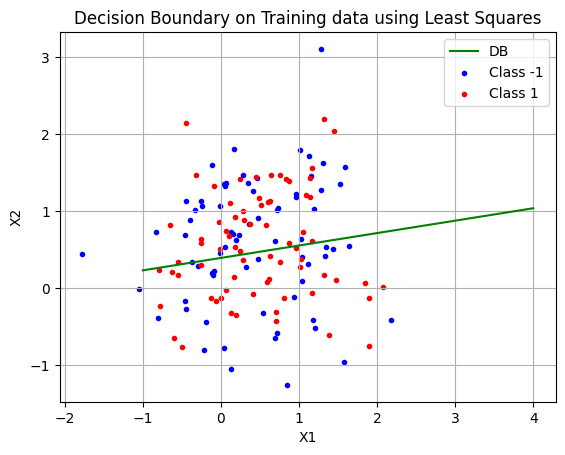

In [ ]:

##########################################
# Part-3)-(d): Data generation XOR
##########################################
def generate_xor_data():
    """
    Generate XOR dataset using four Gaussian distributions.
    Returns:
        xor_tr_data: Training data
        xor_tr_targets: Training labels
        xor_te_data: Testing data
        xor_te_targets: Testing labels
    """
    n = 240
    m1, m2, m3, m4 = [0, 0], [0, 1], [1, 1], [1, 0]
    cov = [[0.3, 0], [0, 0.3]]  # Covariance matrix (same for all distributions)

    np.random.seed(42)  
    c1_xor = np.vstack((np.random.multivariate_normal(m1, cov, n//4), np.random.multivariate_normal(m3, cov, n//4)))  # Class 1
    c2_xor = np.vstack((np.random.multivariate_normal(m2, cov, n//4), np.random.multivariate_normal(m4, cov, n//4)))  # Class 2

    # Combine data and assign labels
    xor_data = np.vstack((c1_xor, c2_xor))  # Combine all data points
    xor_targets = np.hstack((np.ones(c1_xor.shape[0]), -1 * np.ones(c2_xor.shape[0])))  # Labels: +1 for Class 1, -1 for Class 2

    # Shuffle the dataset manually
    indices = np.arange(xor_data.shape[0])
    np.random.shuffle(indices)
    xor_data = xor_data[indices]
    xor_targets = xor_targets[indices]

    # Split the dataset into training (60%) and testing (40%) sets
    split_idx = int(0.6 * xor_data.shape[0])  # 60% for training
    xor_tr_data = xor_data[:split_idx]
    xor_tr_targets = xor_targets[:split_idx]
    xor_te_data = xor_data[split_idx:]
    xor_te_targets = xor_targets[split_idx:]

    return xor_tr_data, xor_tr_targets, xor_te_data, xor_te_targets

xor_tr_data, xor_tr_targets, xor_te_data, xor_te_targets = generate_xor_data()

xor_preds, W_xor = Perceptron(xor_tr_data, xor_tr_targets, xor_te_data)
W_ls_xor = find_plot_ls_boundary(xor_tr_data, xor_tr_targets)

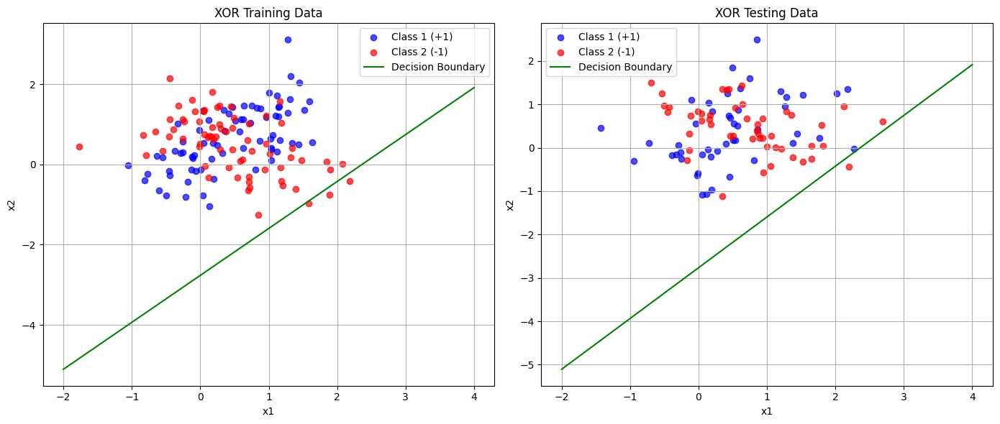

Misclassified points with Perceptron (Part b): 47
Misclassified points with Least Squares (Part b): 50


In [ ]:
# Plot XOR training and testing data with decision boundary
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].scatter(xor_tr_data[xor_tr_targets == 1][:, 0], xor_tr_data[xor_tr_targets == 1][:, 1], label="Class 1 (+1)", color="blue", alpha=0.7)
axes[0].scatter(xor_tr_data[xor_tr_targets == -1][:, 0], xor_tr_data[xor_tr_targets == -1][:, 1], label="Class 2 (-1)", color="red", alpha=0.7)
x = np.linspace(-2, 4, 1000)
y = -(W_xor[1] / W_xor[0]) * x - (W_xor[2] / W_xor[0])
axes[0].plot(x, y, label="Decision Boundary", color="green")
axes[0].set_title("XOR Training Data")
axes[0].set_xlabel("x1")
axes[0].set_ylabel("x2")
axes[0].legend()
axes[0].grid()

# Testing data
axes[1].scatter(xor_te_data[xor_te_targets == 1][:, 0], xor_te_data[xor_te_targets == 1][:, 1], label="Class 1 (+1)", color="blue", alpha=0.7)
axes[1].scatter(xor_te_data[xor_te_targets == -1][:, 0], xor_te_data[xor_te_targets == -1][:, 1], label="Class 2 (-1)", color="red", alpha=0.7)
axes[1].plot(x, y, label="Decision Boundary", color="green")
axes[1].set_title("XOR Testing Data")
axes[1].set_xlabel("x1")
axes[1].set_ylabel("x2")
axes[1].legend()
axes[1].grid()

plt.tight_layout()
plt.show()

misclassified_W_xor = count_misclassified_points(W_xor, xor_te_data, xor_te_targets)
misclassified_W_ls_xor = count_misclassified_points(W_ls_xor, xor_te_data, xor_te_targets)

print("Misclassified points with Perceptron (Part b):", misclassified_W_xor)
print("Misclassified points with Least Squares (Part b):", misclassified_W_ls_xor)

<b> Report your observations </b>

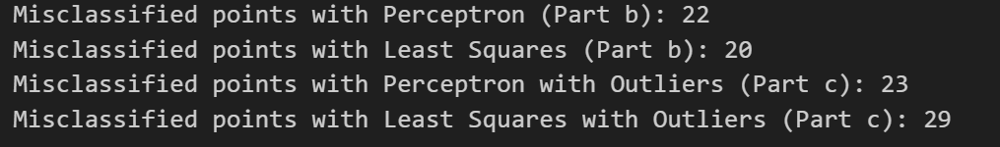

1. The perceptron algorithm requires slightly higher computations as the weight vector is updated for all the wrong points in each iteration.

2. It is handling the very true outliers better than LS method as it does'nt disturb the weight vector once all the points are correctly classified

3. When there are no outliers, Both LS and perceptron give simialar accuracies and almost overlap.

4. However when there are outliers, Perceptron performs much better than LS.

5. The perceptron algorithm cannot handle the non linear data that is when there is no linear surface available to separate the data.For Ex:- The XOR problem of classification cant be handled alone by perceptron.


## Part (4) : Understanding the decision boundaries of MAP approach to classification -


<b> Part (4) : Understanding the decision boundaries of MAP approach to classification - </b>
Decision boundary in 2 class classification problem is the locus of points satisfying $p(c_{1}/x)$ = $p(c_{2}/x)$. Where $c_{1}$ and $c_{2}$ are the class indicators and $x$ is the data. With proper assumpuptions on prior and likelihood, p(c/x) follows Gaussian distribution with appropriate parameters. Given the parameters of the Guassian distribution for the two classes i.e $\mu_{1},\Sigma_{1},\mu_{2},\Sigma_{2}$, we can derive the decision boundary equation i.e W and $w_{0}$. You may refer to class notes for the derivations and final equations. In this part of programming assignment we expect you to code the decision boundaries for the Gaussian distribution case and understand them.

**a). Class distributions share the same covariance matrix: Linear decision boundary.** 0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 4  \\ 1 \end{bmatrix}$, and $\Sigma_{1}= \Sigma_{2} = \Sigma =  \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}$

1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
4. Plot the decision boundaries for all the three cases in three different subplots.

**b). Class distributions have different covariance matrices: Non-linear decision boundary.** 0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 3  \\ 1 \end{bmatrix}$, $\Sigma_{1}=   \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.02 \end{bmatrix}$, and $\Sigma_{2}=   \begin{bmatrix} 0.02 & 0.0  \\ 0.0 & 0.2 \end{bmatrix}$

1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
4. Plot the decision boundaries for all the three cases in three different subplots.

**c). Report your observations**


#### 🔍 Step 1: Decision Rule

We assign a point **x** to the class with the higher posterior probability:

$$
\text{Assign } x \text{ to class } C_1 \text{ if } p(C_1 \mid x) > p(C_2 \mid x)
$$

By **Bayes' Theorem**:

$$
p(C_i \mid x) = \frac{p(x \mid C_i) \cdot p(C_i)}{p(x)}
$$

So the comparison becomes:

$$
p(x \mid C_1) \cdot p(C_1) > p(x \mid C_2) \cdot p(C_2)
$$

Taking log of both sides:

$$
\log p(x \mid C_1) + \log p(C_1) > \log p(x \mid C_2) + \log p(C_2)
$$

---

##### ✍️ Step 2: Plug in the Gaussian Densities

For class $i$ (assuming multivariate Gaussian):

$$
\log p(x \mid C_i) = -\frac{1}{2} \log |\Sigma_i| - \frac{d}{2} \log(2\pi) - \frac{1}{2} (x - \mu_i)^T \Sigma_i^{-1} (x - \mu_i)
$$

Ignore the constant term involving $\log(2\pi)$. Define the **discriminant function**:

$$
g_i(x) = -\frac{1}{2} \log |\Sigma_i| - \frac{1}{2} (x - \mu_i)^T \Sigma_i^{-1} (x - \mu_i) + \log p(C_i)
$$

---

##### 📐 Step 3: Subtract Discriminant Functions

Compute:

$$
g(x) = g_1(x) - g_2(x)
$$

This gives:

$$
g(x) = -\frac{1}{2} \log |\Sigma_1| + \frac{1}{2} \log |\Sigma_2|
- \frac{1}{2} (x - \mu_1)^T \Sigma_1^{-1} (x - \mu_1)
+ \frac{1}{2} (x - \mu_2)^T \Sigma_2^{-1} (x - \mu_2)
+ \log \frac{p(C_1)}{p(C_2)}
$$

Multiply through by 2 to simplify:

$$
-\log |\Sigma_1| + \log |\Sigma_2|
- (x - \mu_1)^T \Sigma_1^{-1} (x - \mu_1)
+ (x - \mu_2)^T \Sigma_2^{-1} (x - \mu_2)
+ 2 \log \frac{p(C_1)}{p(C_2)} = 0
$$

---

##### 📌 Step 4: Expand the Quadratic Terms

Recall:

$$
(x - \mu)^T \Sigma^{-1} (x - \mu) = x^T \Sigma^{-1} x - 2\mu^T \Sigma^{-1} x + \mu^T \Sigma^{-1} \mu
$$

So, substituting and simplifying:

$$
x^T (\Sigma_2^{-1} - \Sigma_1^{-1}) x
+ 2 (\Sigma_1^{-1} \mu_1 - \Sigma_2^{-1} \mu_2)^T x
+ \mu_2^T \Sigma_2^{-1} \mu_2 - \mu_1^T \Sigma_1^{-1} \mu_1
+ \log \frac{|\Sigma_2|}{|\Sigma_1|}
+ 2 \log \frac{p(C_1)}{p(C_2)} = 0
$$

---

##### ✨ Final Form: Quadratic Equation

Define:

- $W_2 = \frac{1}{2} (\Sigma_1^{-1} - \Sigma_2^{-1})$
- $W_1 = \Sigma_2^{-1} \mu_2 - \Sigma_1^{-1} \mu_1$
- $W_0 = \frac{1}{2} (\mu_1^T \Sigma_1^{-1} \mu_1 - \mu_2^T \Sigma_2^{-1} \mu_2) + \frac{1}{2} \log \frac{|\Sigma_2|}{|\Sigma_1|} + \log \frac{p(C_1)}{p(C_2)}$

Then the decision boundary is:

$$
x^T W_2 x + W_1^T x + W_0 = 0
$$

✅ This is the **Quadratic Discriminant Analysis (QDA)** decision boundary.


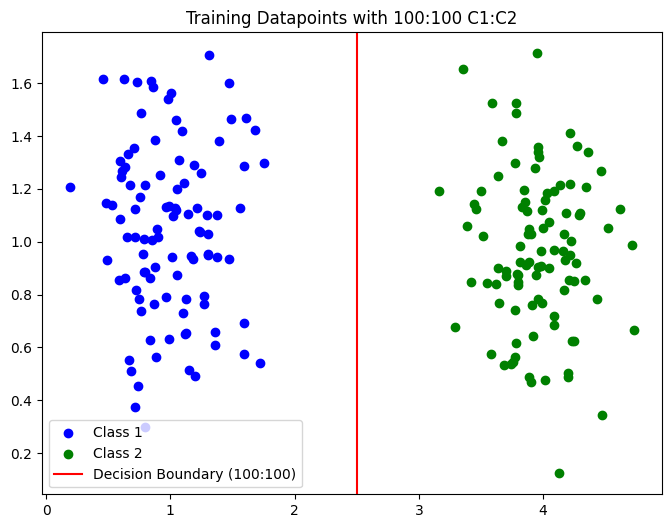

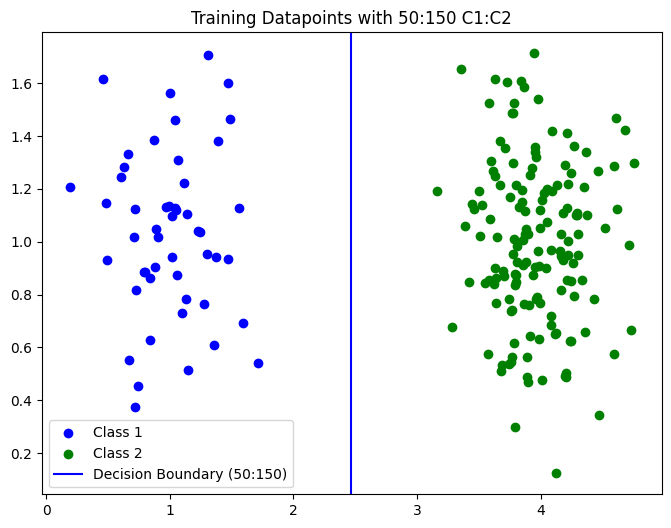

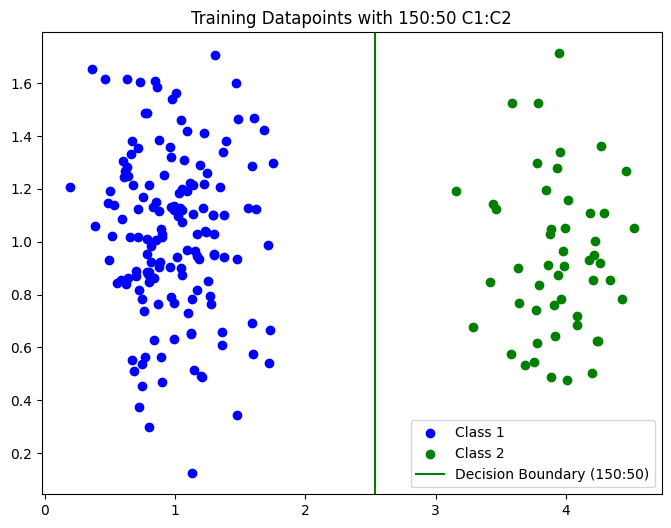

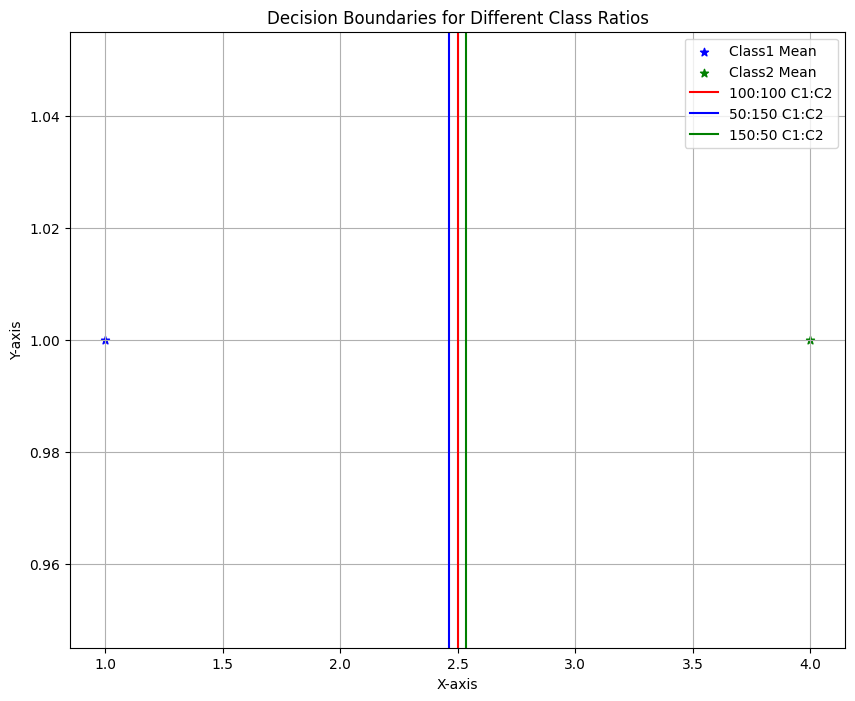

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# #########################################
# Part-4a)-0: Data Generation
# #########################################
def decisionBoundary(X_train, Y_train, cov1,cov2,mean_1,mean_2):
    '''
    #Inputs: Training data and Training labels
    #Outputs: Decision boundary parameters, i.e., [w0, w1, w2] 
    '''
    
    p_c1 = len(X_train[Y_train==1]) / len(Y_train)
    p_c2 = 1 - p_c1

    # w = Σ⁻¹(μ₁ - μ₂)
    w = np.linalg.inv(cov) @ (mean_1 - mean_2)
    
    # print(w)
    # b = -0.5(μ₁ᵀΣ⁻¹μ₁ - μ₂ᵀΣ⁻¹μ₂) + log(P(C₁)/P(C₂))
    w0 = -0.5 * (mean_1.T @ np.linalg.inv(cov1) @ mean_1 - mean_2.T @ np.linalg.inv(cov2) @ mean_2) + np.log(p_c1 / p_c2)

    return np.array([w0] + list(w))

def plot_decision_boundary(w, label, color, ax):
    """
    Plots the decision boundary for given weights.
    Inputs:
        - w: Weight vector [w0, w1, w2]
        - label: Label for the decision boundary
        - color: Color of the decision boundary
        - ax: Matplotlib axis to plot on
    """
    x = np.linspace(-1, 6, 1000)
    if np.abs(w[2]) < 1e-10:  # Check if w[2] is close to zero
        ax.axvline(-w[0] / w[1], color=color, label=label)
    else:
        y = (-w[0] / w[2] - w[1] / w[2] * x)
        ax.plot(x, y, label=label, color=color)

mean1 = np.array([1, 1])
mean2 = np.array([4, 1])
cov = np.array([[0.1, 0.0], [0.0, 0.1]])

# Case 1: 100 samples from each class
np.random.seed(0)
class1_tr = np.random.multivariate_normal(mean1, cov, 100)
class2_tr = np.random.multivariate_normal(mean2, cov, 100)
tr_data = np.vstack((class1_tr, class2_tr))
tr_targets = np.hstack((np.ones(100), -np.ones(100)))
w1 = decisionBoundary(tr_data, tr_targets, cov,cov, mean1, mean2)

# Plot decision boundary for Case 1
plt.figure(figsize=(8, 6))
ax1 = plt.gca()
ax1.scatter(class1_tr[:, 0], class1_tr[:, 1], color='blue', label="Class 1")
ax1.scatter(class2_tr[:, 0], class2_tr[:, 1], color='green', label="Class 2")
plot_decision_boundary(w1, "Decision Boundary (100:100)", "red", ax1)
ax1.set_title("Training Datapoints with 100:100 C1:C2")
ax1.legend()
plt.show()

# Case 2: 50 samples from class1 and 150 samples from class2
np.random.seed(0)
class1_tr = np.random.multivariate_normal(mean1, cov, 50)
class2_tr = np.random.multivariate_normal(mean2, cov, 150)
tr_data = np.vstack((class1_tr, class2_tr))
tr_targets = np.hstack((np.ones(50), -np.ones(150)))
w2 = decisionBoundary(tr_data, tr_targets, cov,cov, mean1, mean2)

# Plot decision boundary for Case 2
plt.figure(figsize=(8, 6))
ax2 = plt.gca()
ax2.scatter(class1_tr[:, 0], class1_tr[:, 1], color='blue', label="Class 1")
ax2.scatter(class2_tr[:, 0], class2_tr[:, 1], color='green', label="Class 2")
plot_decision_boundary(w2, "Decision Boundary (50:150)", "blue", ax2)
ax2.set_title("Training Datapoints with 50:150 C1:C2")
ax2.legend()
plt.show()

# Case 3: 150 samples from class1 and 50 samples from class2
np.random.seed(0)
class1_tr = np.random.multivariate_normal(mean1, cov, 150)
class2_tr = np.random.multivariate_normal(mean2, cov, 50)
tr_data = np.vstack((class1_tr, class2_tr))
tr_targets = np.hstack((np.ones(150), -np.ones(50)))
w3 = decisionBoundary(tr_data, tr_targets, cov,cov, mean1, mean2)

# Plot decision boundary for Case 3
plt.figure(figsize=(8, 6))
ax3 = plt.gca()
ax3.scatter(class1_tr[:, 0], class1_tr[:, 1], color='blue', label="Class 1")
ax3.scatter(class2_tr[:, 0], class2_tr[:, 1], color='green', label="Class 2")
plot_decision_boundary(w3, "Decision Boundary (150:50)", "green", ax3)
ax3.set_title("Training Datapoints with 150:50 C1:C2")
ax3.legend()
plt.show()

# Plot all decision boundaries on one plot
plt.figure(figsize=(10, 8))
x = np.linspace(-1, 6, 1000)

plt.scatter(mean1[0],mean1[1],marker="*",c="b",label="Class1 Mean")
plt.scatter(mean2[0],mean2[1],marker="*",c="g",label="Class2 Mean")
# Plot decision surface for w1
plot_decision_boundary(w1, "100:100 C1:C2", "red", plt.gca())

# Plot decision surface for w2
plot_decision_boundary(w2, "50:150 C1:C2", "blue", plt.gca())

# Plot decision surface for w3
plot_decision_boundary(w3, "150:50 C1:C2", "green", plt.gca())

# Add labels and legend
plt.title("Decision Boundaries for Different Class Ratios")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.grid()
plt.show()

$$
\underbrace{w_{200}x^2}_{\text{xx curvature}} +
\underbrace{(w_{201} + w_{210})xy}_{\text{rotation}} +
\underbrace{w_{211}y^2}_{\text{yy curvature}} +
\underbrace{w_{10}x + w_{11}y}_{\text{linear shift}} +
\underbrace{w_0}_{\text{offset}} = 0
$$

$$
\begin{aligned}
x^T W_2 x &=
\begin{bmatrix}
x & y
\end{bmatrix}
\begin{bmatrix}
w_{200} & w_{201} \\
w_{210} & w_{211}
\end{bmatrix}
\begin{bmatrix}
x \\
y
\end{bmatrix} \\
&= w_{200}x^2 + (w_{201} + w_{210})xy + w_{211}y^2
\end{aligned}
$$


C:\Users\abhin\AppData\Local\Temp\ipykernel_1504\3929460766.py:49: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(xx, yy, zz, levels=[0], colors=color, linestyles='dashed', label=title)


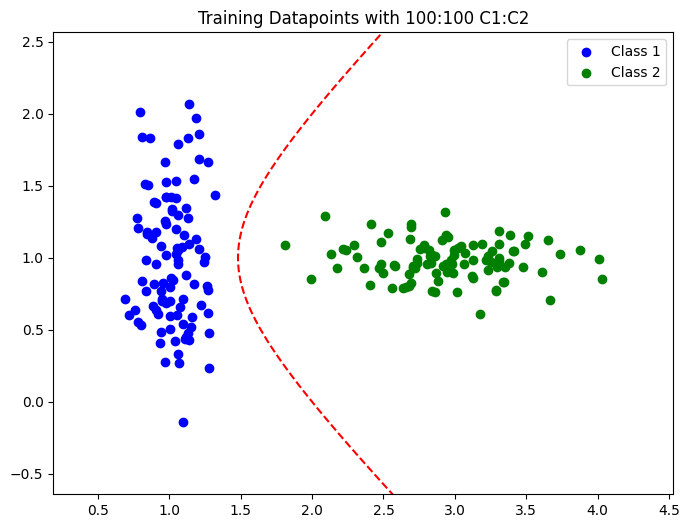

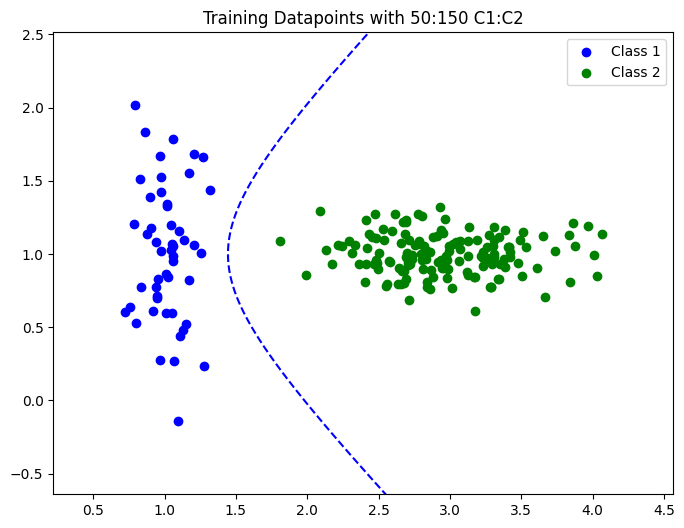

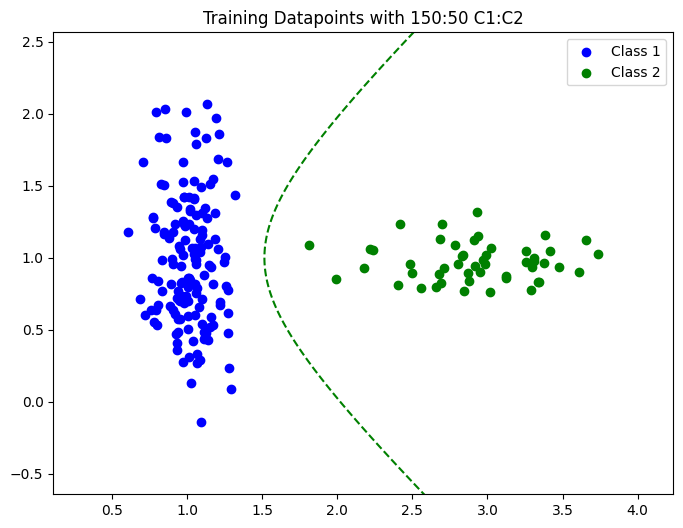

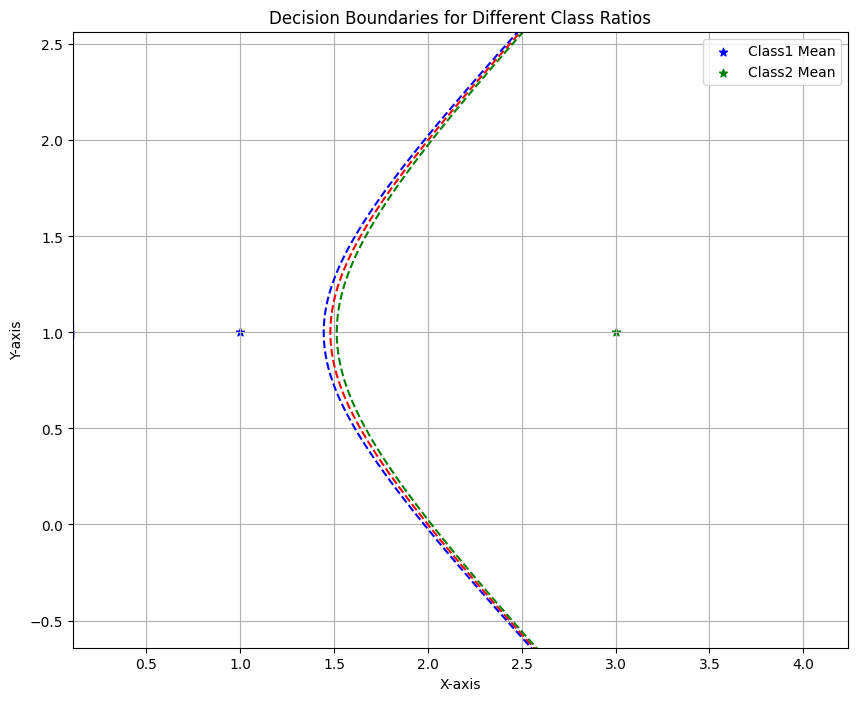

In [27]:
##########################################
#Part-4b)-0: Data Generation (Fixed)
##########################################
import numpy as np
import matplotlib.pyplot as plt

def decisionBoundary(X_train, Y_train, cov1, cov2, mean_1, mean_2):
    '''
    Computes the quadratic decision boundary parameters for QDA.
    Returns: [w0, w1, w2]
    '''
    p_c1 = len(X_train[Y_train == 1]) / len(Y_train)
    p_c2 = 1 - p_c1

    # Quadratic term: 0.5*(Σ2⁻¹ - Σ1⁻¹)
    w2 = 0.5 * (np.linalg.inv(cov2) - np.linalg.inv(cov1))

    # Linear term: Σ1⁻¹μ1 - Σ2⁻¹μ2
    w1 = (np.linalg.inv(cov1) @ mean_1) - (np.linalg.inv(cov2) @ mean_2)

    # Constant term including determinants
    term1 = mean_1.T @ np.linalg.inv(cov1) @ mean_1
    term2 = mean_2.T @ np.linalg.inv(cov2) @ mean_2
    log_det = 0.5 * (np.log(np.linalg.det(cov2)) - np.log(np.linalg.det(cov1)))
    w0 = -0.5*(term1 - term2) + log_det + np.log(p_c1 / p_c2)

    return [w0, w1, w2]

def plot_decision_boundary(ax, w, samples_c1, samples_c2, title, color):
    '''Plots decision boundary on given axes'''
    # Compute plot limits from samples
    x_min = min(samples_c1[:,0].min(), samples_c2[:,0].min())
    x_max = max(samples_c1[:,0].max(), samples_c2[:,0].max())
    y_min = min(samples_c1[:,1].min(), samples_c2[:,1].min())
    y_max = max(samples_c1[:,1].max(), samples_c2[:,1].max())
    
    # Create meshgrid
    xx, yy = np.meshgrid(np.linspace(x_min-1, x_max+1, 650), 
                         np.linspace(y_min-1, y_max+1, 650))
    
    # Compute quadratic decision boundary: x^T W2 x + W1^T x + W0 = 0
    w2 = w[2]
    w1 = w[1]
    w0 = w[0]
    zz = (w2[0,0] * xx**2 + (w2[0,1] + w2[1,0]) * xx * yy +  # Cross terms
          w2[1,1] * yy**2 + w1[0] * xx + w1[1] * yy + w0)
    
    # Plot boundary and format
    ax.contour(xx, yy, zz, levels=[0], colors=color, linestyles='dashed', label=title)
    ax.set_xlim(x_min-0.5, x_max+0.5)
    ax.set_ylim(y_min-0.5, y_max+0.5)
    ax.set_title(title)
    ax.legend()

mean1 = np.array([1, 1])
mean2 = np.array([3, 1])
cov1 = np.array([[0.02, 0.0], [0.0, 0.2]])
cov2 = np.array([[0.2, 0.0], [0.0, 0.02]])

# Case 1: 100 samples from each class
np.random.seed(0)
class1_tr = np.random.multivariate_normal(mean1, cov1, 100)
class2_tr = np.random.multivariate_normal(mean2, cov2, 100)
tr_data = np.vstack((class1_tr, class2_tr))
tr_targets = np.hstack((np.ones(100), -np.ones(100)))
w1 = decisionBoundary(tr_data, tr_targets, cov1,cov2, mean1, mean2)

# Plot decision boundary for Case 1
plt.figure(figsize=(8, 6))
ax1 = plt.gca()
ax1.scatter(class1_tr[:, 0], class1_tr[:, 1], color='blue', label="Class 1")
ax1.scatter(class2_tr[:, 0], class2_tr[:, 1], color='green', label="Class 2")
plot_decision_boundary(ax1, w1, class1_tr, class2_tr, "Decision Boundary (100:100)", "red")
ax1.set_title("Training Datapoints with 100:100 C1:C2")
ax1.legend()
plt.show()

# Case 2: 50 samples from class1 and 150 samples from class2
np.random.seed(0)
class1_tr = np.random.multivariate_normal(mean1, cov1, 50)
class2_tr = np.random.multivariate_normal(mean2, cov2, 150)
tr_data = np.vstack((class1_tr, class2_tr))
tr_targets = np.hstack((np.ones(50), -np.ones(150)))
w2 = decisionBoundary(tr_data, tr_targets, cov1,cov2, mean1, mean2)

# Plot decision boundary for Case 2
plt.figure(figsize=(8, 6))
ax2 = plt.gca()
ax2.scatter(class1_tr[:, 0], class1_tr[:, 1], color='blue', label="Class 1")
ax2.scatter(class2_tr[:, 0], class2_tr[:, 1], color='green', label="Class 2")
plot_decision_boundary(ax2, w2, class1_tr, class2_tr, "Decision Boundary (50:150)", "blue")
ax2.set_title("Training Datapoints with 50:150 C1:C2")
ax2.legend()
plt.show()

# Case 3: 150 samples from class1 and 50 samples from class2
np.random.seed(0)
class1_tr = np.random.multivariate_normal(mean1, cov1, 150)
class2_tr = np.random.multivariate_normal(mean2, cov2, 50)
tr_data = np.vstack((class1_tr, class2_tr))
tr_targets = np.hstack((np.ones(150), -np.ones(50)))
w3 = decisionBoundary(tr_data, tr_targets, cov1,cov2, mean1, mean2)

# Plot decision boundary for Case 3
plt.figure(figsize=(8, 6))
ax3 = plt.gca()
ax3.scatter(class1_tr[:, 0], class1_tr[:, 1], color='blue', label="Class 1")
ax3.scatter(class2_tr[:, 0], class2_tr[:, 1], color='green', label="Class 2")
plot_decision_boundary(ax3, w3, class1_tr, class2_tr, "Decision Boundary (150:50)", "green")
ax3.set_title("Training Datapoints with 150:50 C1:C2")
ax3.legend()
plt.show()

# Plot all decision boundaries on one plot
plt.figure(figsize=(10, 8))
x = np.linspace(-1, 6, 1000)

plt.scatter(mean1[0],mean1[1],marker="*",c="b",label="Class1 Mean")
plt.scatter(mean2[0],mean2[1],marker="*",c="g",label="Class2 Mean")
# Plot decision surface for w1
plot_decision_boundary(plt.gca(), w1, class1_tr, class2_tr, "100:100 C1:C2", "red")

# Plot decision surface for w2
plot_decision_boundary(plt.gca(), w2, class1_tr, class2_tr, "50:150 C1:C2", "blue")

# Plot decision surface for w3
plot_decision_boundary(plt.gca(), w3, class1_tr, class2_tr, "150:50 C1:C2", "green")

# Add labels and legend
plt.title("Decision Boundaries for Different Class Ratios")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.grid()
plt.show()

<b> Report your observations </b>

1. When the spread of data in different classes is the same, any curved or quadratic shapes in the decision boundary disappear. So, the decision boundary becomes a straight line based only on the input features.

2. If the data in different classes have similar covariance matrix, the line that separates them is straight.

3. However, if the spread of data in different classes is different, the dividing line becomes more complex and becomes quadratic(non linear in nature).

4. With shared covariance, the decision boundary is a linear function of the input variables, denoted as w^Tx + w_0, where w is the weight vector and w_0 is the bias term

5. Without shared covariance, the decision boundary can be represented as a quadratic function of the input variables, denoted as x which satisfies the equation x^Tw_2x + w_1^Tx + w_0=0, where w_2 is the weight matrix, w_1 is the weight vector and w_0 is the bias term

6. As the ratio of C1:C2 increases the decision surface moves such that It includes more area for C1 class than C2


## Part-5) Classification using logistic regression


<b> Part-5) Classification using logistic regression ( Iterative reweighted least squares approach ): </b> logistic regression model: $y = \frac{1}{1+e^{-\textbf{w}^{T}\textbf{x}}}$. With the provided training data, X_train and Y_train, your task is to identify the optimal $\textbf{w}$ that accurately predicts y based on the input $\textbf{x}$. Subsequently, this $\textbf{w}$ can be applied to predict outcomes on the test data, X_test.

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Create a function called "Logistic_Regression" that accepts training data, training labels, and testing data as inputs. The function should aim to discover the optimal $\textbf{w}$ using the training data. You can initialize $\textbf{w}$ with random values and iteratively update it to determine the optimal $\textbf{w}$. Subsequently, this optimal $\textbf{w}$ can be employed to make predictions on the test data.

c). Evaluate the classification performance, i.e., compute the accuracy on the test data.

d). Write a function to generate & visualize the decision regions, either by showing the boundary line or by using different colors for the two regions. Overlay the test points using scatter.

e). Introduce genuine outliers to one of the class datasets generated previously. Then, conduct Least Squares classification and Logistic Regression on this modified dataset. Plot the decision boundaries/regions and provide insights into the differences between their outcomes.

f). Report your observations




 Accuracy with Logistic Regression: 94.5 




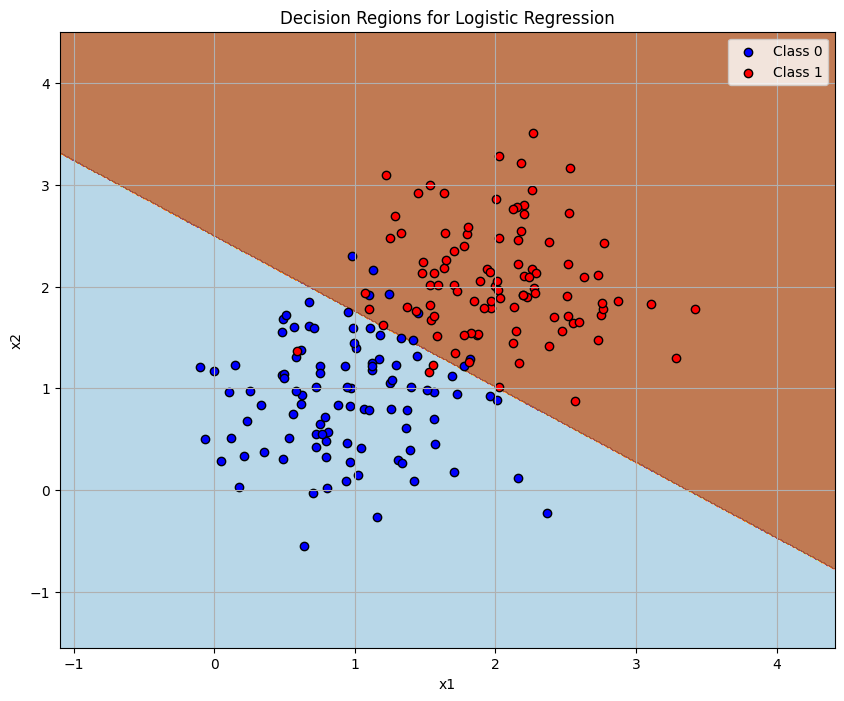



 Accuracy with Logistic Regression testing data with outlier: 94.5 




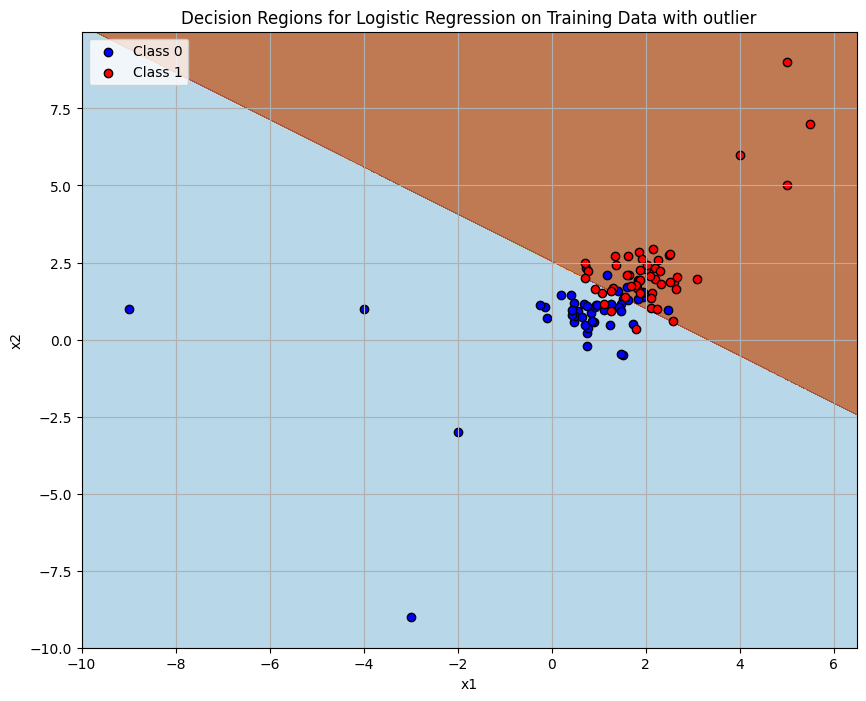

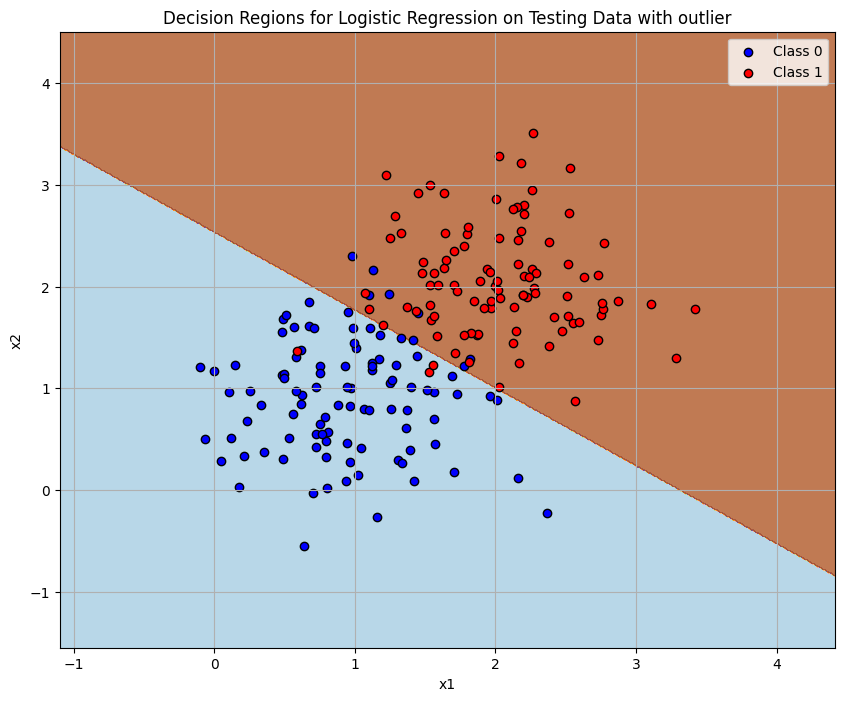

In [ ]:
##################################################
#Part-5)-1: Data generation
##################################################
import numpy as np
import matplotlib.pyplot as plt

#Set the parameters of class distribution
mean1 = np.array([1,1])              #Mean of class1
mean2 =  np.array([2,2])             #Mean of class2
cov = np.array([[0.3,0],[0,0.3]])    #Covariance matrix. Same covariance for class1 and class2

# Generate training data
class1_tr = np.random.multivariate_normal(mean1, cov, 50)  # Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)  # Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))  # Combine class1 and class2 training data
tr_targets = np.hstack((np.zeros(50), np.ones(50)))  # Class labels: 0 for class1, 1 for class2

# Generate testing data
class1_te = np.random.multivariate_normal(mean1, cov, 100)  # Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 100)  # Class2 testing data
te_data = np.vstack((class1_te, class2_te))  # Combine class1 and class2 testing data
te_targets = np.hstack((np.zeros(100), np.ones(100)))  # Class labels: 0 for class1, 1 for class2


##################################################
#Part-5)-b: Complete the below logistic regression function
##################################################
def Logistic_Regression(X_train, Y_train, X_test):
  # Inputs: Training data, Training labels, and Testing data
  # Outputs: Predictions on test data

  n1, n2 = len(X_train), len(X_test)
  Y_train = Y_train.reshape(n1, -1)
  max_iter = 1000  # max number of iterations for parameter update
  threshold = 0.5  # threshold for classification
  alpha = 0.01
  X_tr = np.hstack((np.ones((n1, 1)), X_train)) 
  X_te = np.hstack((np.ones((n2, 1)), X_test))
  W = np.random.rand(X_tr.shape[1],1)  
  for iter in range(max_iter):
    preds = 1 / (1 + np.exp(-X_tr @ W)) 
    error = Y_train - preds  
    dW = -X_tr.T @ (error * preds * (1 - preds))
    W = W - alpha * dW

  Y_te_pred = 1 / (1 + np.exp(-X_te @ W))
  test_preds = (Y_te_pred >= threshold).astype(int)  # Apply threshold to make predictions
  return test_preds, W


Y_pred,W = Logistic_Regression(tr_data, tr_targets, te_data)

###############################################
#Part-5)-c:
###############################################
def LR_Accuracy(Y_test, Y_pred):
  #Inputs: Ground truth and predicted labels of test data
  #Outputs: Accuracy
  c = Y_test == Y_pred
  acc = (np.sum(c) / len(c)) * 100
  return acc

acc = LR_Accuracy(te_targets, Y_pred.flatten())  # Ensure Y_pred is flattened for comparison
print('\n\n Accuracy with Logistic Regression:', acc, '\n\n')


##########################################
# Part-5)-d: Plot the decision regions. Overlay the test points on the plot
##########################################
def plot_decision_regions(X, Y, W, title):
  """
  Plots decision regions for logistic regression.
  Inputs:
    - X: Test data
    - Y: Test labels
    - W: Weight vector
    - title: Title of the plot
  """
  x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
  y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
  xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
             np.arange(y_min, y_max, 0.01))
  
  # print(xx.shape,yy.shape)
  grid = np.c_[xx.ravel(), yy.ravel()]
  # print(grid.shape)
  grid_with_bias = np.hstack((np.ones((grid.shape[0], 1)), grid))
  Z = 1 / (1 + np.exp(-grid_with_bias @ W))
  Z = (Z >= 0.5).astype(int)
  Z = Z.reshape(xx.shape)
  
  plt.figure(figsize=(10, 8))
  plt.contourf(xx, yy, Z, alpha=0.8, cmap=plt.cm.Paired)
  
  plt.scatter(X[Y == 0][:, 0], X[Y == 0][:, 1], c='blue', label='Class 0', edgecolor='k')
  plt.scatter(X[Y == 1][:, 0], X[Y == 1][:, 1], c='red', label='Class 1', edgecolor='k')
  
  # Add labels, title, and legend
  plt.title(title)
  plt.xlabel('x1')
  plt.ylabel('x2')
  plt.legend()
  plt.grid()
  plt.show()

plot_decision_regions(te_data, te_targets, W, "Decision Regions for Logistic Regression")


##########################################
#Part-5)-e: Logistic regression for the data with true outliers
##########################################
tr_data2 = tr_data.copy()
tr_data2[:4] = [[-2,-3],[-4,1],[-3,-9],[-9,1]] # adding true outlier of class1
tr_data2[-4:] = [[4,6],[5,5],[5,9],[5.5,7]] # adding true outlier of class2
Y_pred,W = Logistic_Regression(tr_data2, tr_targets, te_data)

acc = LR_Accuracy(te_targets, Y_pred.flatten())  # Ensure Y_pred is flattened for comparison
print('\n\n Accuracy with Logistic Regression testing data with outlier:', acc, '\n\n')

plot_decision_regions(tr_data2, tr_targets, W, "Decision Regions for Logistic Regression on Training Data with outlier")

plot_decision_regions(te_data, te_targets, W, "Decision Regions for Logistic Regression on Testing Data with outlier")

**Observations:**

1. The logistic model approximates the underlying distribution of data and uses the sigmoidal kernel to find the predictions.

2. The Logistic model is providing an accuracy of around 90% for the given set of data.

3. The logistic model is better at handling the true outliers and doesn't get affected by the very true outliers.

4. The logistic model is a mix of perceptron and LS models and provides a higher accuracy and also handles the outliers.


## Part (6): Estimating the parameters of Gaussian Mixture Models (GMM) using Expectation-Maximization (EM) algorithm


##### **a. Generating synthetic data**

1. **Consider GMM with Bivariate Gaussians**

   - Parameters:
     $$
     \pi = \begin{bmatrix} 0.6 \\ 0.4 \end{bmatrix},\;
     \mu_1 = \begin{bmatrix} -1.0 \\ -1.0 \end{bmatrix},\;
     \mu_2 = \begin{bmatrix} 1.0 \\ 1.0 \end{bmatrix}
     $$
     Covariance matrices:
     $$
     \Sigma_1^{\text{full}} = \begin{bmatrix} 0.15 & 0.1 \\ 0.1 & 0.25 \end{bmatrix},\;
     \Sigma_2^{\text{full}} = \begin{bmatrix} 0.3 & -0.25 \\ -0.25 & 0.25 \end{bmatrix}
     $$
     $$
     \Sigma_1^{\text{diagonal}} = \begin{bmatrix} 0.1 & 0.0 \\ 0.0 & 0.2 \end{bmatrix},\;
     \Sigma_2^{\text{diagonal}} = \begin{bmatrix} 0.2 & 0.0 \\ 0.0 & 0.1 \end{bmatrix}
     $$
     $$
     \Sigma_1^{\text{spherical}} = \begin{bmatrix} 0.2 & 0.0 \\ 0.0 & 0.2 \end{bmatrix},\;
     \Sigma_2^{\text{spherical}} = \begin{bmatrix} 0.1 & 0.0 \\ 0.0 & 0.1 \end{bmatrix}
     $$
   - Sample data points using selection probability π
   - Repeat N times to get entire dataset

2. **Create synthetic dataset** with 2 mixtures
3. **Plot dataset** with unique colors to the data points drawn from each Bivariate Gaussian distribution in GMM

##### **b. EM Algorithm Implementation**

1. **Initialization**

   - Choose M mixtures
   - Initialize parameters ensuring:
     - Positive diagonal covariance elements
     - Valid probability weights (sum to 1)

2. **Expectation Step**
   Calculate responsibilities:

   $$
   \gamma_{nk} = \frac{\pi_k \mathcal{N}(\mathbf{x}_n | \mu_k, \Sigma_k)}{\sum_{m=1}^M \pi_m \mathcal{N}(\mathbf{x}_n | \mu_m, \Sigma_m)}
   $$

3. **Maximization Step**
   Update parameters:

   $$
   N_k = \sum_{n=1}^N \gamma_{nk},\quad
   \mu_k = \frac{1}{N_k} \sum_{n=1}^N \gamma_{nk}\mathbf{x}_n
   $$

   - **Where**:

   - $N$ = total number of data points
   - $M$ = total number of Gaussians in GMM

- **Notation**:

  - $\gamma_{nk}$ represents the responsibility of the $k^{\text{th}}$ Gaussian in generating the $n^{\text{th}}$ data point
  - $\sum_{n=1}^{N} \gamma_{nk}$ represents the effective number of data points generated by the $k^{\text{th}}$ Gaussian

  $$
  \Sigma_k = \frac{1}{N_k} \sum_{n=1}^N \gamma_{nk}(\mathbf{x}_n - \mu_k)(\mathbf{x}_n - \mu_k)^T
  $$

  $$
  \pi_k = \frac{N_k}{N}
  $$

4. **Log-Likelihood** computation
5. **Repeat** until convergence

##### **c. EM Iteration Visualization**

5. **Plotting requirements**:
   - Plot contours of estimated distributions at each EM iteration
   - Overlay original data points on the same plot
   - Use distinct colors for different Gaussian components

---

##### **d. Understanding the issues with EM algorithm**

6. **Initialization Impact Analysis**:

   - Investigate how different initializations affect:
     - Convergence speed
     - Final parameter estimates
     - Quality of fit
   - Visualization: Use iteration plots from section **c** to demonstrate effects

7. **Covariance Type Analysis**:
   - Compare performance with different covariance structures:
     - Spherical ($\Sigma = \sigma^2I$)
     - Diagonal ($\Sigma = \text{diag}(\sigma_1^2, \sigma_2^2)$)
     - Full covariance (no constraints)
   - Implementation steps:
     1. Execute EM algorithm with each covariance type
     2. Compare:
        - Convergence rates
        - Likelihood progression
        - Final cluster shapes
   - Visualization: Use contour plots from section **c** for comparison


In [ ]:
#All imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.stats import norm, multivariate_normal
from random import choices
import sys
import math

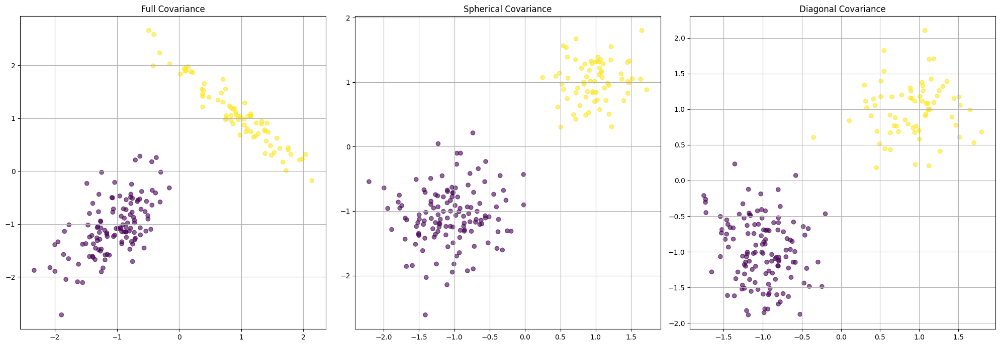

In [ ]:
def generateData(pi, mu, sigma, N):
    """Generate synthetic GMM data with different covariance types
    
    Args:
        pi: Mixture weights [K,]
        mu: List of mean vectors [K x D]
        sigma: List of covariance matrices [K x D x D]
        N: Number of data points
        
    Returns:
        data: Generated points [N x D]
        labels: Component indices [N,]
    """
    K = len(pi)  
    D = len(mu[0])  
    
    component_indices = choices(range(K), weights=pi, k=N)
    # print(component_indices)
    
    data = []
    labels = []
    for idx in component_indices:
        point = np.random.multivariate_normal(mu[idx], sigma[idx])
        data.append(point)
        labels.append(idx)
        
    return np.array(data), np.array(labels)

mu1 = np.array([-1.0, -1.0])
mu2 = np.array([1.0, 1.0])
pi = [0.6, 0.4]

sig1_full = np.array([[0.15, 0.1], [0.1, 0.25]])
sig2_full = np.array([[0.3, -0.25], [-0.25, 0.25]])

sig1_diag = np.array([[0.1, 0.0], [0.0, 0.2]])
sig2_diag = np.array([[0.2, 0.0], [0.0, 0.1]])

sig1_sph = np.array([[0.2, 0.0], [0.0, 0.2]])
sig2_sph = np.array([[0.1, 0.0], [0.0, 0.1]])

data_full, labels_full = generateData(pi, [mu1, mu2], [sig1_full, sig2_full], 200)
data_sp, labels_sp = generateData(pi, [mu1, mu2], [sig1_sph, sig2_sph], 200)
data_dg, labels_dg = generateData(pi, [mu1, mu2], [sig1_diag, sig2_diag], 200)

fig, ax = plt.subplots(1, 3, figsize=(20, 7))

# Full covariance plot
ax[0].scatter(data_full[:, 0], data_full[:, 1], c=labels_full, cmap='viridis', alpha=0.6)
ax[0].set_title('Full Covariance')
ax[0].grid(True)
# Spherical covariance plot
ax[1].scatter(data_sp[:, 0], data_sp[:, 1], c=labels_sp, cmap='viridis', alpha=0.6)
ax[1].set_title('Spherical Covariance')
ax[1].grid(True)
# Diagonal covariance plot
ax[2].scatter(data_dg[:, 0], data_dg[:, 1], c=labels_dg, cmap='viridis', alpha=0.6)
ax[2].set_title('Diagonal Covariance')
ax[2].grid(True)
plt.tight_layout()
plt.show()

In [39]:
import numpy as np 
import matplotlib.pyplot as plt 
import pandas as pd

Running EM algorithm with full covariance matrices:
Iteration 1/20


C:\Users\abhin\AppData\Local\Temp\ipykernel_1504\2088835742.py:146: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(mu[k, 0], mu[k, 1], c=f'C{k}', marker='x', s=200,
C:\Users\abhin\AppData\Local\Temp\ipykernel_1504\2088835742.py:166: UserWarning: The following kwargs were not used by contour: 'label'
  plt.contour(xx, yy, Z, levels=5, colors=colors[k % len(colors)],


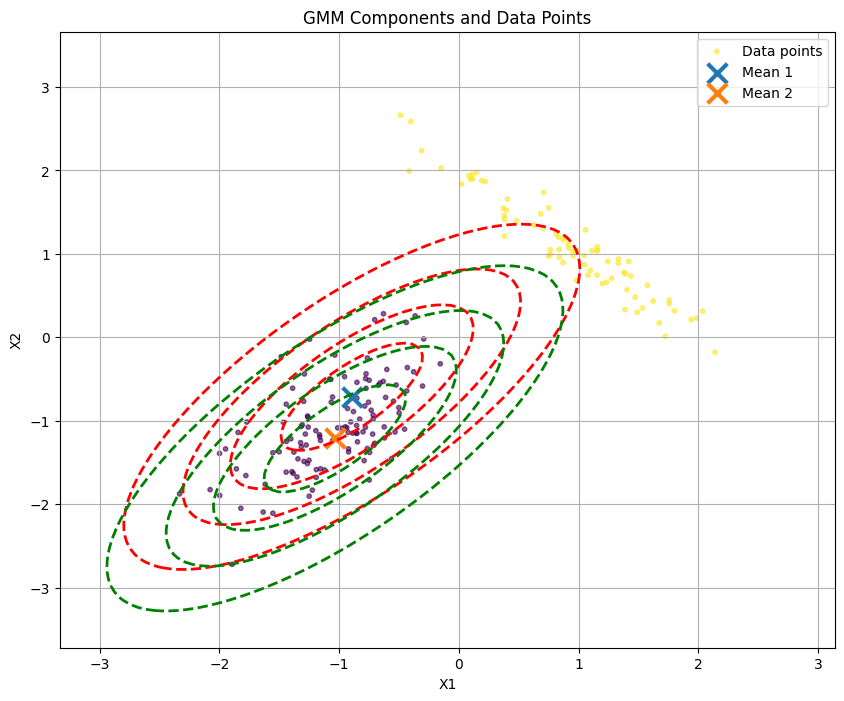

Log-likelihood: -579.4666
Iteration 2/20


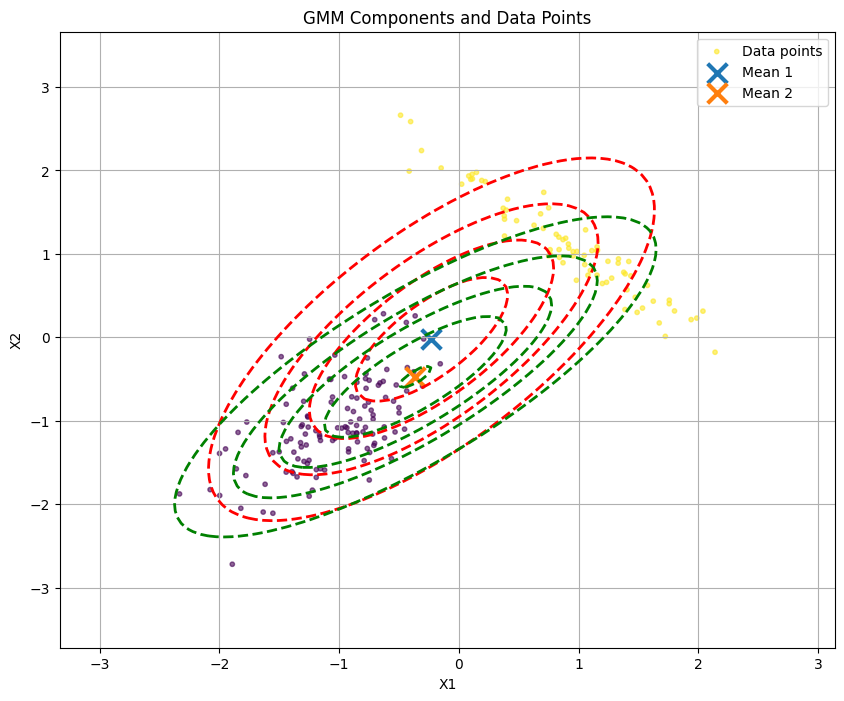

Log-likelihood: -527.2080
Iteration 3/20


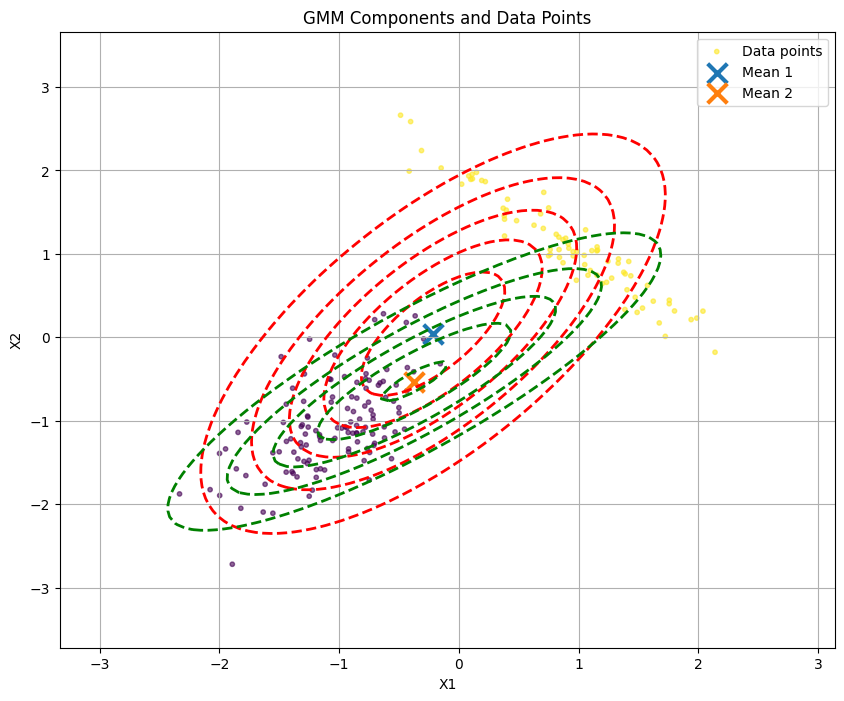

Log-likelihood: -517.7540
Iteration 4/20


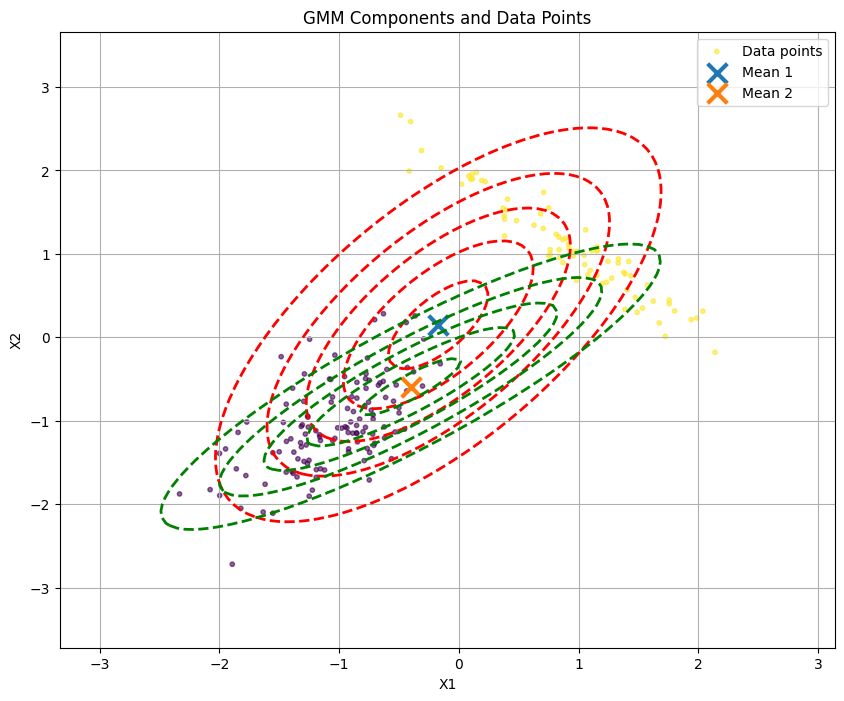

Log-likelihood: -511.8016
Iteration 5/20


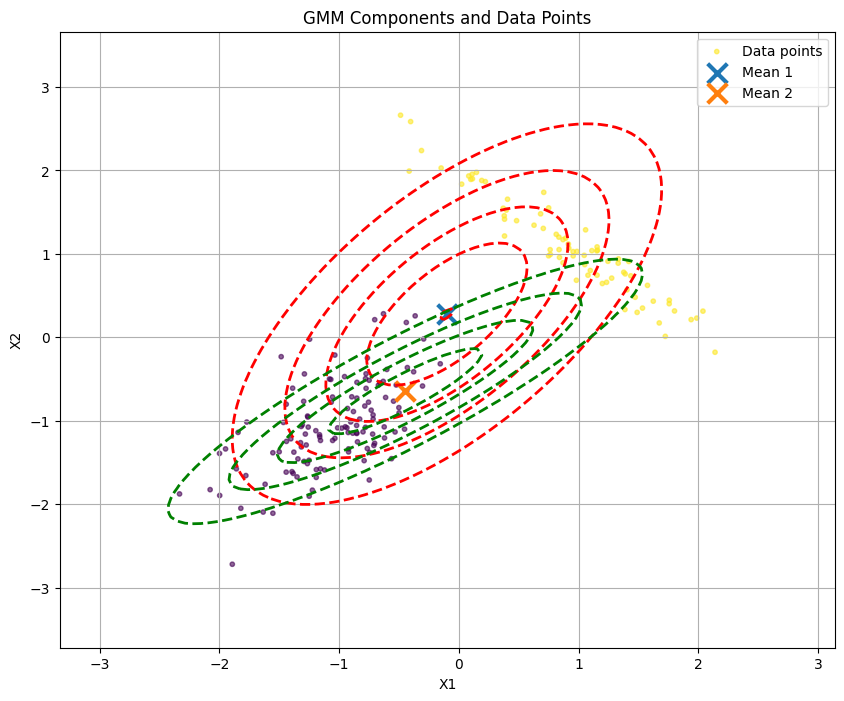

Log-likelihood: -508.1939
Iteration 6/20


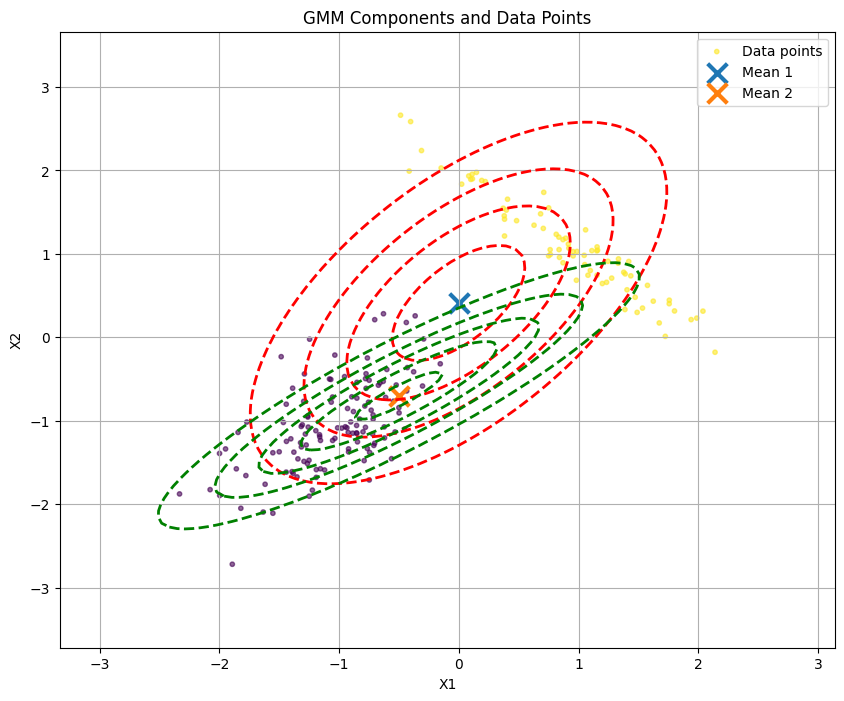

Log-likelihood: -505.1001
Iteration 7/20


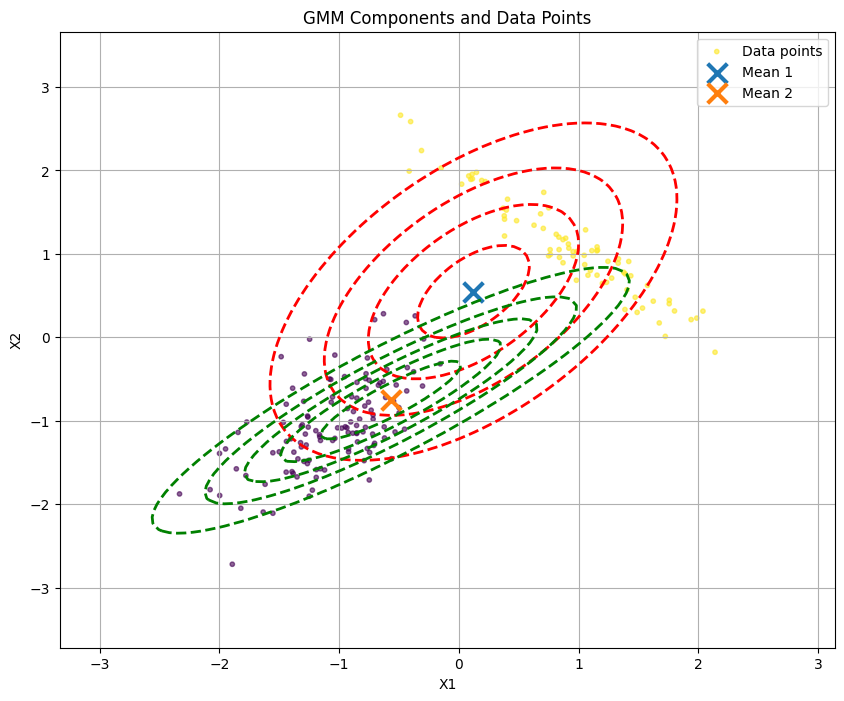

Log-likelihood: -500.8271
Iteration 8/20


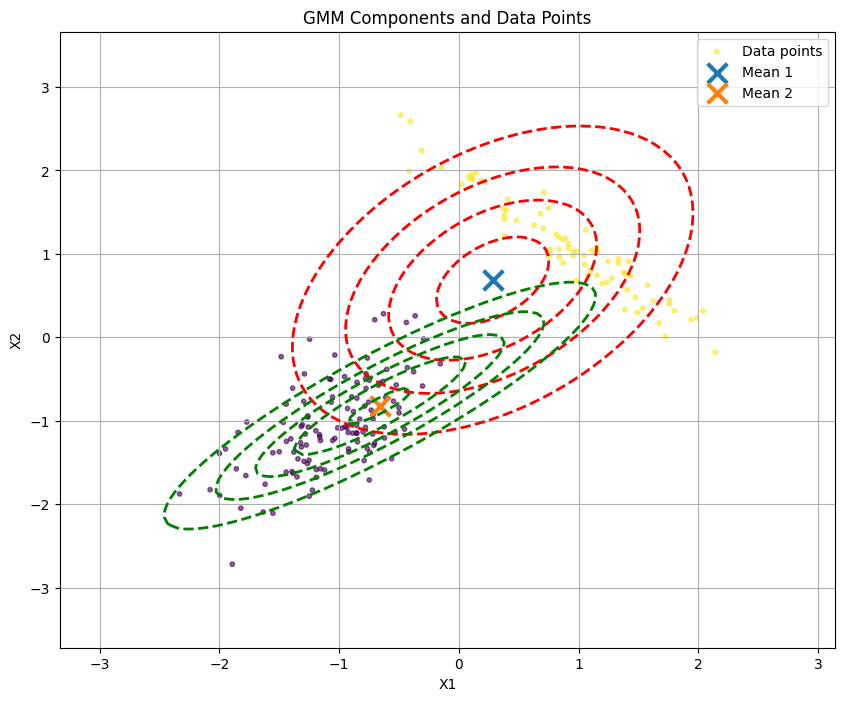

Log-likelihood: -492.7852
Iteration 9/20


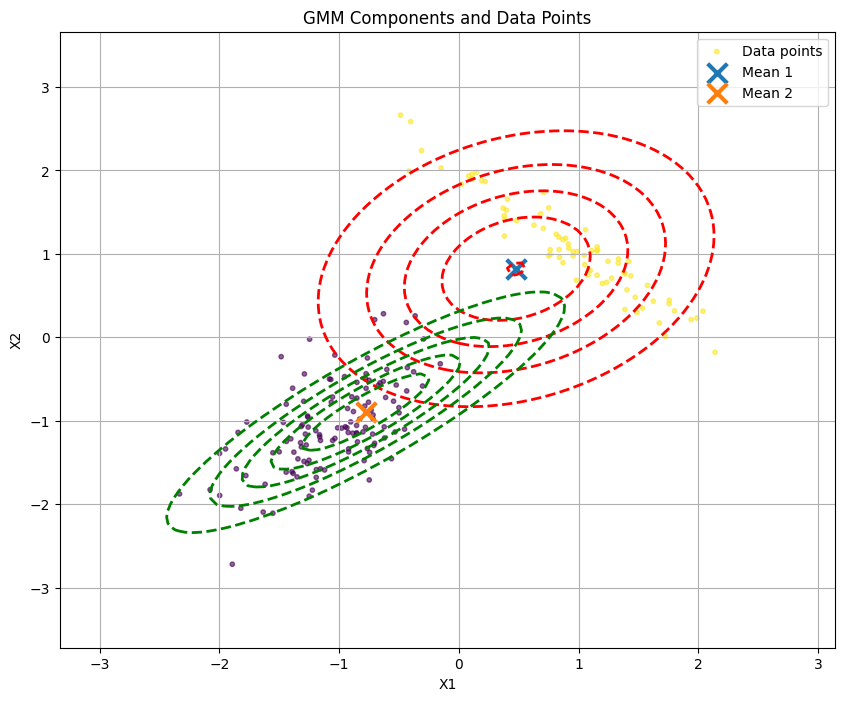

Log-likelihood: -476.3460
Iteration 10/20


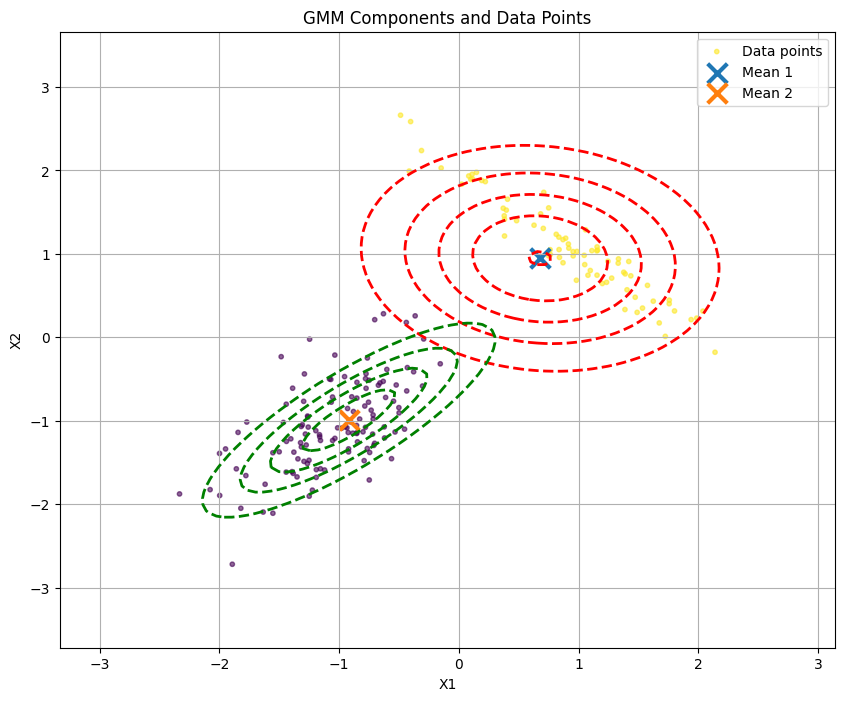

Log-likelihood: -442.0965
Iteration 11/20


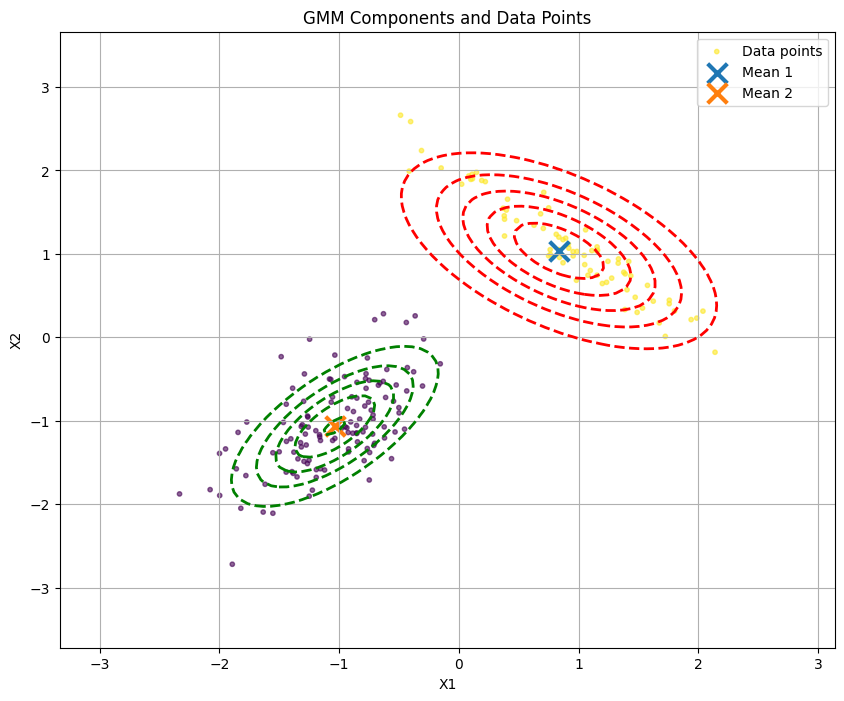

Log-likelihood: -382.7513
Iteration 12/20


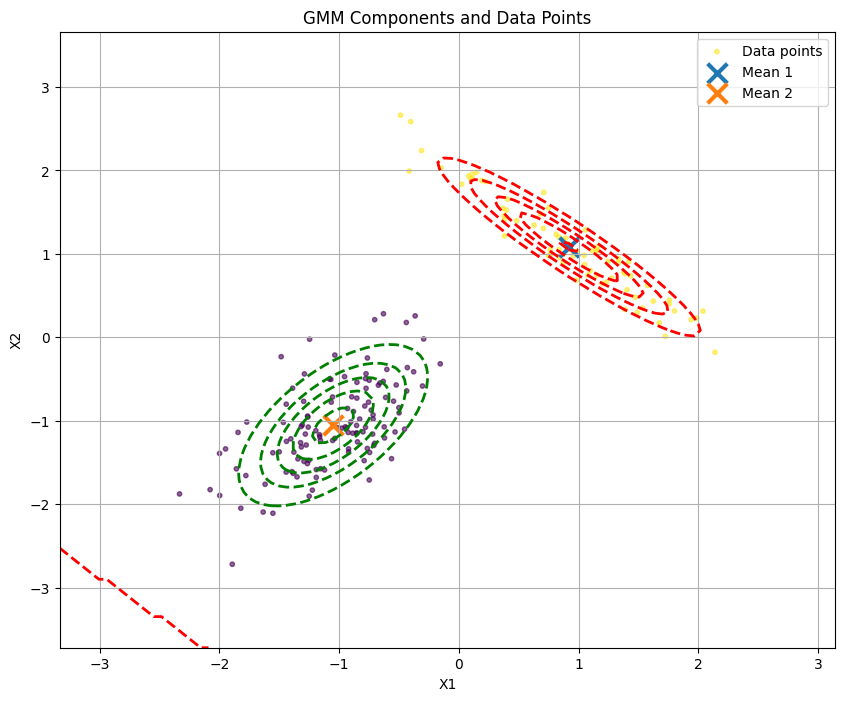

Log-likelihood: -319.1384
Iteration 13/20


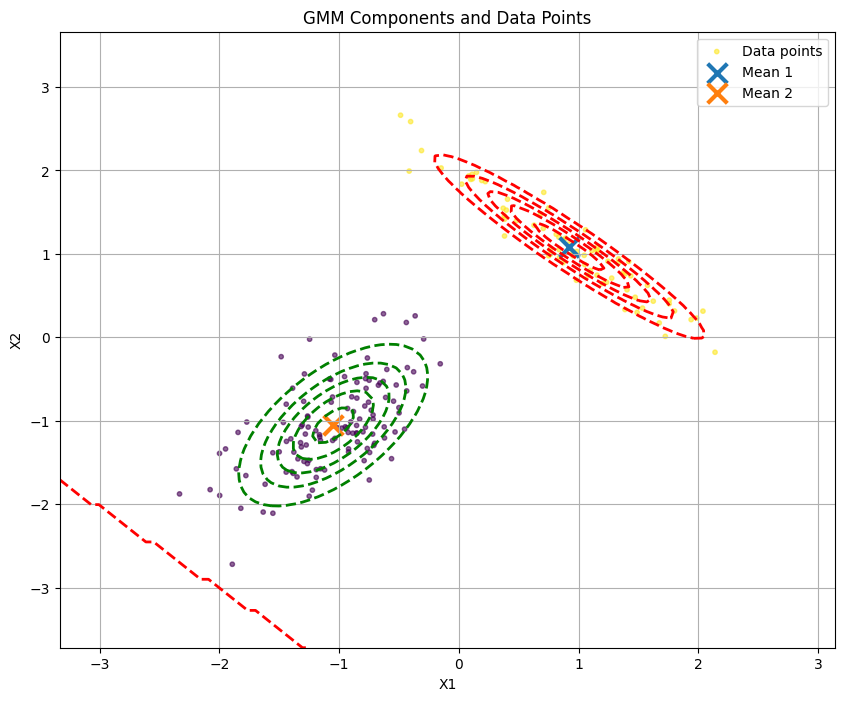

Log-likelihood: -318.1991
Iteration 14/20


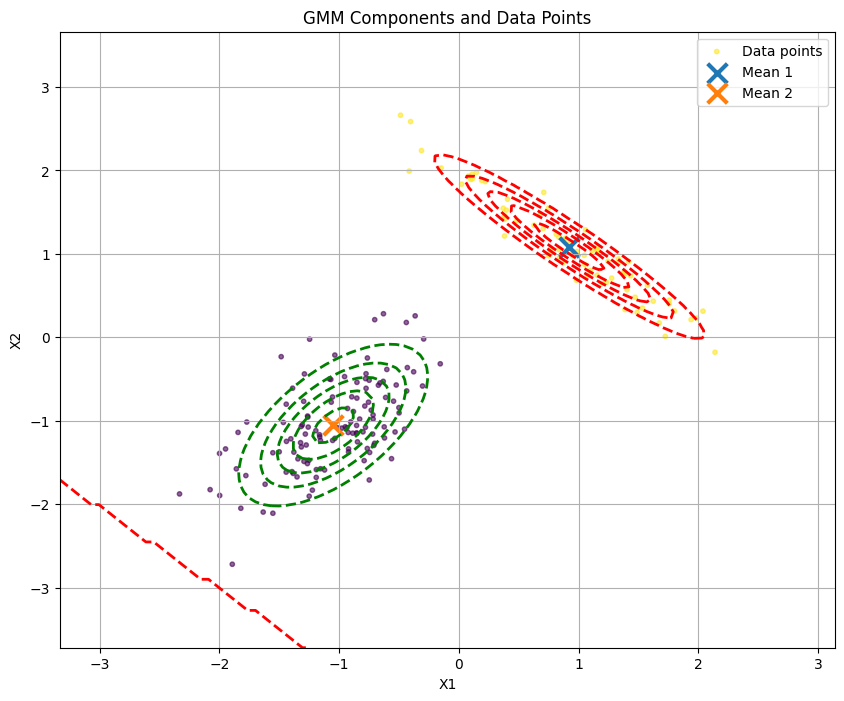

Log-likelihood: -318.1991
Converged!


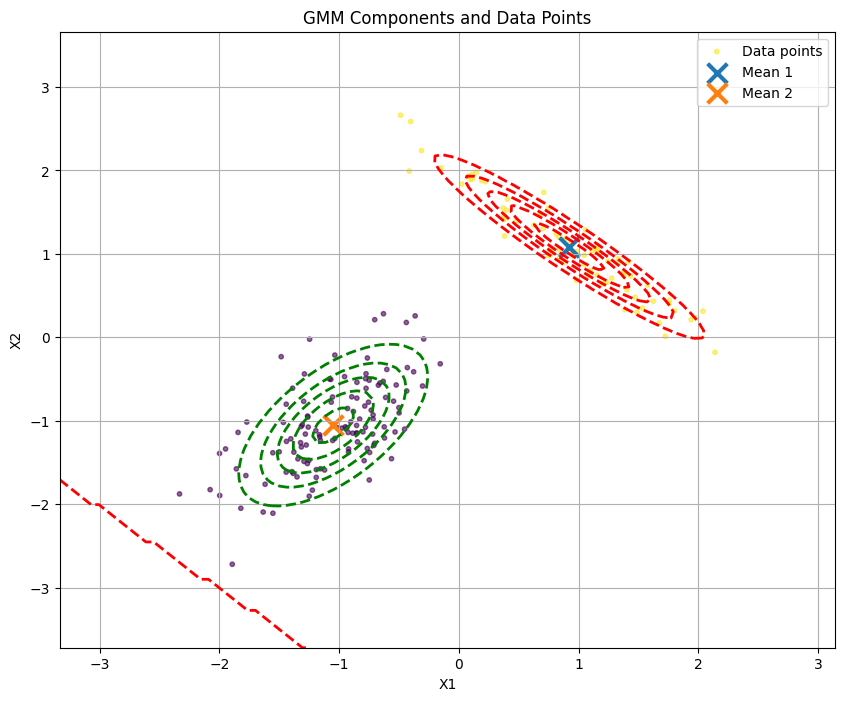

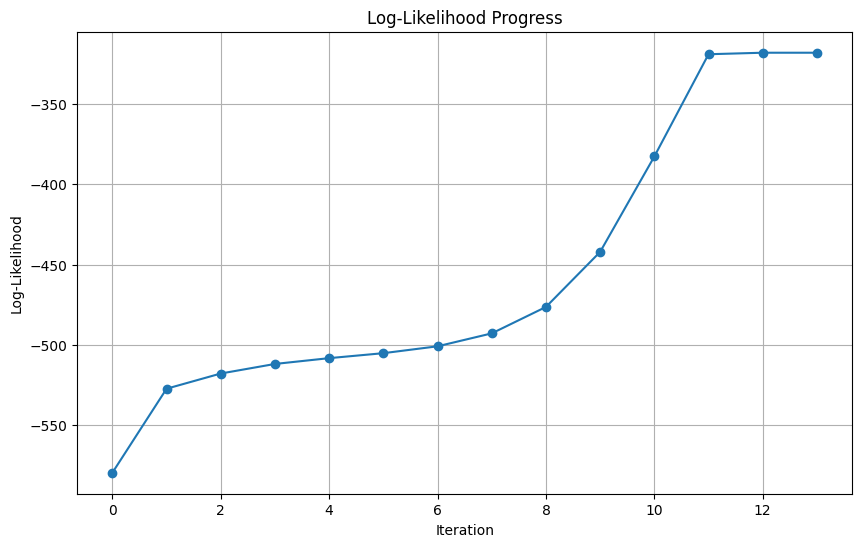


Running EM algorithm with diagonal covariance matrices:
Iteration 1/20


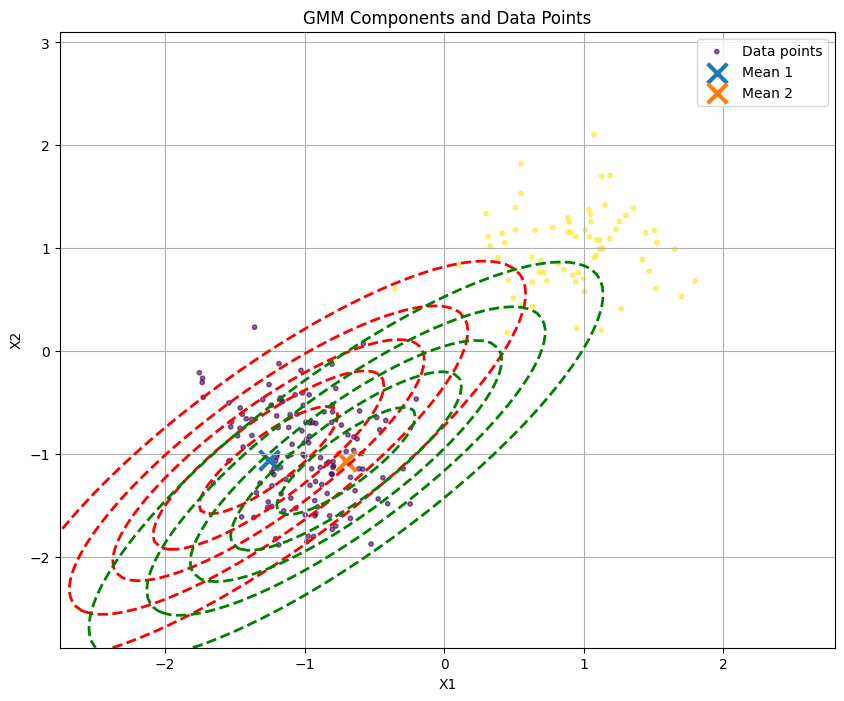

Log-likelihood: -508.9241
Iteration 2/20


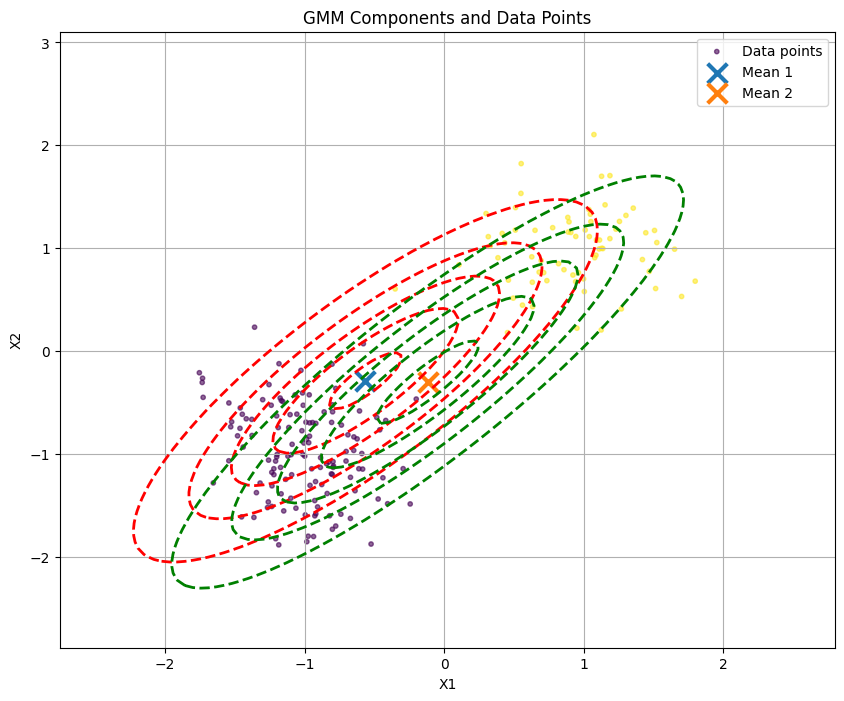

Log-likelihood: -449.1040
Iteration 3/20


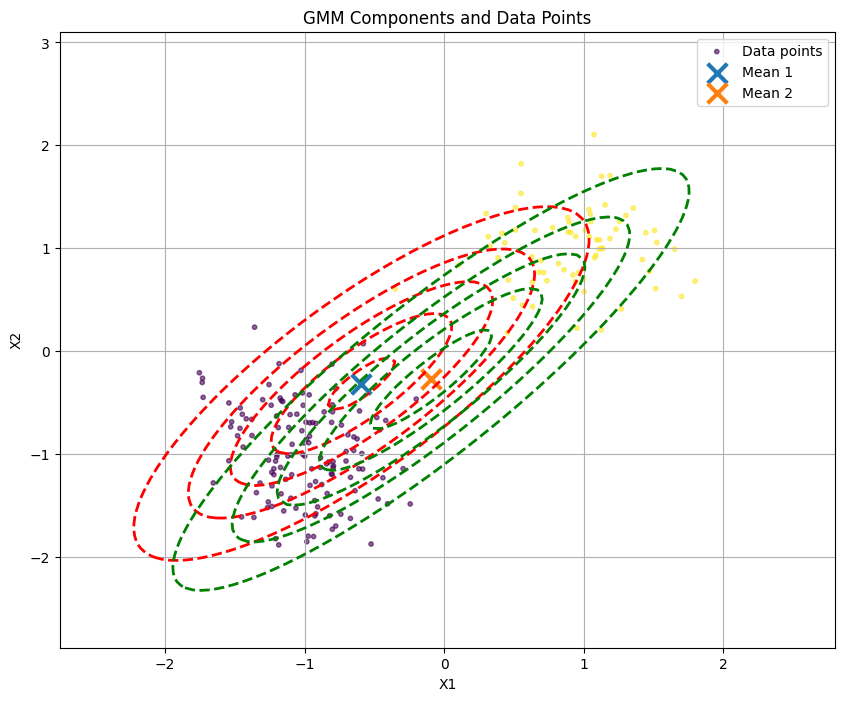

Log-likelihood: -448.4639
Iteration 4/20


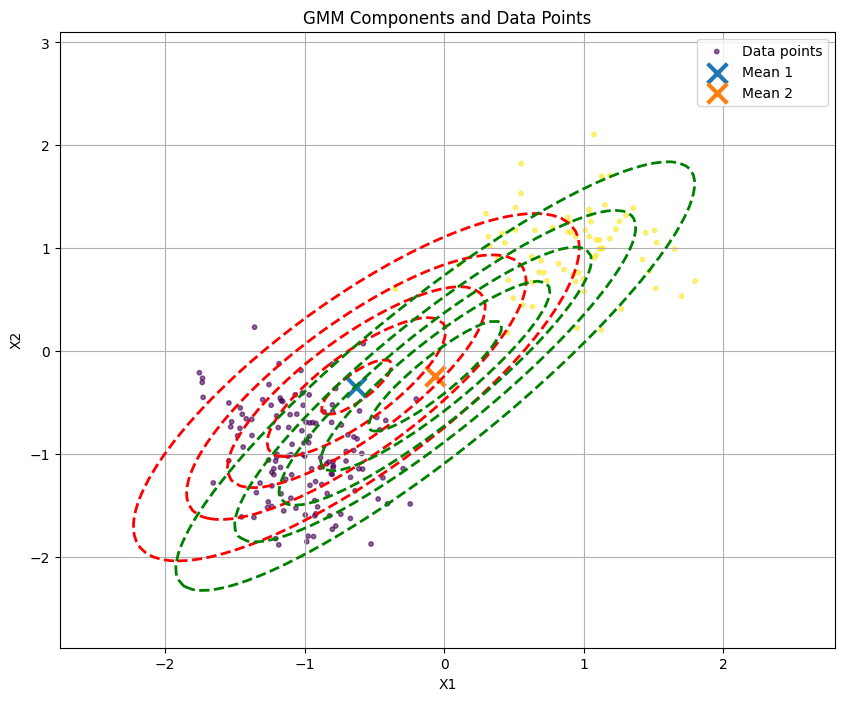

Log-likelihood: -447.8713
Iteration 5/20


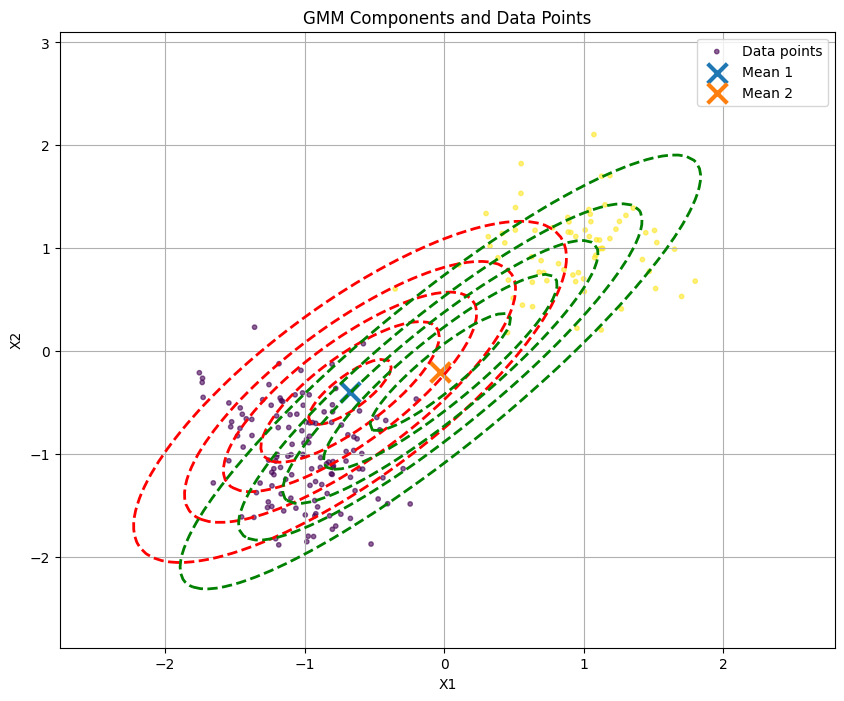

Log-likelihood: -447.0191
Iteration 6/20


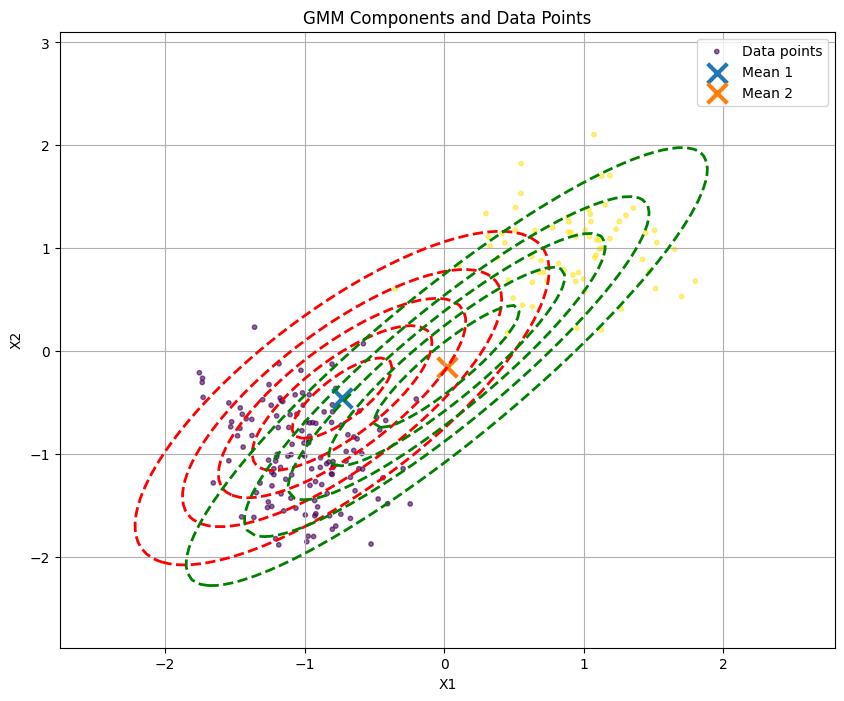

Log-likelihood: -445.4038
Iteration 7/20


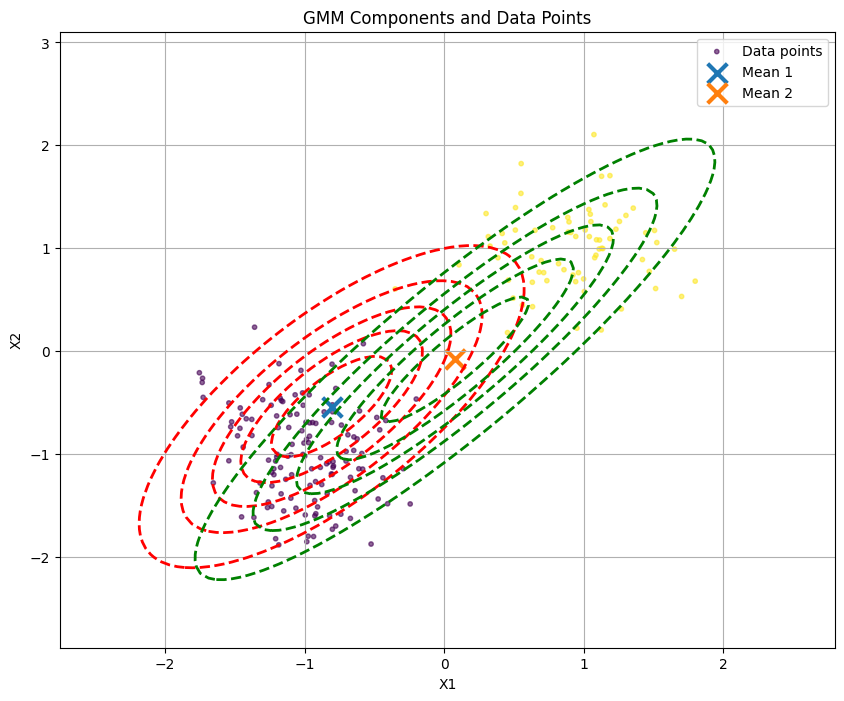

Log-likelihood: -441.6817
Iteration 8/20


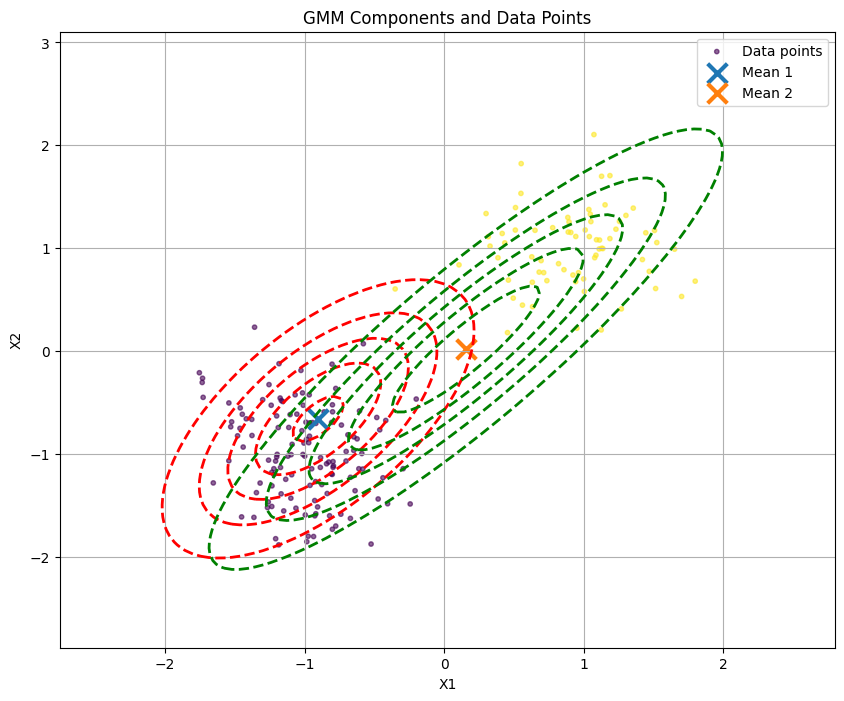

Log-likelihood: -431.2432
Iteration 9/20


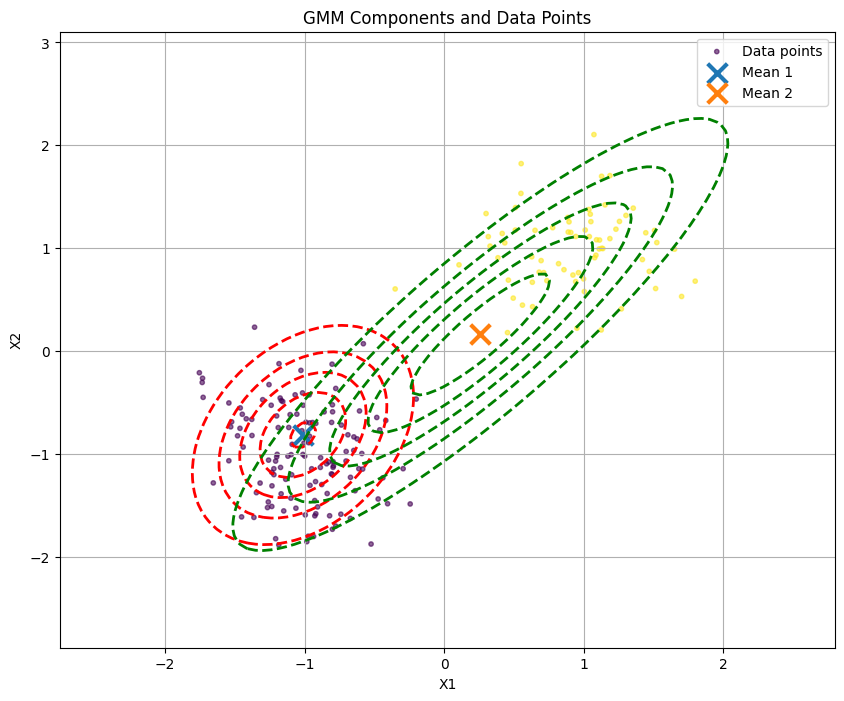

Log-likelihood: -399.6483
Iteration 10/20


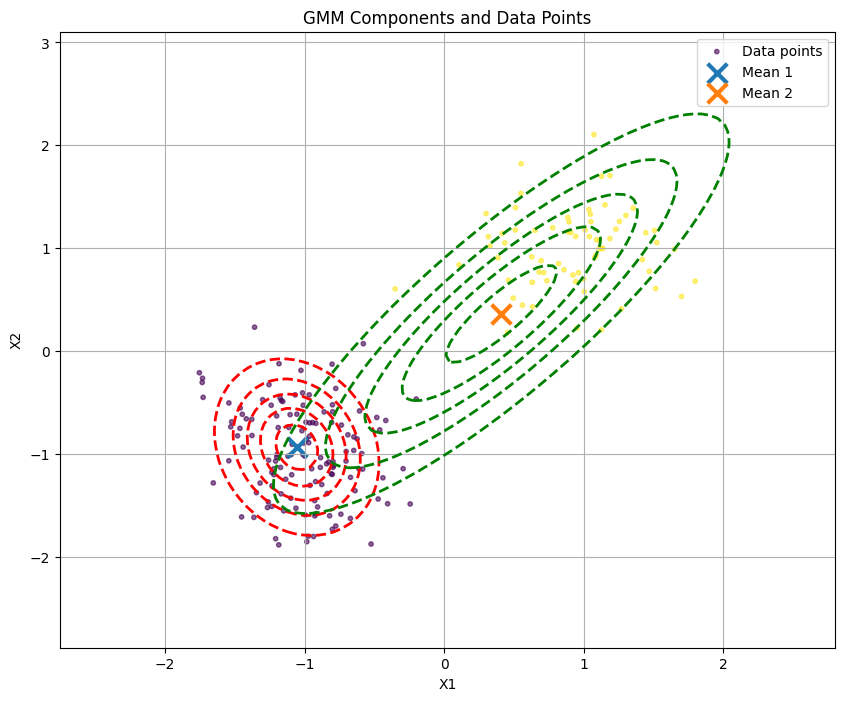

Log-likelihood: -362.9207
Iteration 11/20


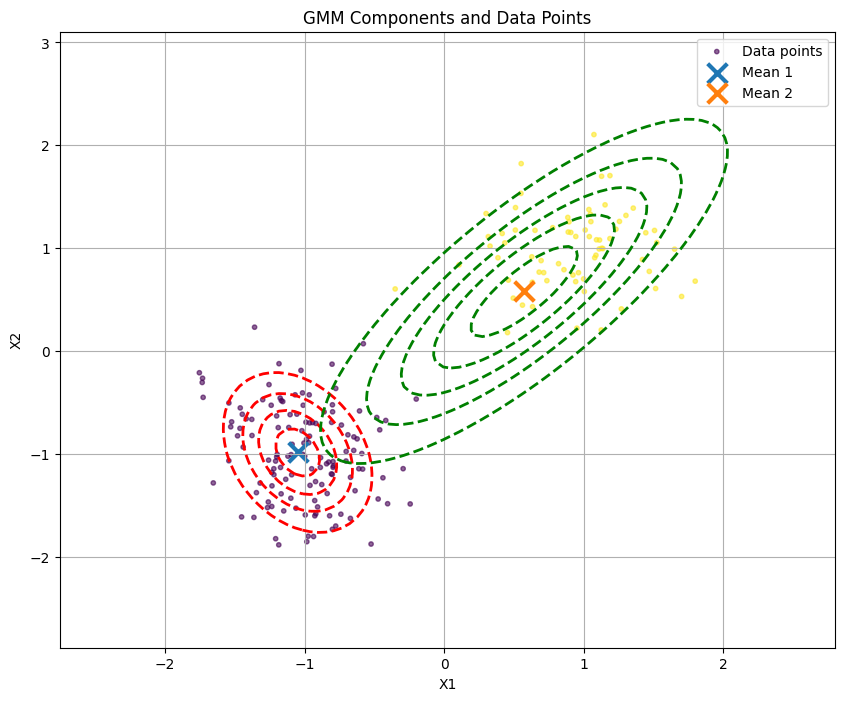

Log-likelihood: -351.0332
Iteration 12/20


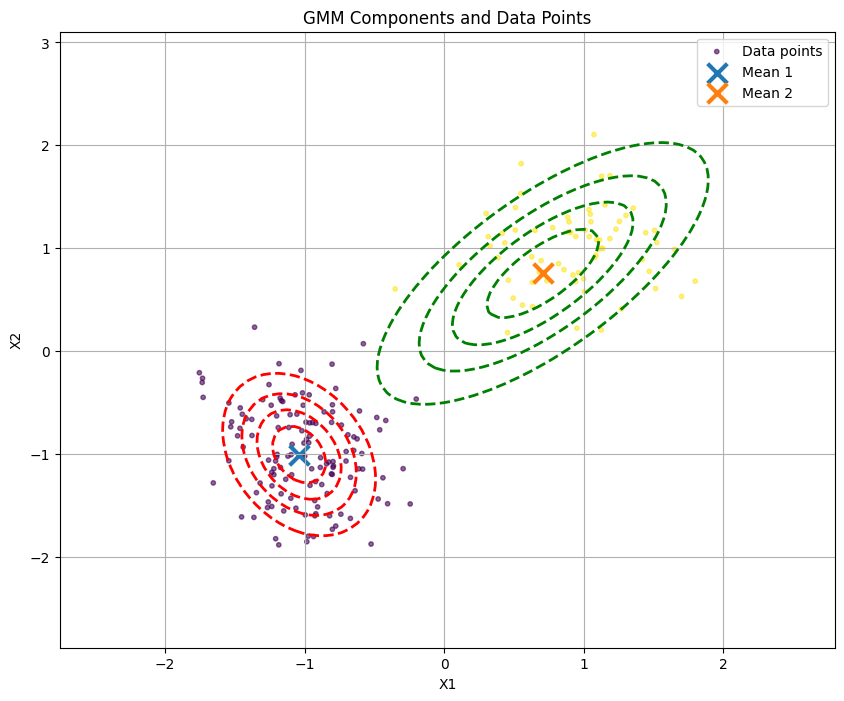

Log-likelihood: -339.4990
Iteration 13/20


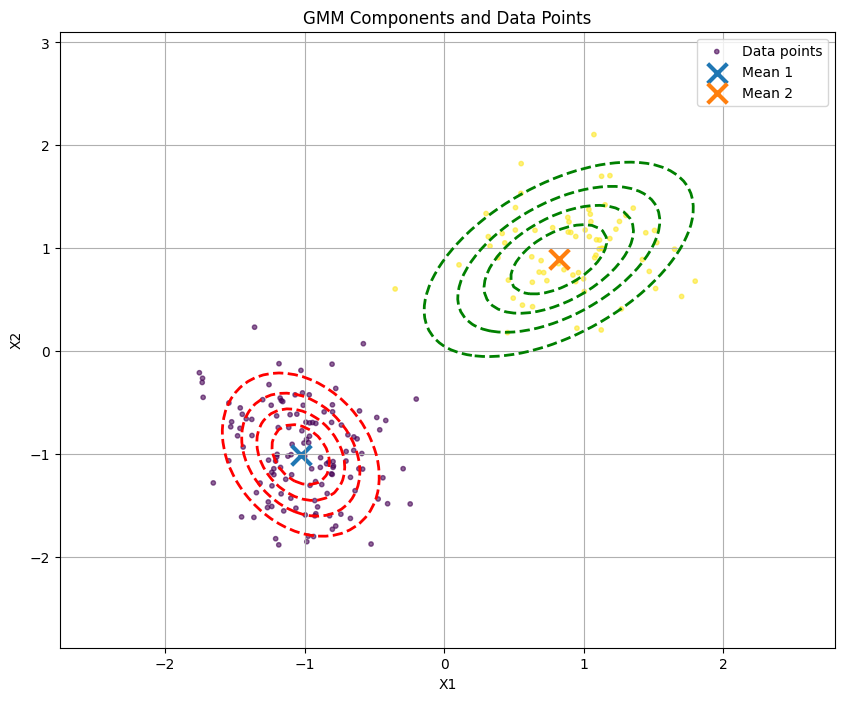

Log-likelihood: -324.2113
Iteration 14/20


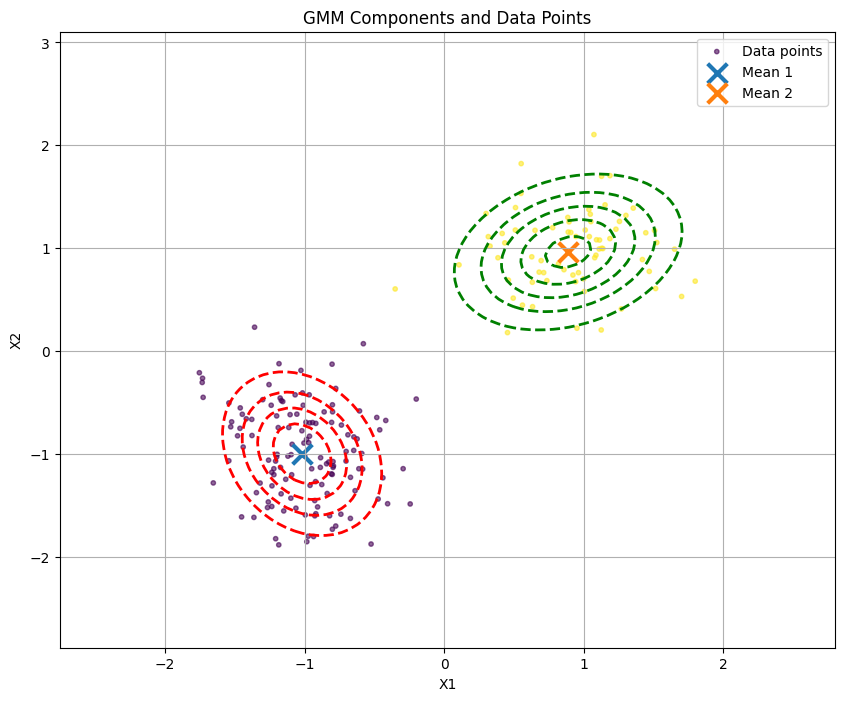

Log-likelihood: -313.3181
Iteration 15/20


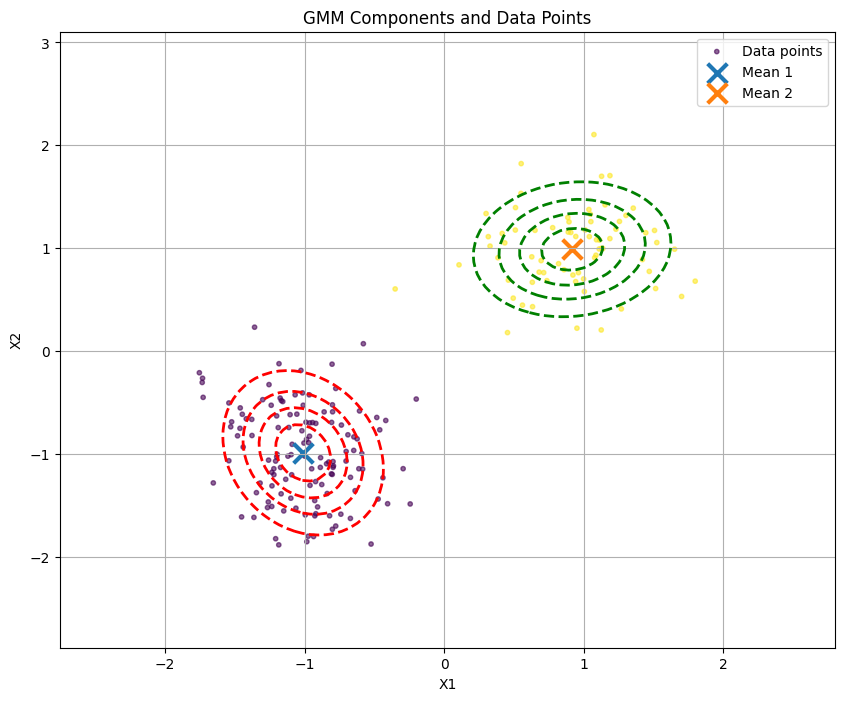

Log-likelihood: -310.6194
Iteration 16/20


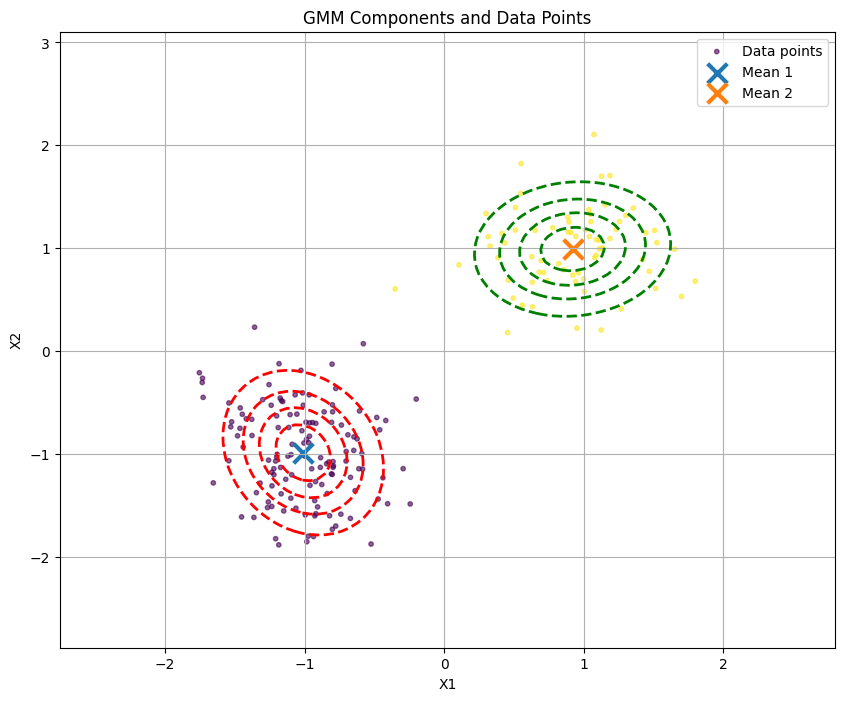

Log-likelihood: -310.5894
Iteration 17/20


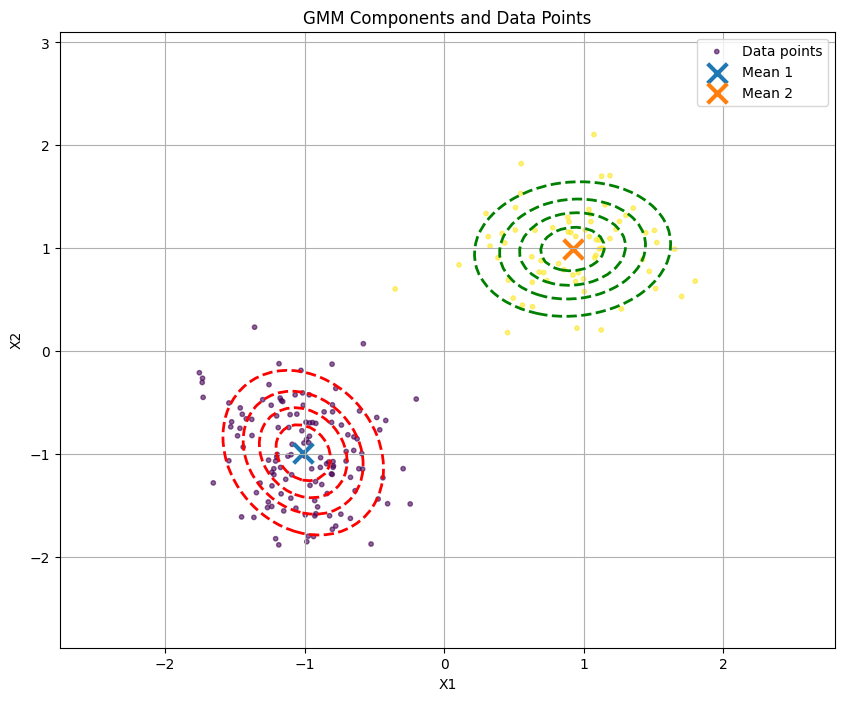

Log-likelihood: -310.5893
Converged!


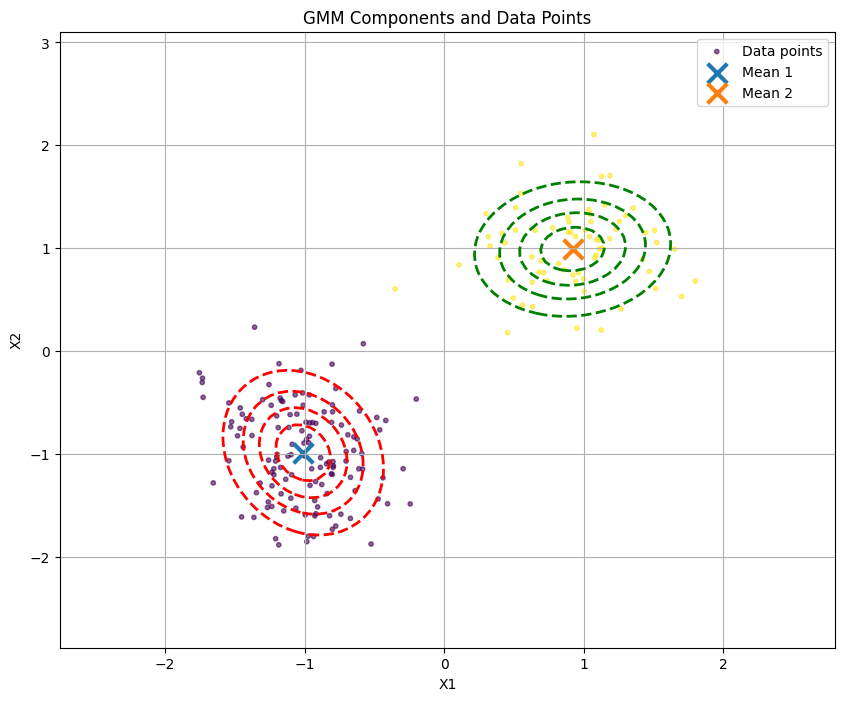

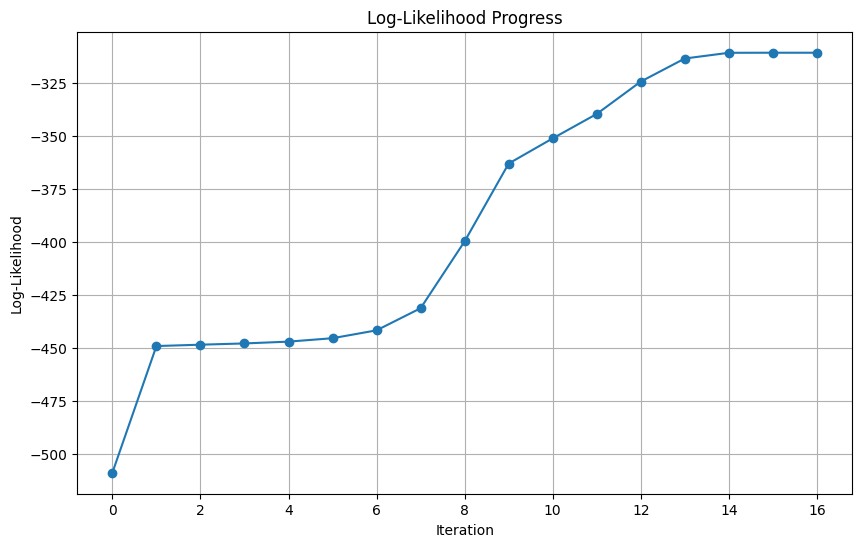


Running EM algorithm with spherical covariance matrices:
Iteration 1/20


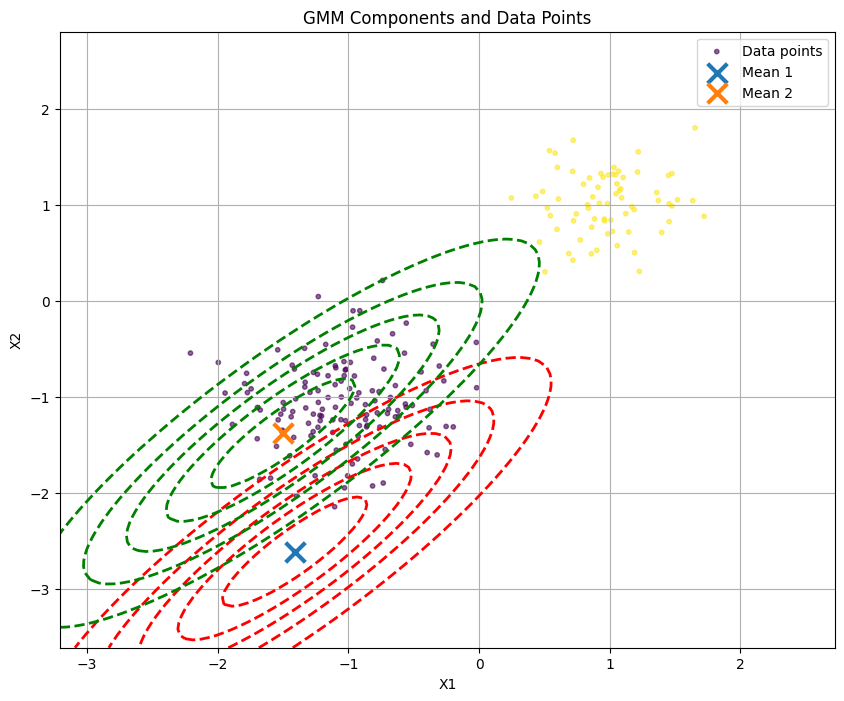

Log-likelihood: -652.6140
Iteration 2/20


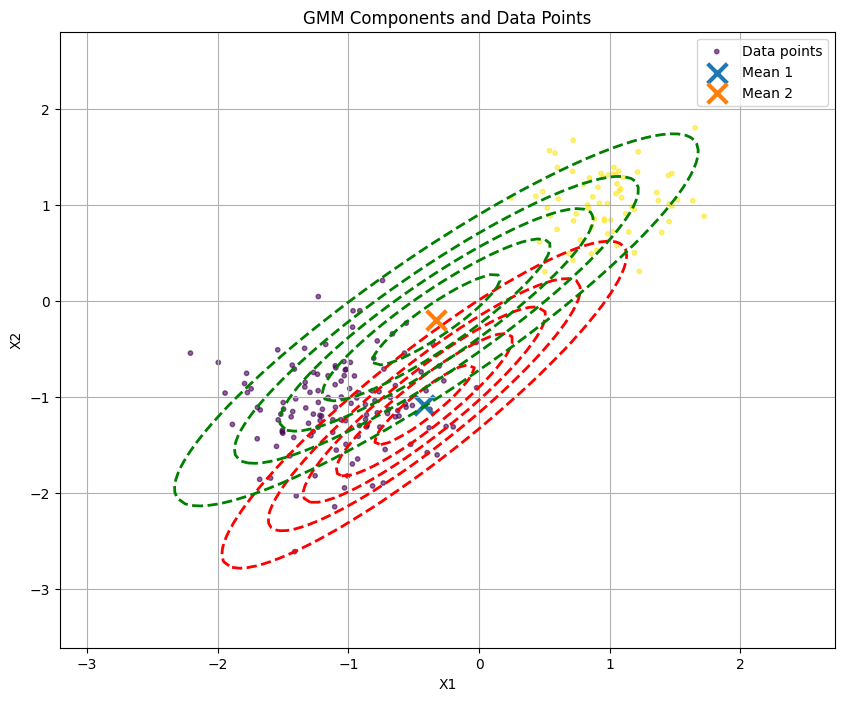

Log-likelihood: -443.8480
Iteration 3/20


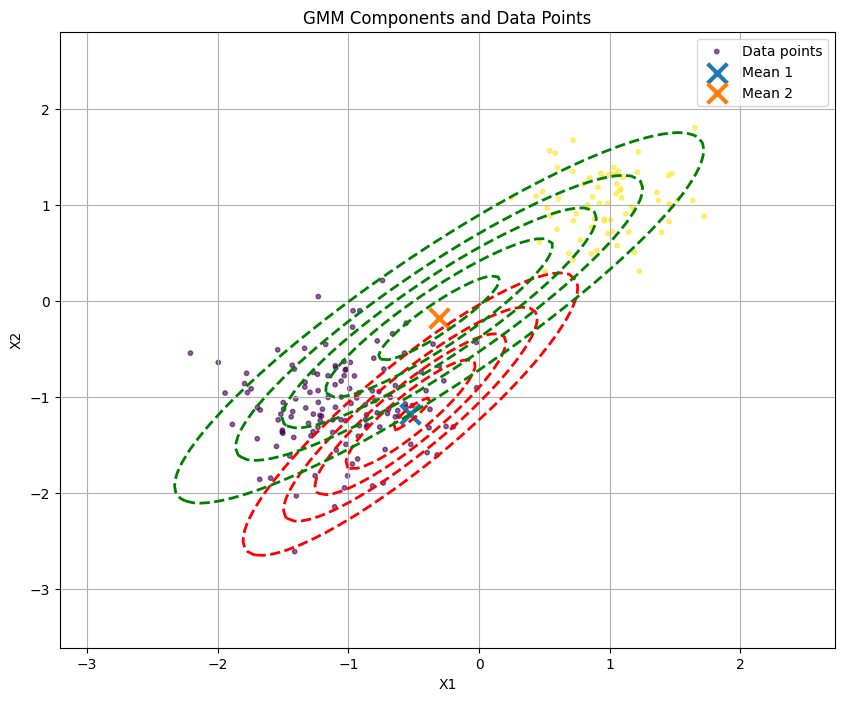

Log-likelihood: -441.0849
Iteration 4/20


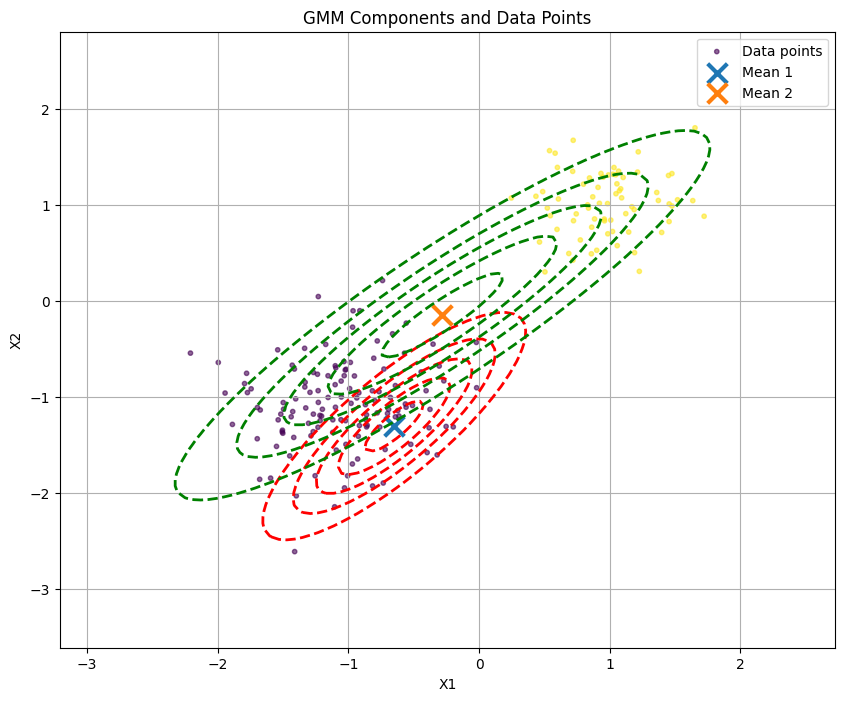

Log-likelihood: -434.9284
Iteration 5/20


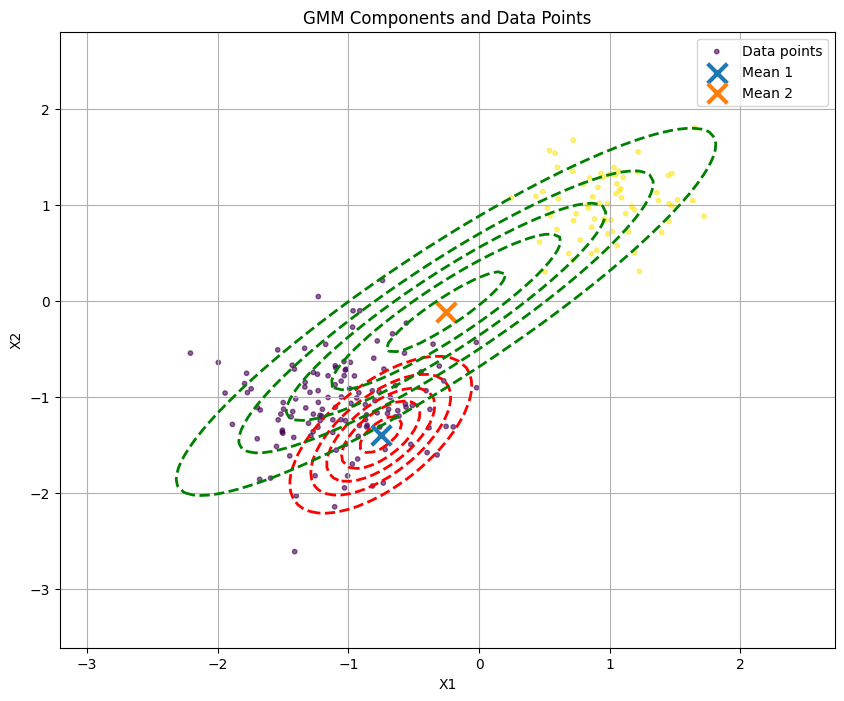

Log-likelihood: -425.2806
Iteration 6/20


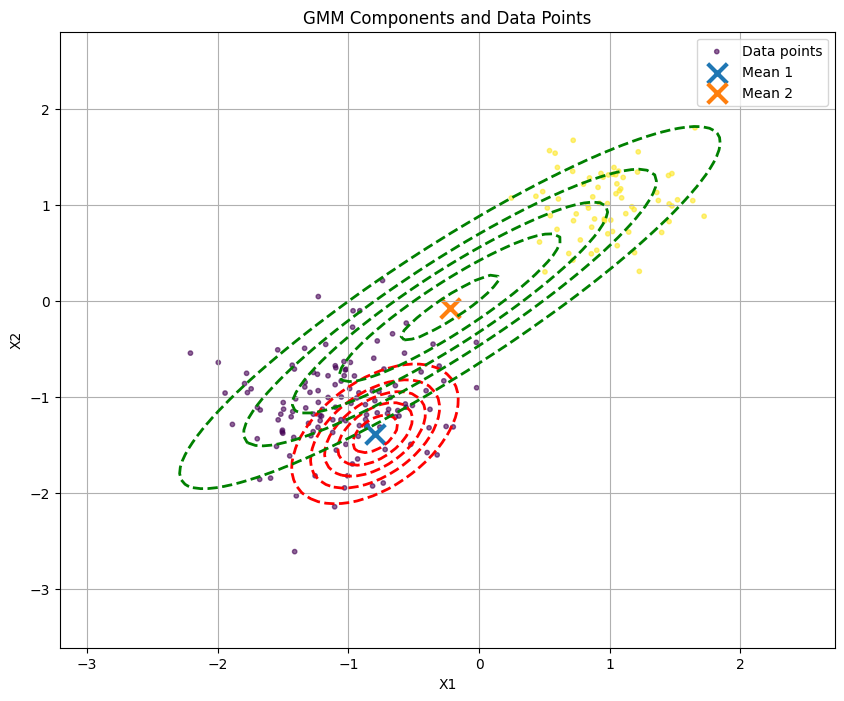

Log-likelihood: -420.3536
Iteration 7/20


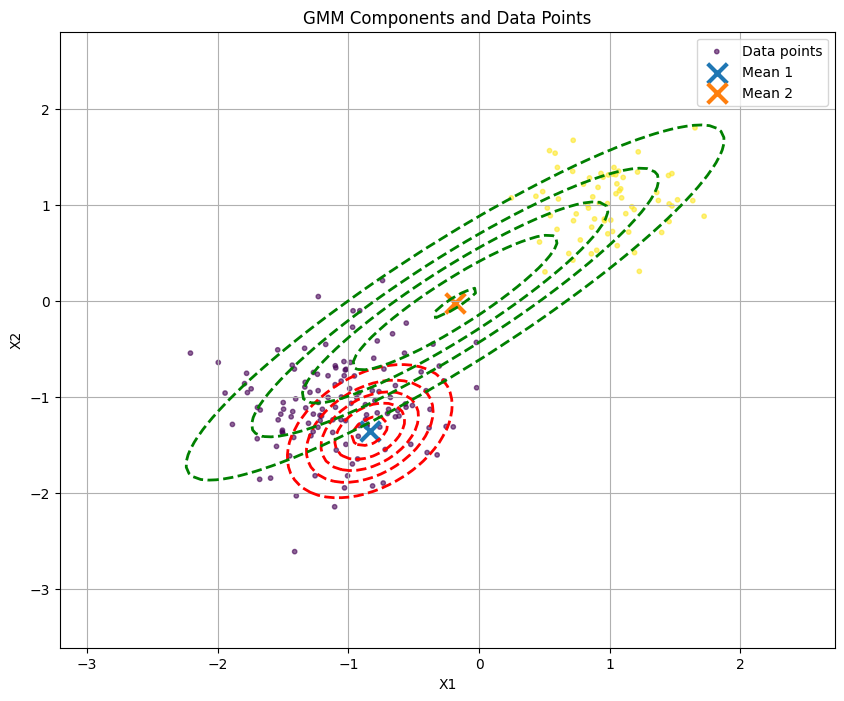

Log-likelihood: -415.1106
Iteration 8/20


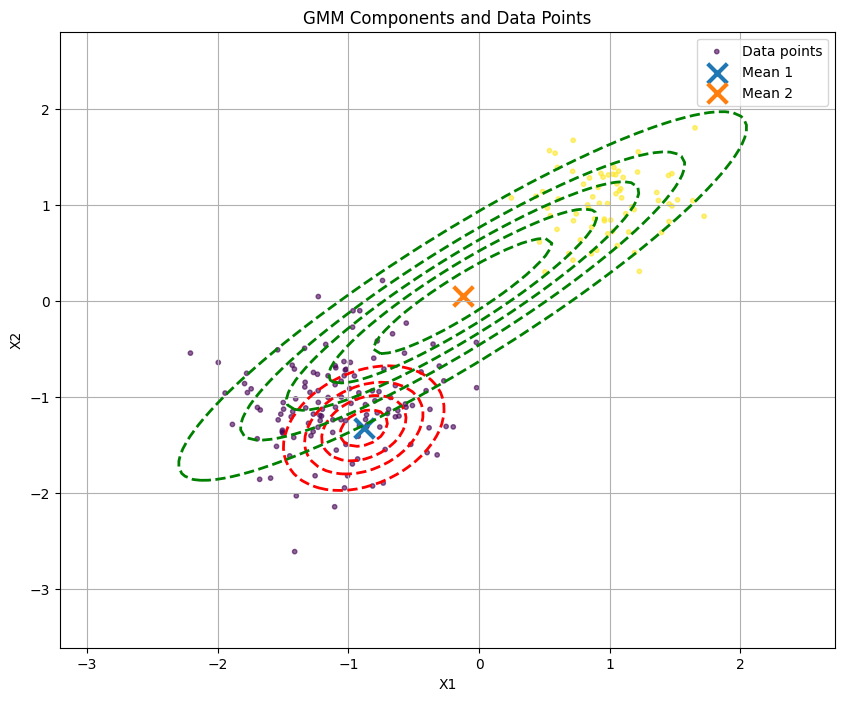

Log-likelihood: -408.6143
Iteration 9/20


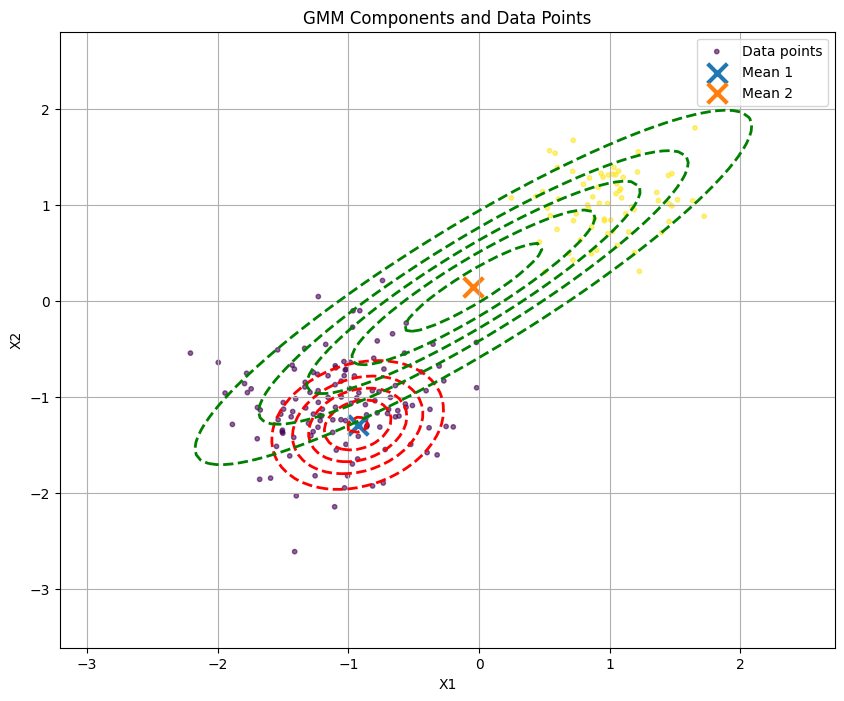

Log-likelihood: -401.2875
Iteration 10/20


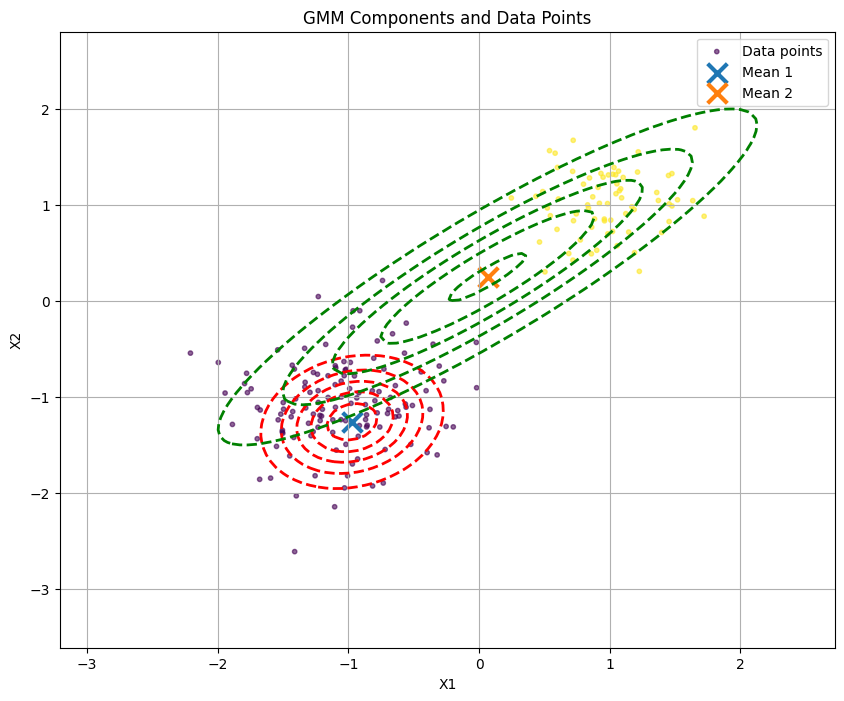

Log-likelihood: -393.9699
Iteration 11/20


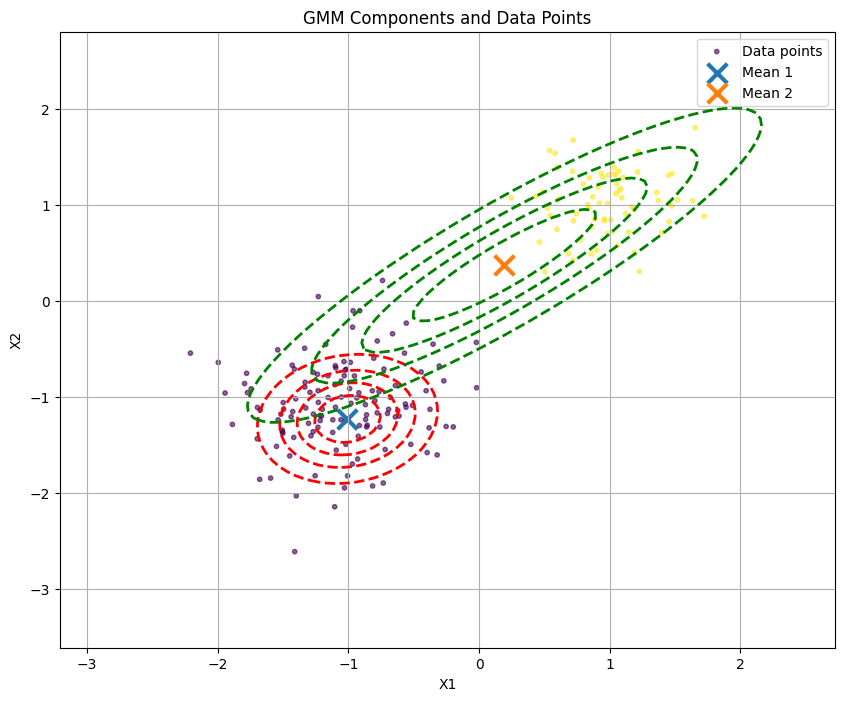

Log-likelihood: -387.2052
Iteration 12/20


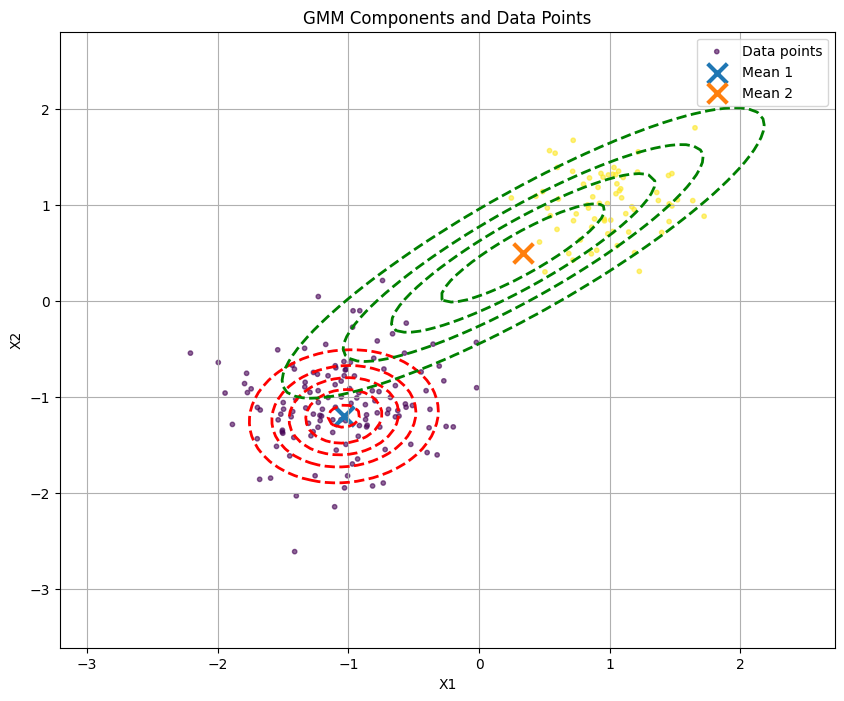

Log-likelihood: -380.8578
Iteration 13/20


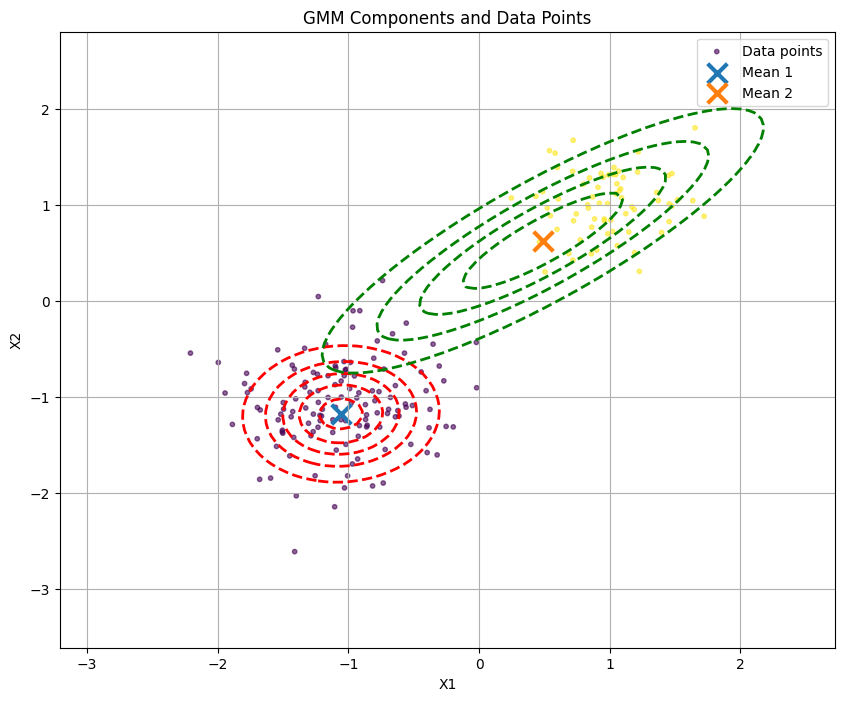

Log-likelihood: -374.1203
Iteration 14/20


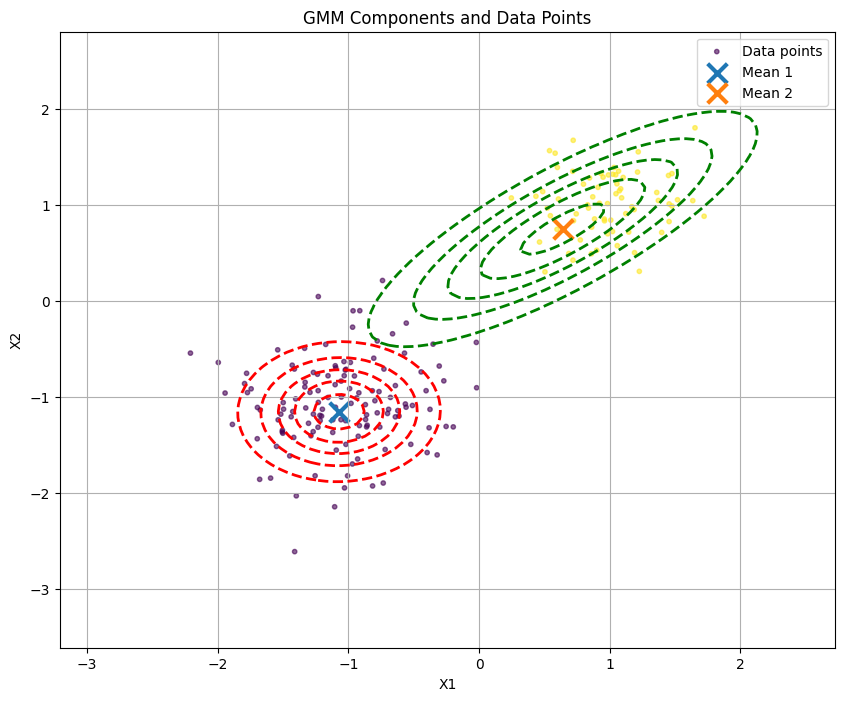

Log-likelihood: -365.7032
Iteration 15/20


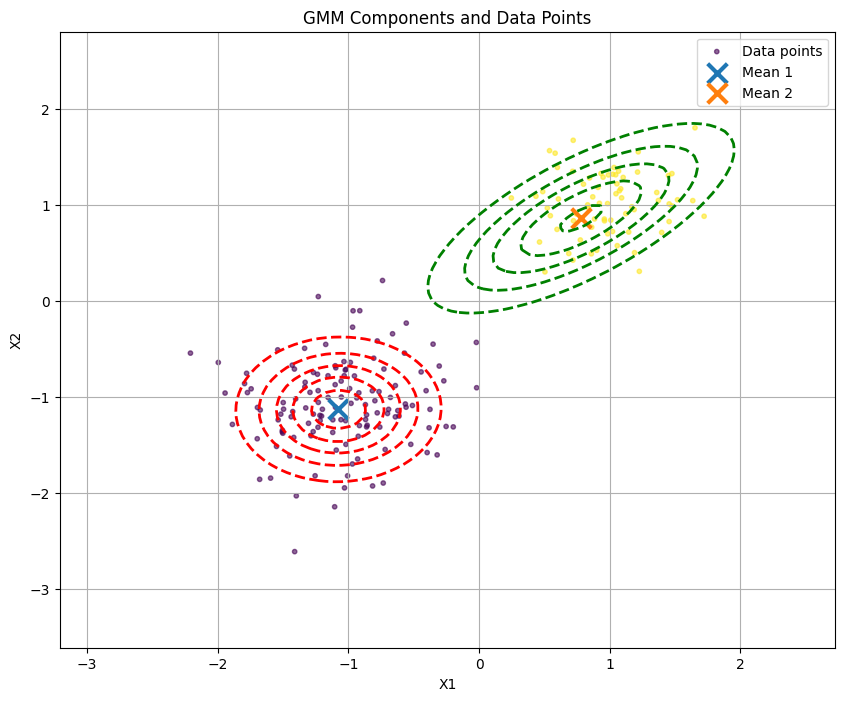

Log-likelihood: -353.8123
Iteration 16/20


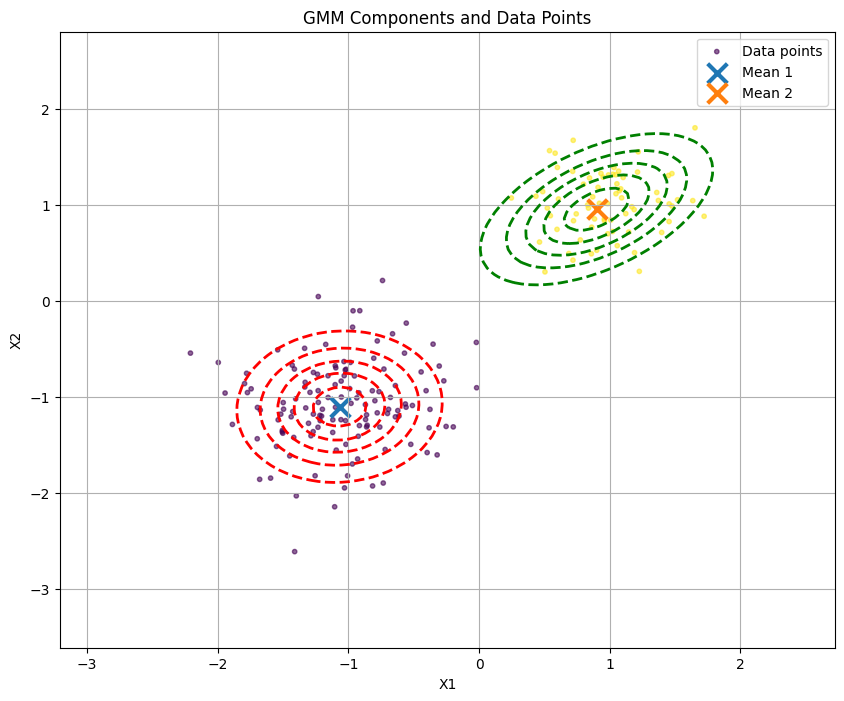

Log-likelihood: -335.7949
Iteration 17/20


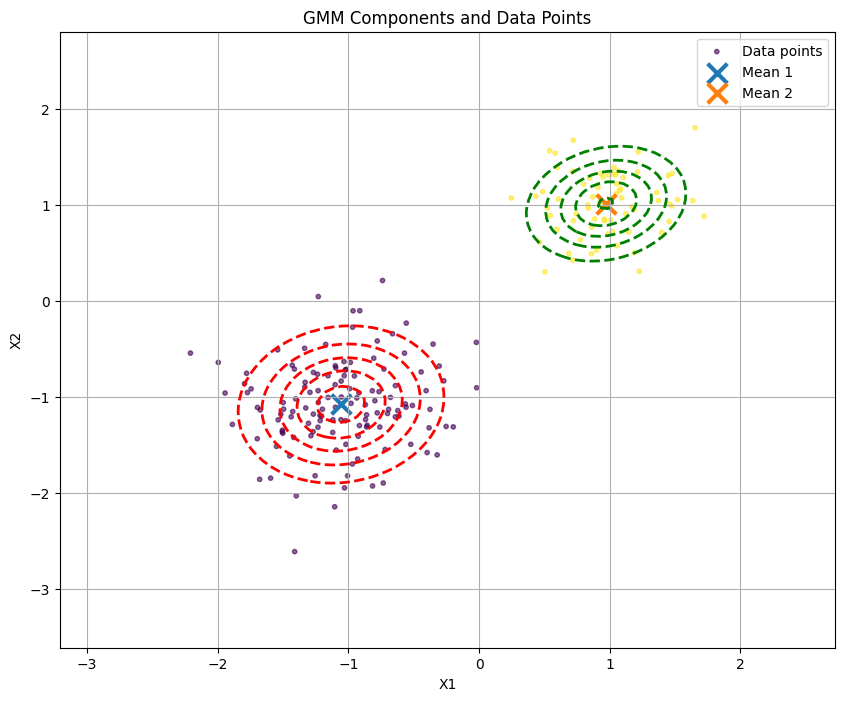

Log-likelihood: -321.4277
Iteration 18/20


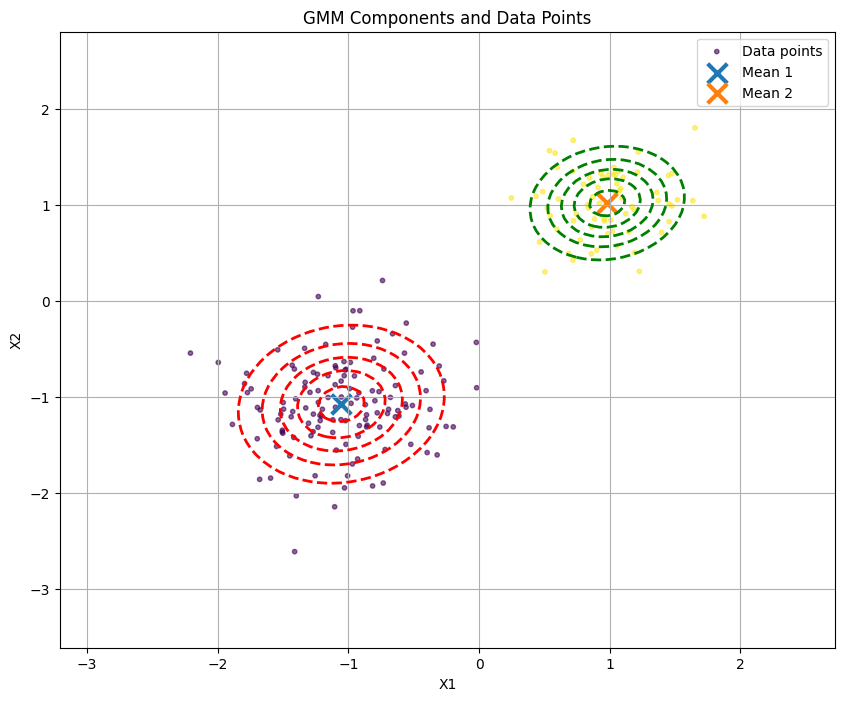

Log-likelihood: -320.9994
Iteration 19/20


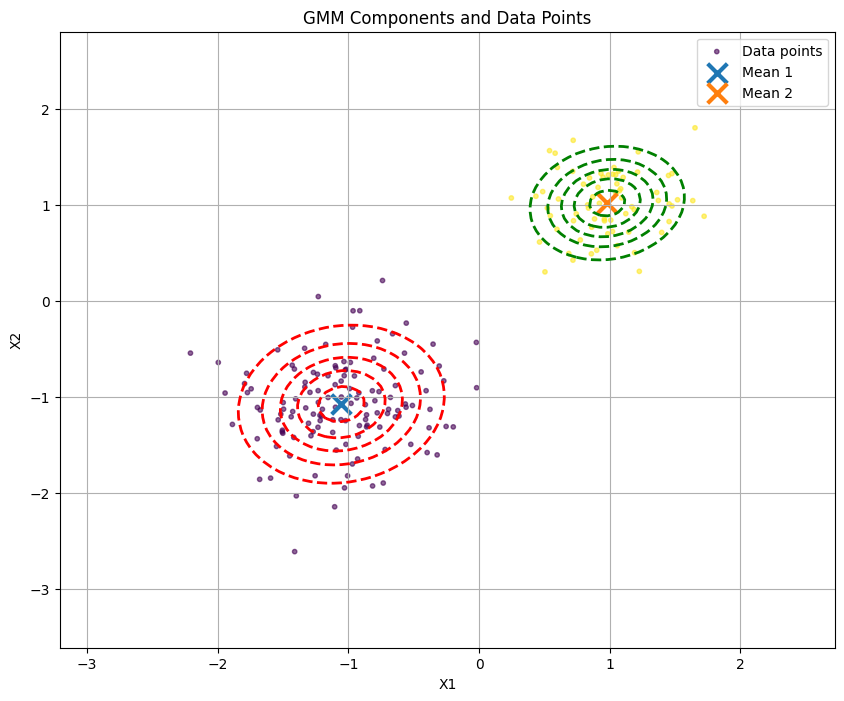

Log-likelihood: -320.9994
Converged!


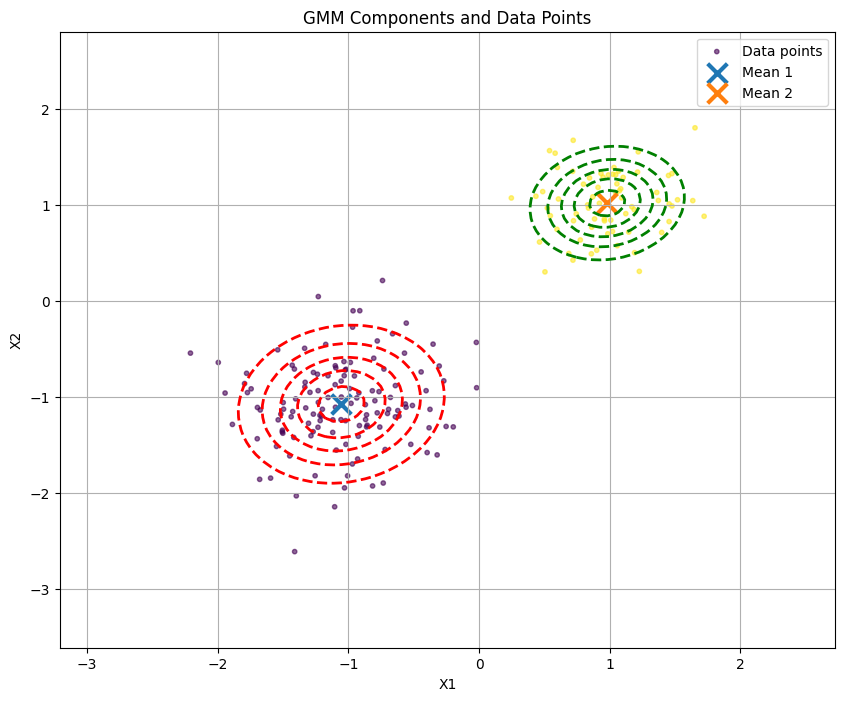

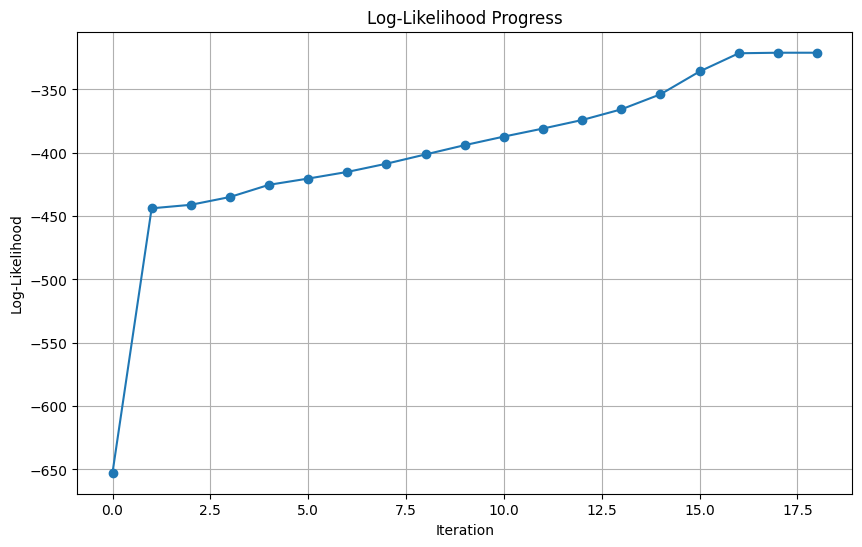

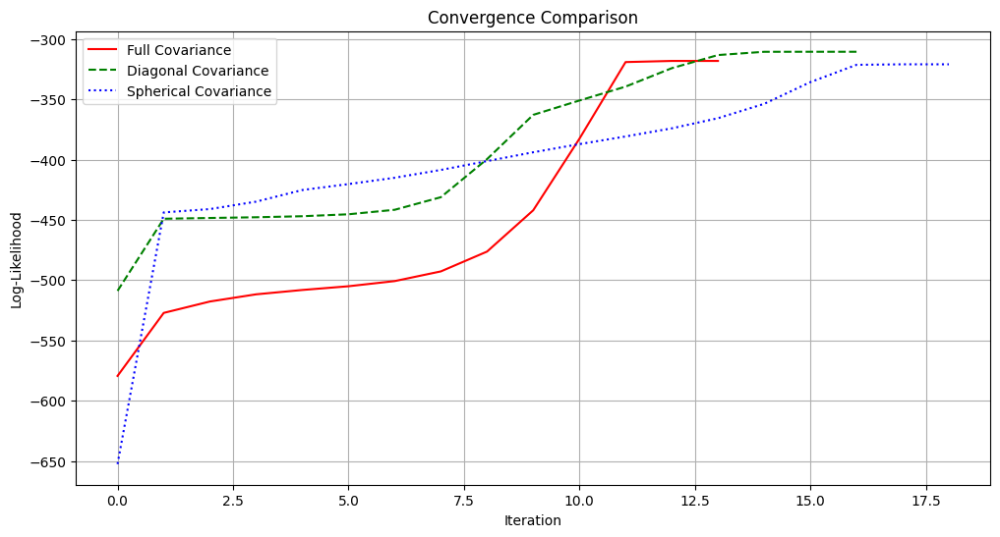

In [ ]:
def likelihood(data, pi, mu, sigma, log_likelihood=False, likelihoods=False):
    """
    Compute the likelihood of the data given GMM parameters.
    
    Args:
        data: Input data [N x D]
        pi: Mixture weights [M,]
        mu: Mean vectors [M x D]
        sigma: Covariance matrices [M x D x D]
        log_likelihood: Whether to return log-likelihood
        likelihoods: Whether to return per-point likelihoods
        
    Returns:
        Likelihood or log-likelihood, optionally per-point likelihoods
    """
    N, D = data.shape
    M = len(pi)
    
    likelihood_per_point = np.zeros(N)
    
    for n in range(N):
        for k in range(M):
            # Calculate multivariate normal probability density
            diff = data[n] - mu[k]
            inv_sigma = np.linalg.inv(sigma[k])
            det_sigma = np.linalg.det(sigma[k])
            
            exponent = -0.5 * np.dot(np.dot(diff, inv_sigma), diff)
            coeff = pi[k] / np.sqrt((2 * np.pi) ** D * det_sigma)
            likelihood_per_point[n] += coeff * np.exp(exponent)
    
    if likelihoods:
        if log_likelihood:
            return np.log(likelihood_per_point), likelihood_per_point
        return likelihood_per_point
    
    if log_likelihood:
        return np.sum(np.log(likelihood_per_point))
    
    return np.prod(likelihood_per_point)

def expectation(data, pi, mu, sigma):
    """
    E-step: Compute the responsibilities (gamma).
    
    Args:
        data: Input data [N x D]
        pi: Mixture weights [M,]
        mu: Mean vectors [M x D]
        sigma: Covariance matrices [M x D x D]
        
    Returns:
        gamma: Responsibilities [N x M]
    """
    N = len(data)
    M = len(pi)
    D = data.shape[1]
    
    gamma = np.zeros((N, M))
    
    for n in range(len(data)):
        # denominator (total probability)
        denominator = 0
        for j in range(M):
            diff = data[n] - mu[j]
            inv_sigma = np.linalg.inv(sigma[j])
            det_sigma = np.linalg.det(sigma[j])
            
            exponent = -0.5 * np.dot(np.dot(diff, inv_sigma), diff)
            coeff = pi[j] / np.sqrt((2 * np.pi) ** D * det_sigma)
            denominator += coeff * np.exp(exponent)
        
        # responsibility for each component
        for k in range(len(pi)):
            diff = data[n] - mu[k]
            inv_sigma = np.linalg.inv(sigma[k])
            det_sigma = np.linalg.det(sigma[k])
            
            exponent = -0.5 * np.dot(np.dot(diff, inv_sigma), diff)
            coeff = pi[k] / np.sqrt((2 * np.pi) ** D * det_sigma)
            numerator = coeff * np.exp(exponent)
            
            gamma[n, k] = numerator / denominator
            
    return gamma

def maximization(data, gamma):
    """
    M-step: Update the parameters.
    
    Args:
        data: Input data [N x D]
        gamma: Responsibilities [N x M]
        
    Returns:
        pi: Updated mixture weights [M,]
        mu: Updated mean vectors [M x D]
        sigma: Updated covariance matrices [M x D x D]
    """
    N, D = data.shape
    M = gamma.shape[1]
    
    # updating mixture weights (pi)
    N_k = np.sum(gamma, axis=0)  # Effective number of points per component
    pi = N_k / N
    
    # updating means (mu)
    mu = np.zeros((M, D))
    for k in range(M):
        for n in range(N):
            mu[k] += gamma[n, k] * data[n]
        mu[k] /= N_k[k]
    
    # updating covariance matrices (sigma)
    sigma = np.zeros((M, D, D))
    for k in range(M):
        for n in range(N):
            diff = data[n] - mu[k]
            sigma[k] += gamma[n, k] * np.outer(diff, diff)
        sigma[k] /= N_k[k]
    
    return pi, mu, sigma

def plot_contours(data, labels, pi, mu, sigma):
    """
    Plot the data and the contours of the GMM components.
    
    Args:
        data: Input data [N x D]
        labels: True component labels
        pi: Mixture weights [M,]
        mu: Mean vectors [M x D]
        sigma: Covariance matrices [M x D x D]
    """
    plt.figure(figsize=(10, 8))
    
    # plotting data points with true labels
    plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis', alpha=0.6, s=10, label='Data points')
    
    # plotting estimated means
    for k in range(len(mu)):
        plt.scatter(mu[k, 0], mu[k, 1], c=f'C{k}', marker='x', s=200, 
                    edgecolor='k', linewidth=3, label=f'Mean {k+1}')
    
    x_min, x_max = data[:, 0].min() - 1, data[:, 0].max() + 1
    y_min, y_max = data[:, 1].min() - 1, data[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                          np.linspace(y_min, y_max, 100))
    
    pos = np.dstack((xx, yy))
    colors = ['red', 'green', 'blue', 'orange', 'purple']
    
    for k in range(len(pi)):
        pos_flat = pos.reshape(-1, 2)
        Z = pi[k] * multivariate_normal.pdf(pos_flat, mean=mu[k], cov=sigma[k])
        Z = Z.reshape(xx.shape)
        
        plt.contour(xx, yy, Z, levels=5, colors=colors[k % len(colors)], 
                    linestyles='dashed', linewidths=2, label=f'Component {k+1}')
    
    plt.title('GMM Components and Data Points')
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.grid(True)
    plt.legend()
    plt.show()
    
def run_em_algorithm(data, labels, M=2, n_steps=20):
    """
    Run the EM algorithm for GMM parameter estimation.
    
    Args:
        data: Input data [N x D]
        labels: True component labels
        M: Number of components
        n_steps: Maximum number of iterations
    """
    N, D = data.shape
    
    pi = np.ones(M) / M  # Equal weights
    indices = np.random.choice(N, M, replace=False)
    mu = data[indices]  # Random means from data
    sigma = np.array([np.cov(data.T) for _ in range(M)])  # Initial covariance
    
    log_likelihoods = []
    
    for iteration in range(n_steps):
        print(f"Iteration {iteration+1}/{n_steps}")
        plot_contours(data, labels, pi, mu, sigma)
        
        ll = likelihood(data, pi, mu, sigma, log_likelihood=True)
        log_likelihoods.append(ll)
        print(f"Log-likelihood: {ll:.4f}")
        
        # E-step: Compute responsibilities
        gamma = expectation(data, pi, mu, sigma)
        
        # M-step: Update parameters
        pi, mu, sigma = maximization(data, gamma)
        
        if iteration > 0 and abs(log_likelihoods[-1] - log_likelihoods[-2]) < 1e-3:
            print("Converged!")
            break
    

    plot_contours(data, labels, pi, mu, sigma)
    
    plt.figure(figsize=(10, 6))
    plt.plot(log_likelihoods, 'o-')
    plt.title('Log-Likelihood Progress')
    plt.xlabel('Iteration')
    plt.ylabel('Log-Likelihood')
    plt.grid(True)
    plt.show()
    
    return pi, mu, sigma, log_likelihoods

# For full covariance matrices:
print("Running EM algorithm with full covariance matrices:")
pi_full, mu_full, sigma_full, ll_full = run_em_algorithm(data_full, labels_full, M=2)

# For diagonal covariance matrices:
print("\nRunning EM algorithm with diagonal covariance matrices:")
pi_diag, mu_diag, sigma_diag, ll_diag = run_em_algorithm(data_dg, labels_dg, M=2)

# For spherical covariance matrices:
print("\nRunning EM algorithm with spherical covariance matrices:")
pi_sph, mu_sph, sigma_sph, ll_sph = run_em_algorithm(data_sp, labels_sp, M=2)

plt.figure(figsize=(12, 6))
plt.plot(ll_full, 'r-', label='Full Covariance')
plt.plot(ll_diag, 'g--', label='Diagonal Covariance')
plt.plot(ll_sph, 'b:', label='Spherical Covariance')
plt.title('Convergence Comparison')
plt.xlabel('Iteration')
plt.ylabel('Log-Likelihood')
plt.legend()
plt.grid(True)
plt.show()

Running EM algorithm with full covariance matrices:
Iteration 1/20


C:\Users\abhin\AppData\Local\Temp\ipykernel_1504\2088835742.py:146: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(mu[k, 0], mu[k, 1], c=f'C{k}', marker='x', s=200,
C:\Users\abhin\AppData\Local\Temp\ipykernel_1504\2088835742.py:166: UserWarning: The following kwargs were not used by contour: 'label'
  plt.contour(xx, yy, Z, levels=5, colors=colors[k % len(colors)],


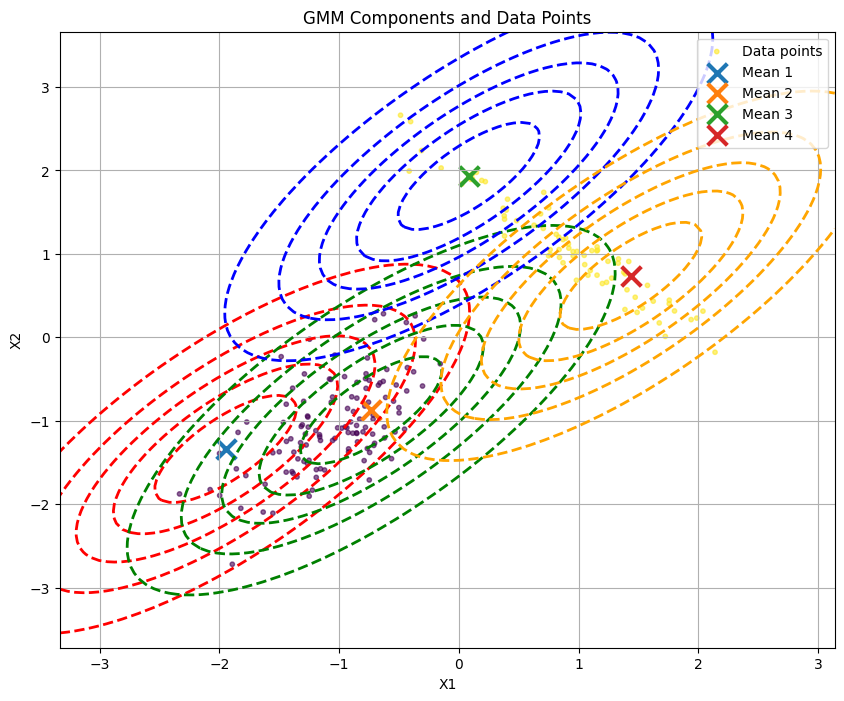

Log-likelihood: -580.1344
Iteration 2/20


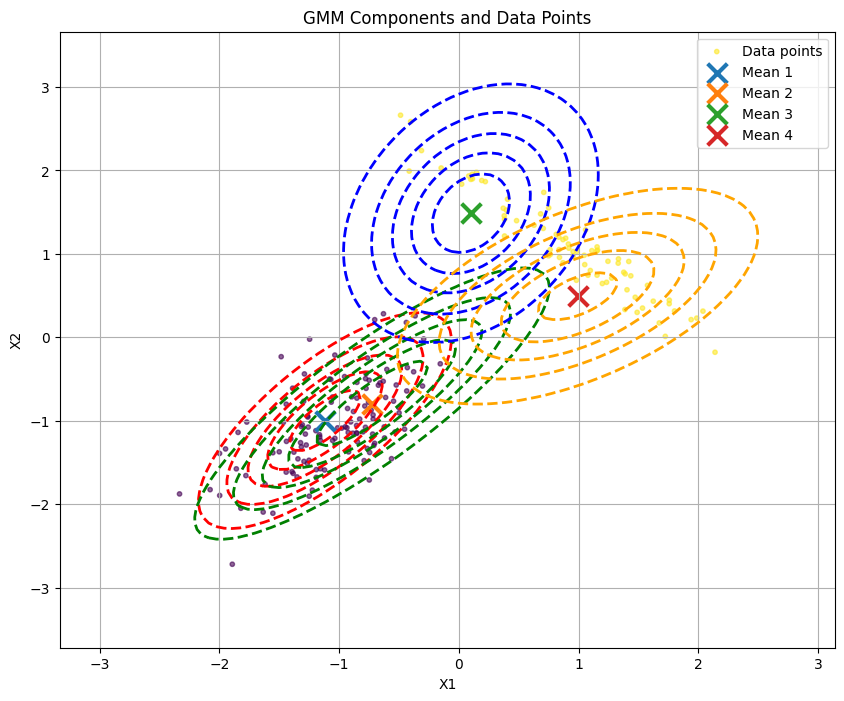

Log-likelihood: -453.3248
Iteration 3/20


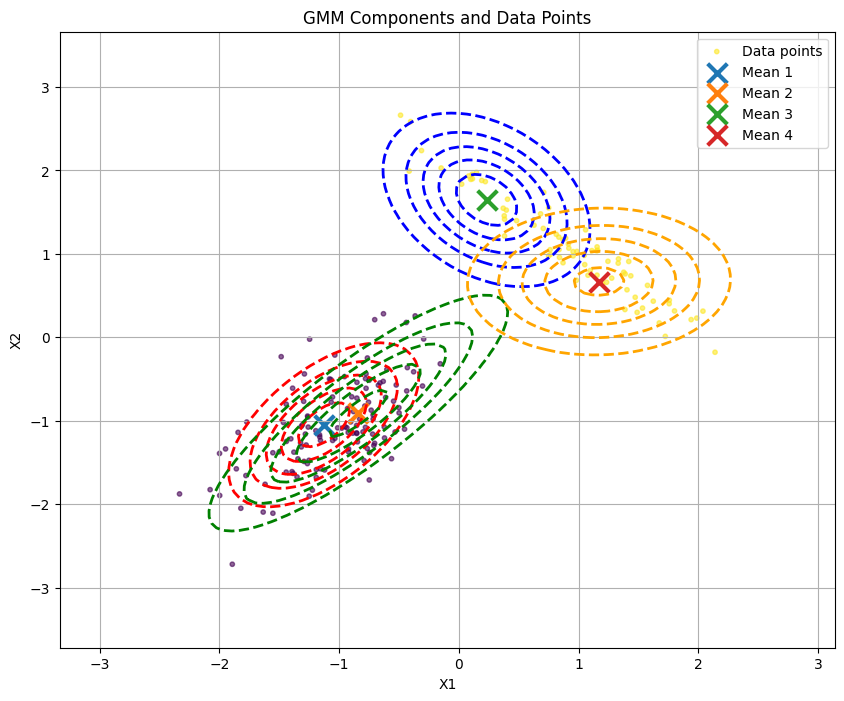

Log-likelihood: -398.9685
Iteration 4/20


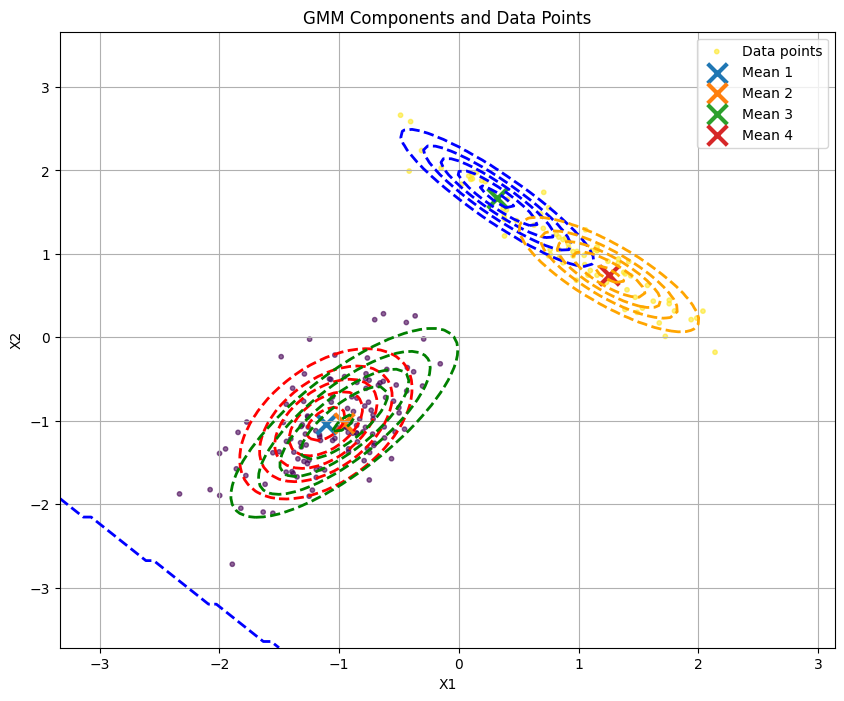

Log-likelihood: -322.4729
Iteration 5/20


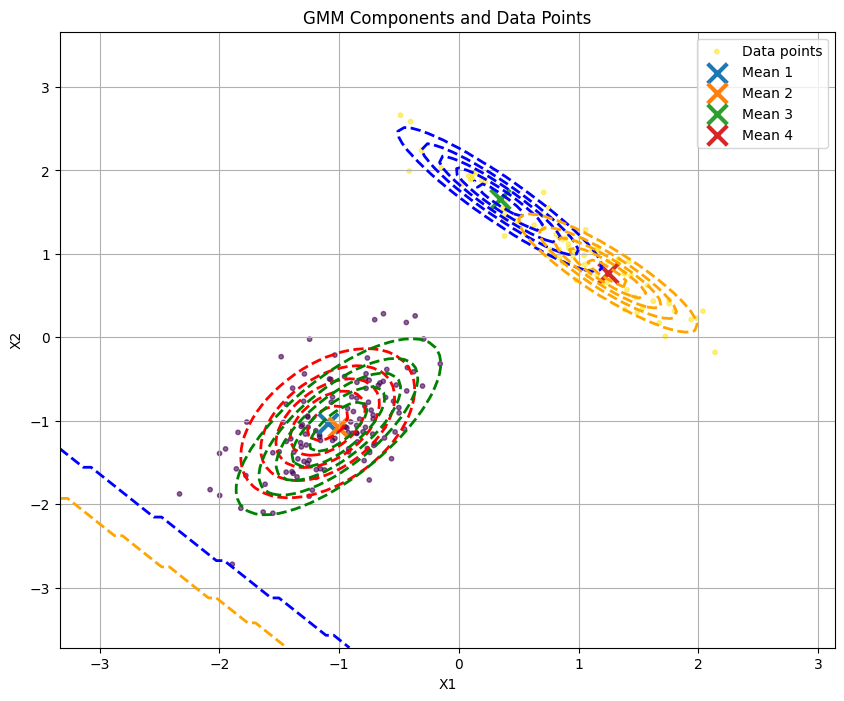

Log-likelihood: -316.6212
Iteration 6/20


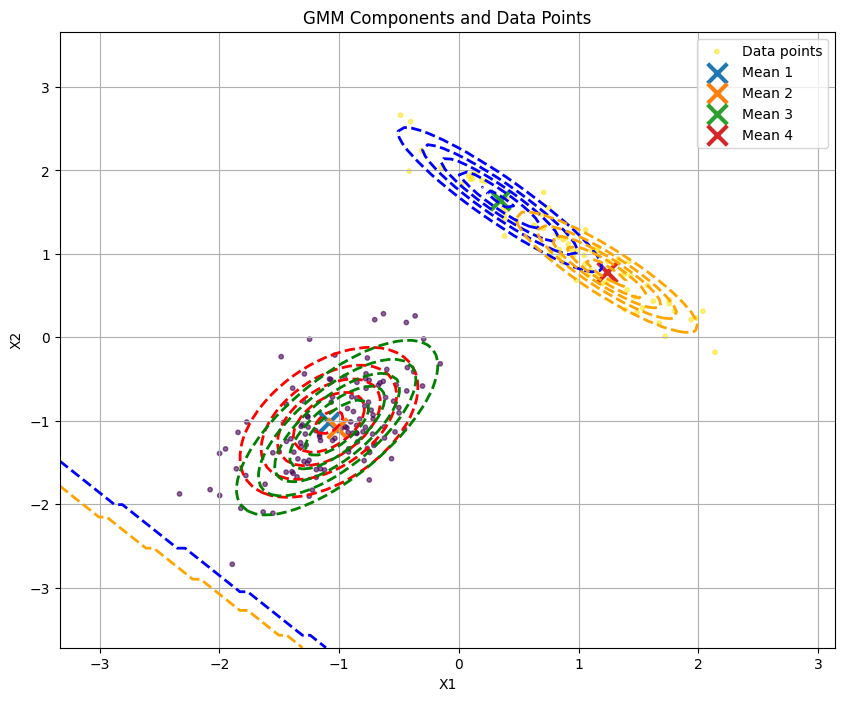

Log-likelihood: -316.1405
Iteration 7/20


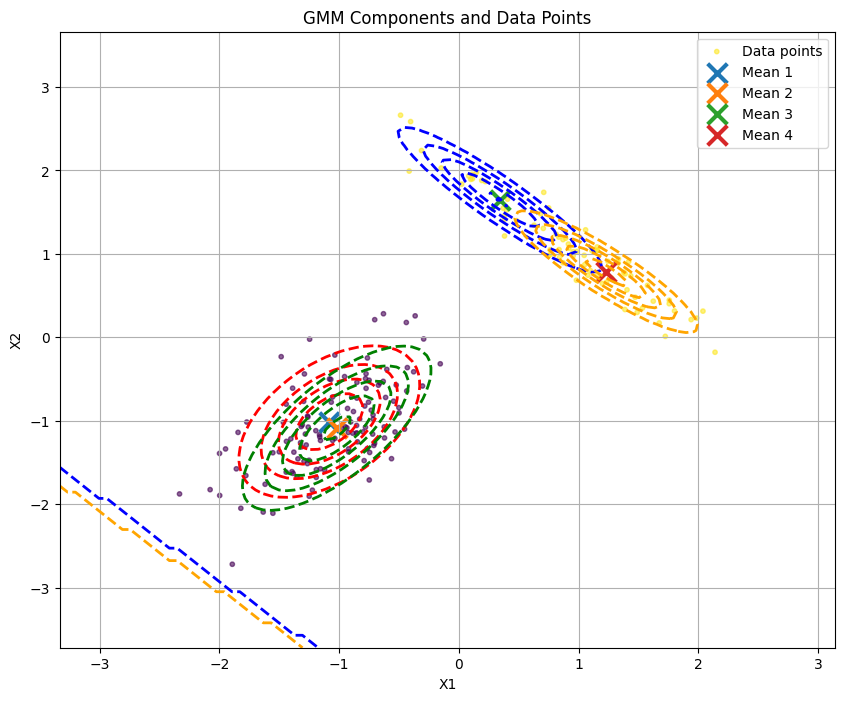

Log-likelihood: -315.8320
Iteration 8/20


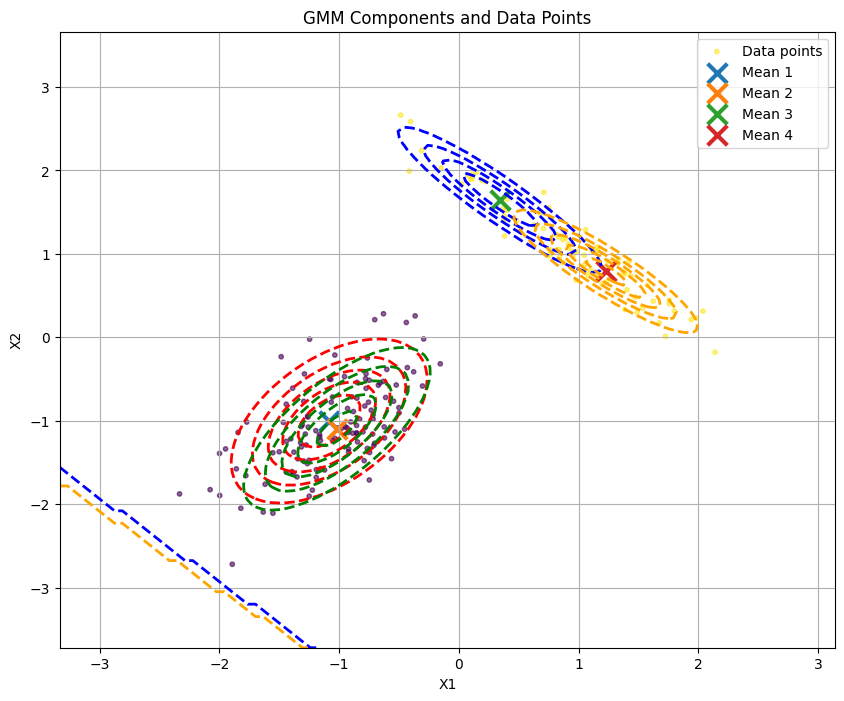

Log-likelihood: -315.4946
Iteration 9/20


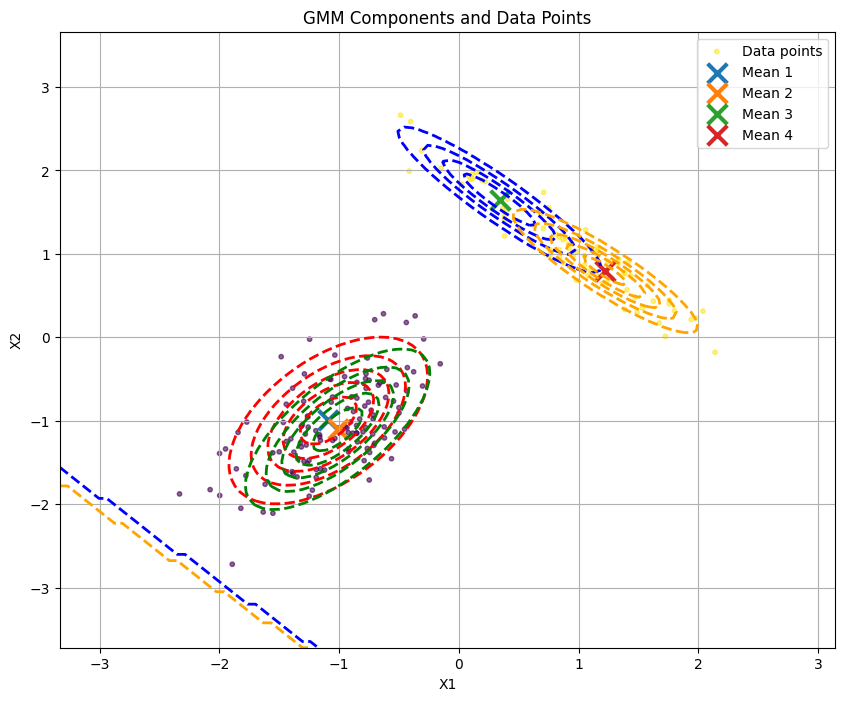

Log-likelihood: -315.0277
Iteration 10/20


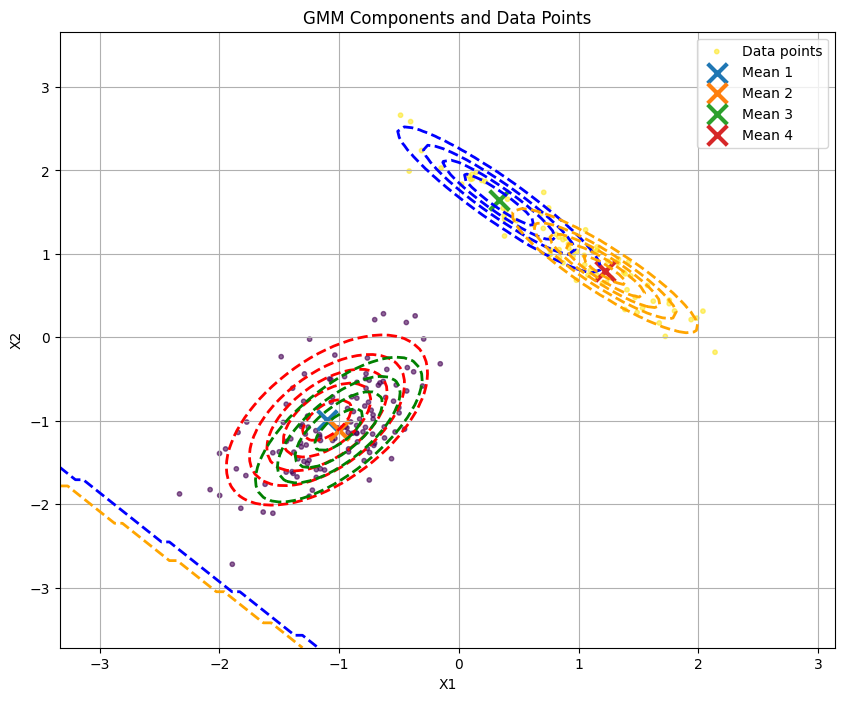

Log-likelihood: -314.3666
Iteration 11/20


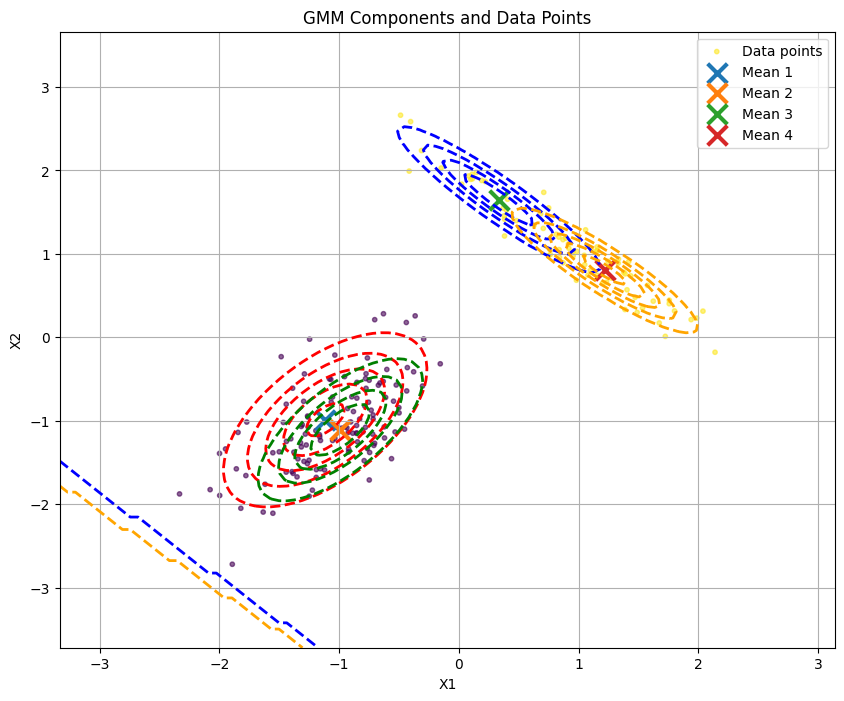

Log-likelihood: -313.4957
Iteration 12/20


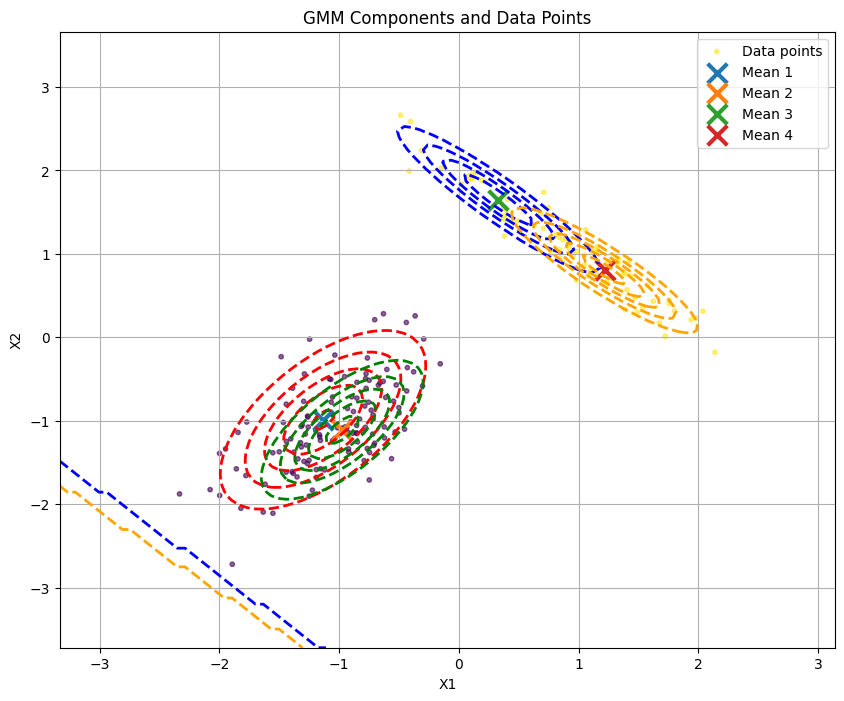

Log-likelihood: -312.4854
Iteration 13/20


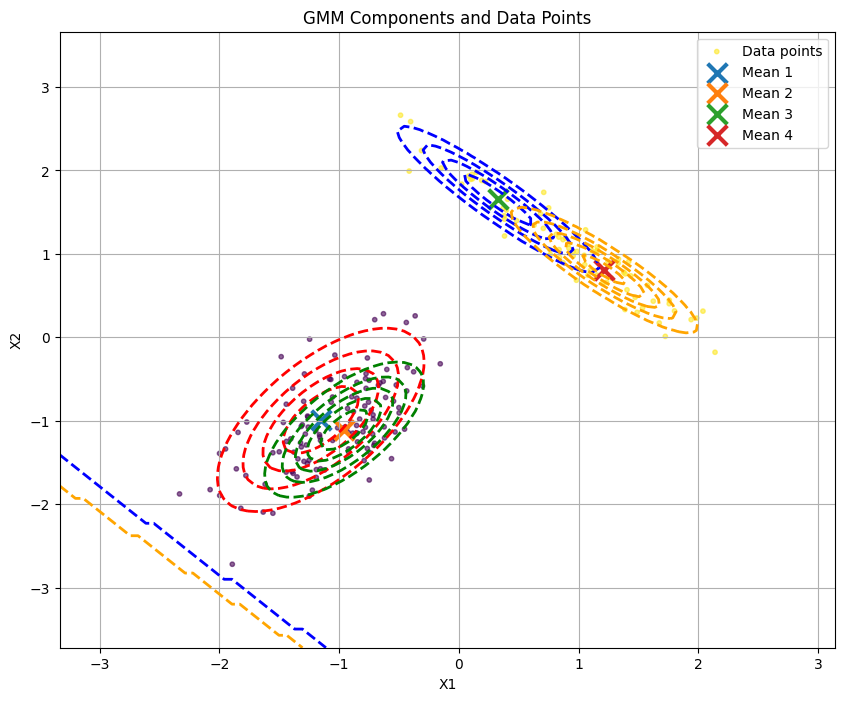

Log-likelihood: -311.5079
Iteration 14/20


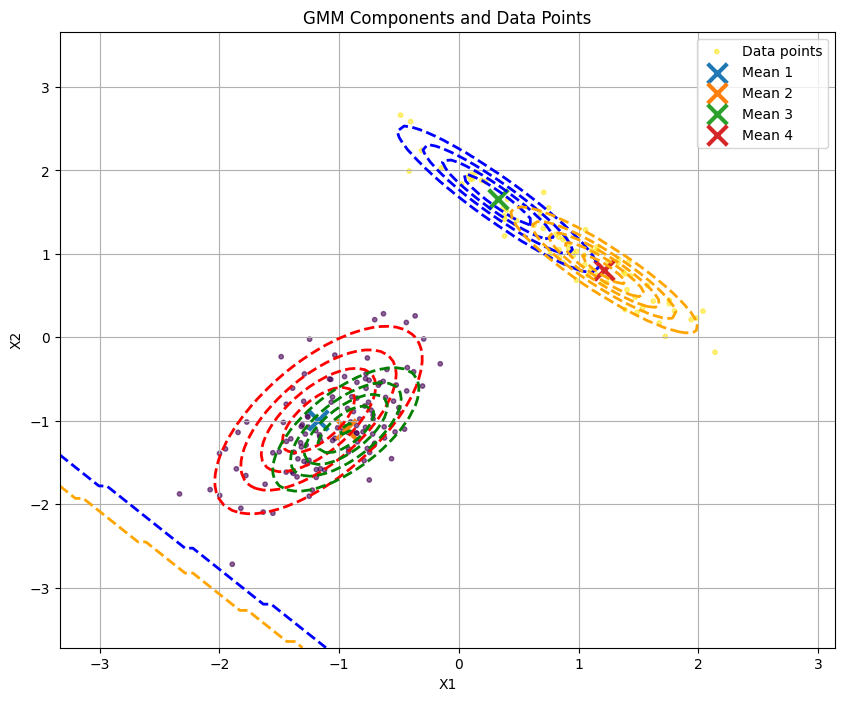

Log-likelihood: -310.7507
Iteration 15/20


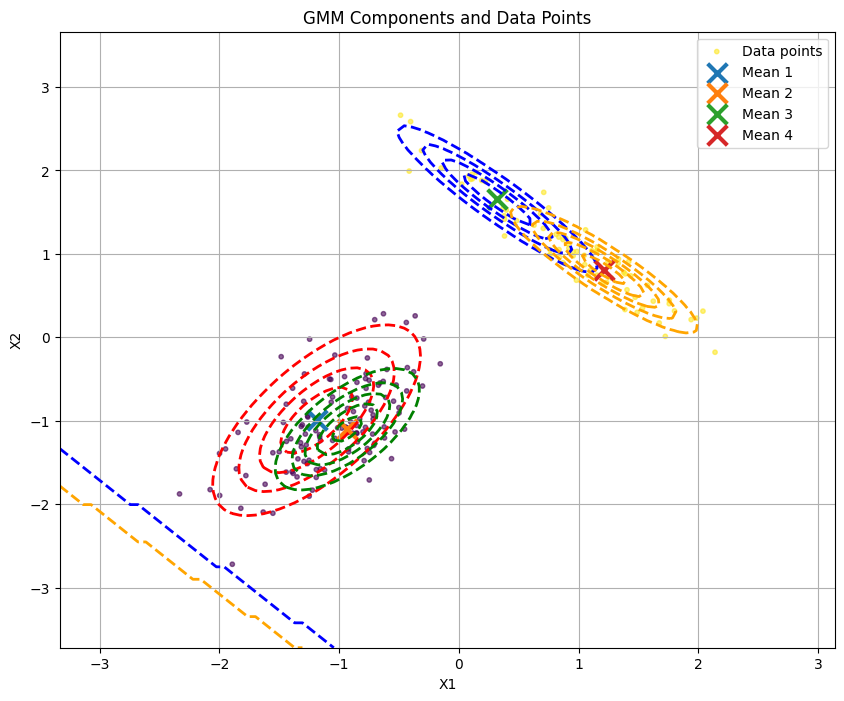

Log-likelihood: -310.2645
Iteration 16/20


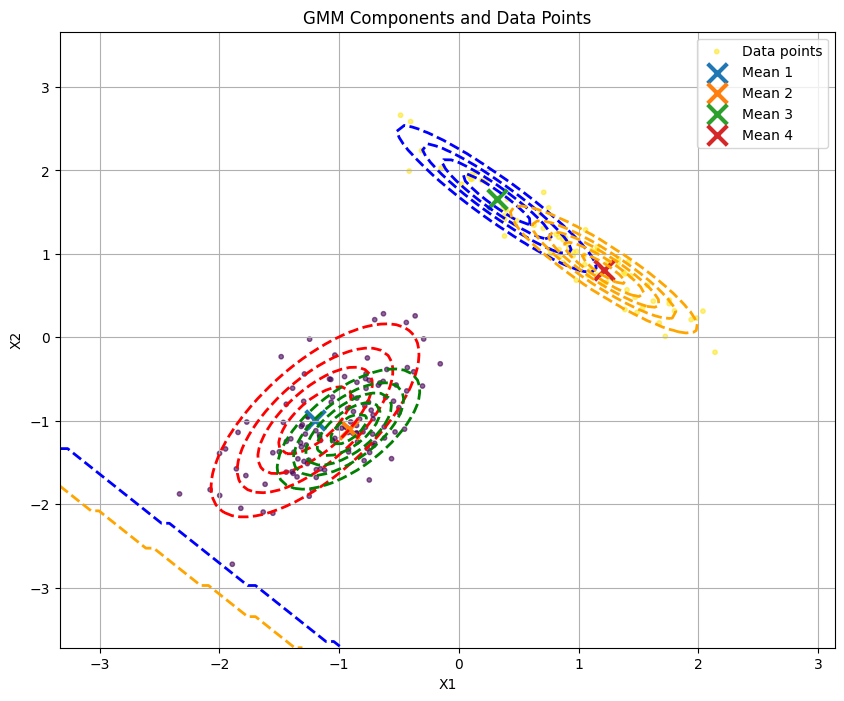

Log-likelihood: -309.9780
Iteration 17/20


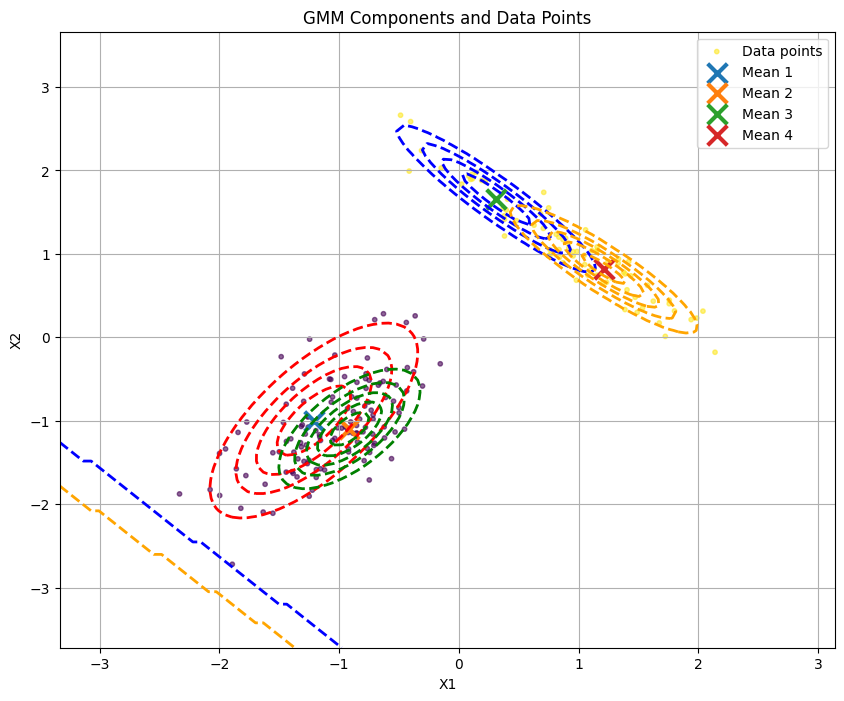

Log-likelihood: -309.8070
Iteration 18/20


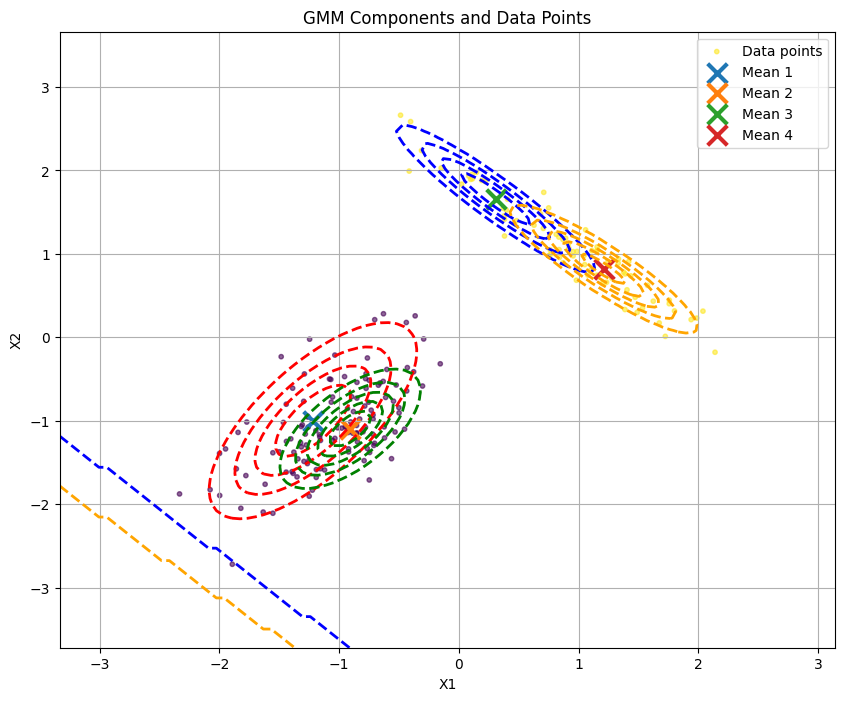

Log-likelihood: -309.6971
Iteration 19/20


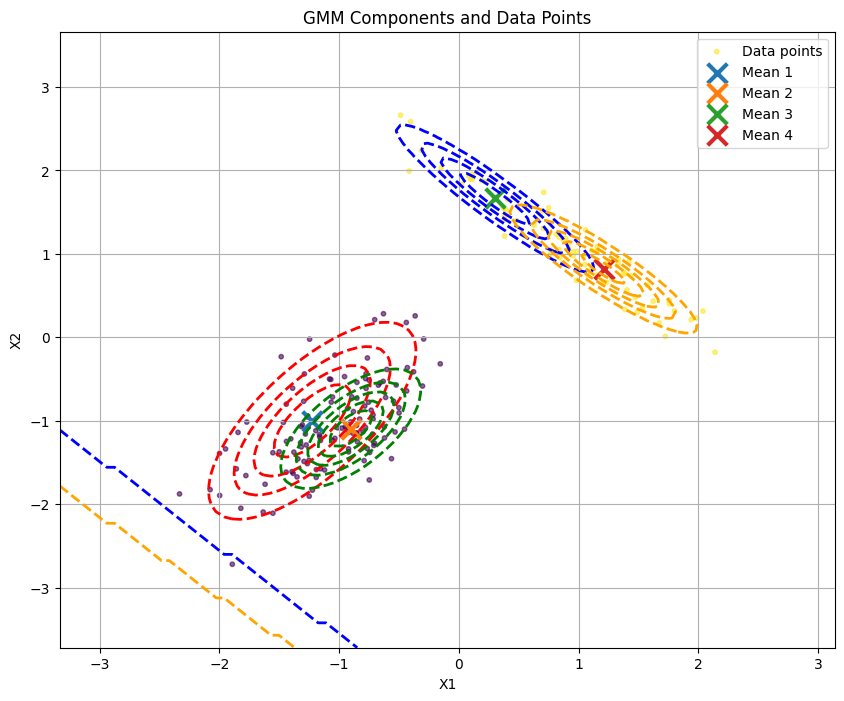

Log-likelihood: -309.6193
Iteration 20/20


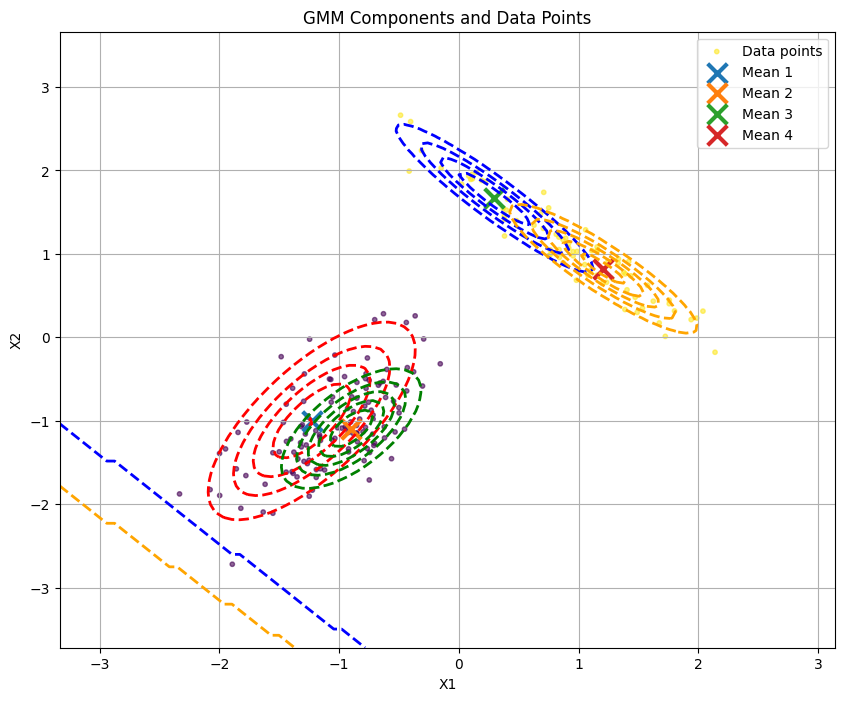

Log-likelihood: -309.5593


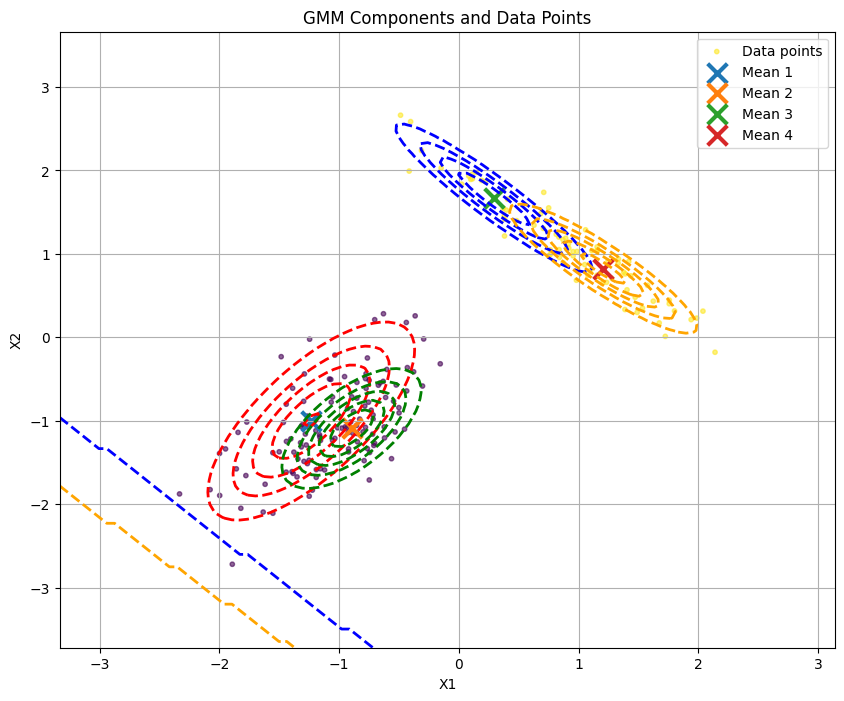

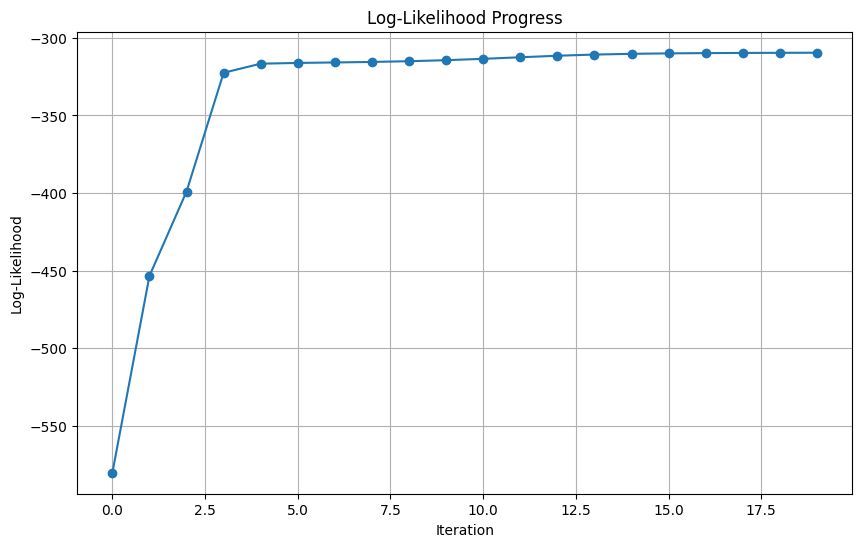


Running EM algorithm with diagonal covariance matrices:
Iteration 1/20


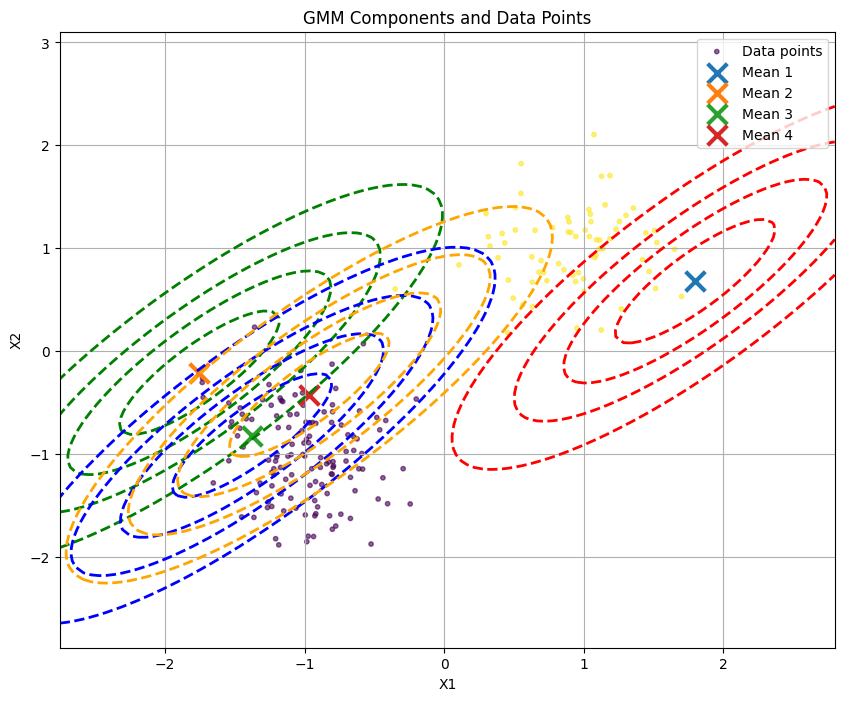

Log-likelihood: -611.5431
Iteration 2/20


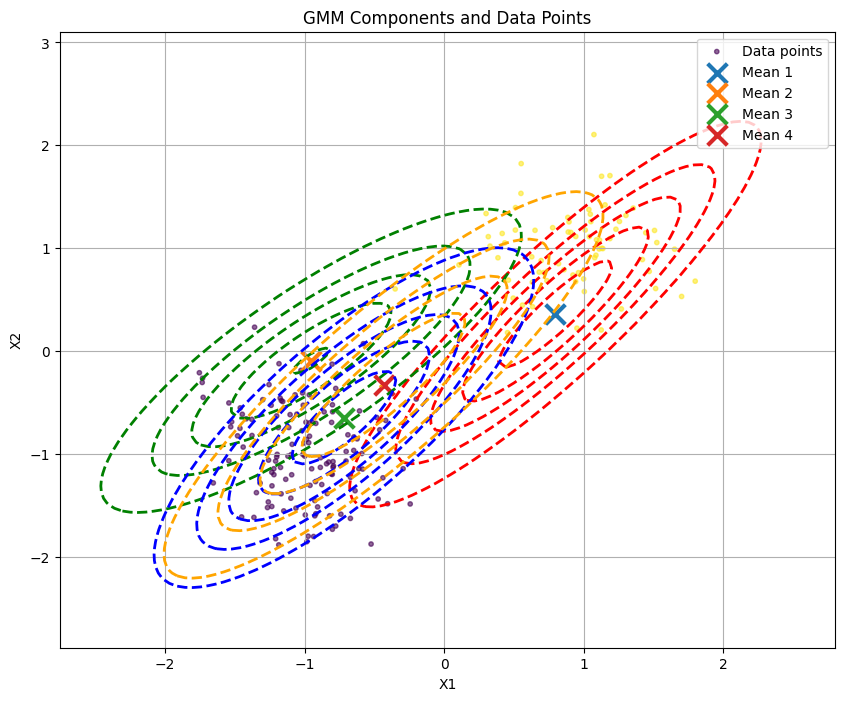

Log-likelihood: -444.6768
Iteration 3/20


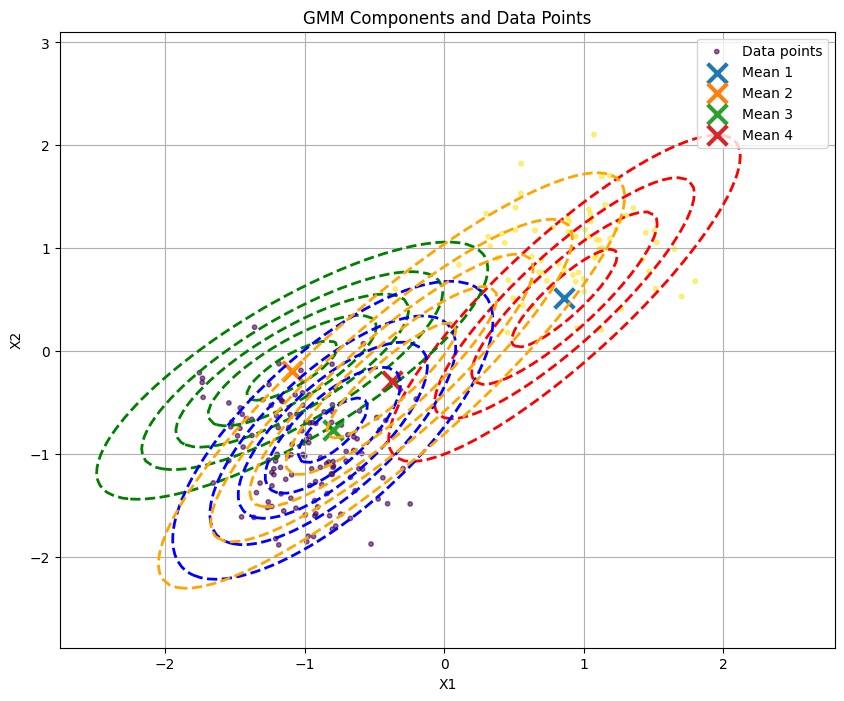

Log-likelihood: -433.4163
Iteration 4/20


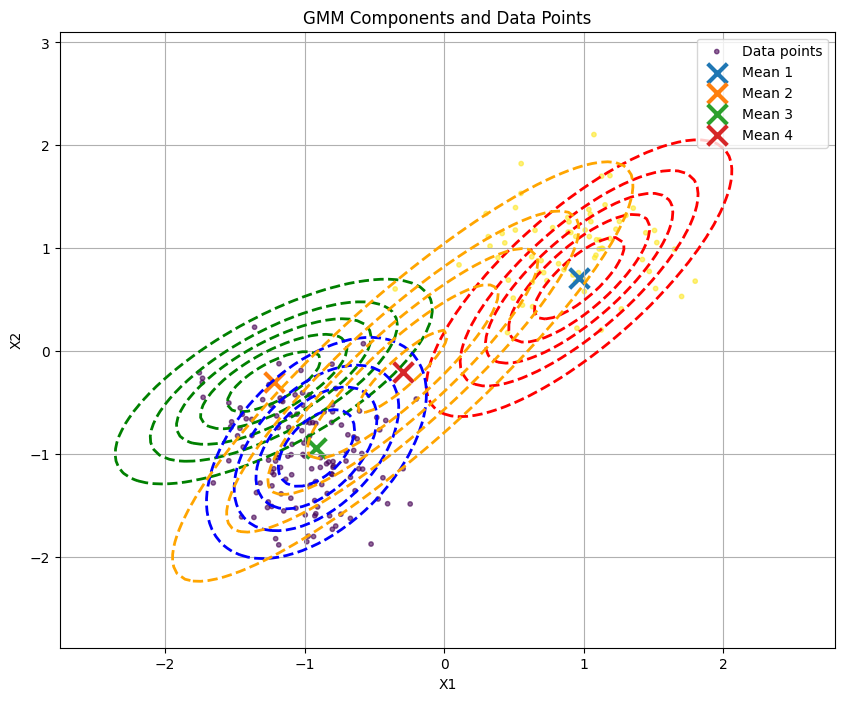

Log-likelihood: -398.1392
Iteration 5/20


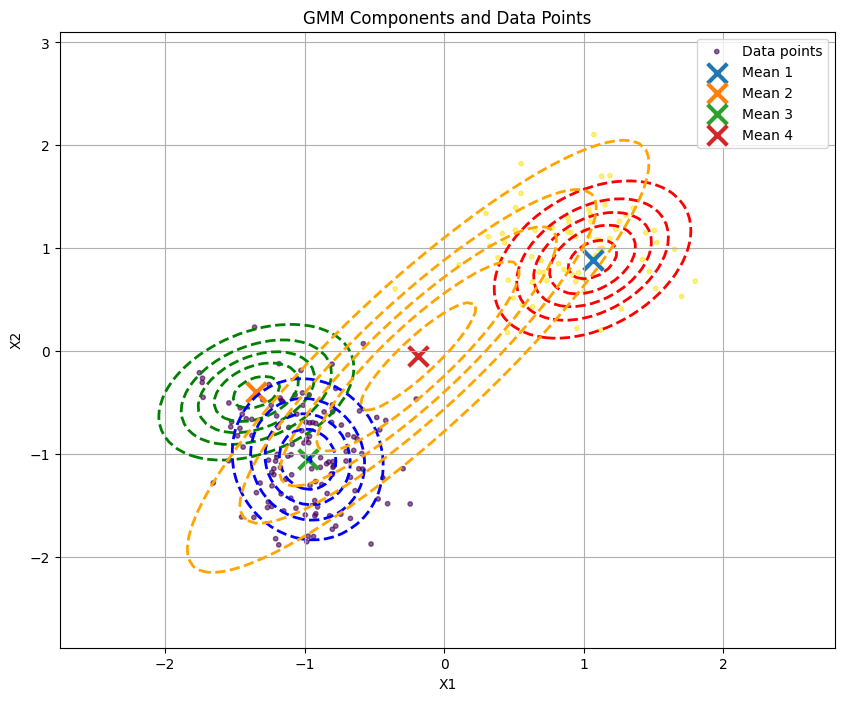

Log-likelihood: -337.0024
Iteration 6/20


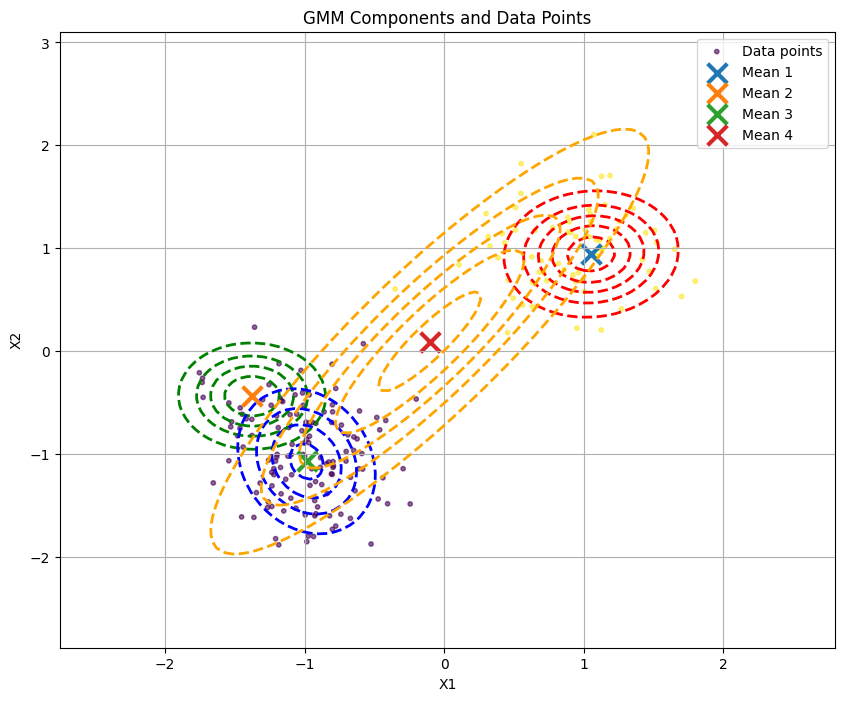

Log-likelihood: -318.9381
Iteration 7/20


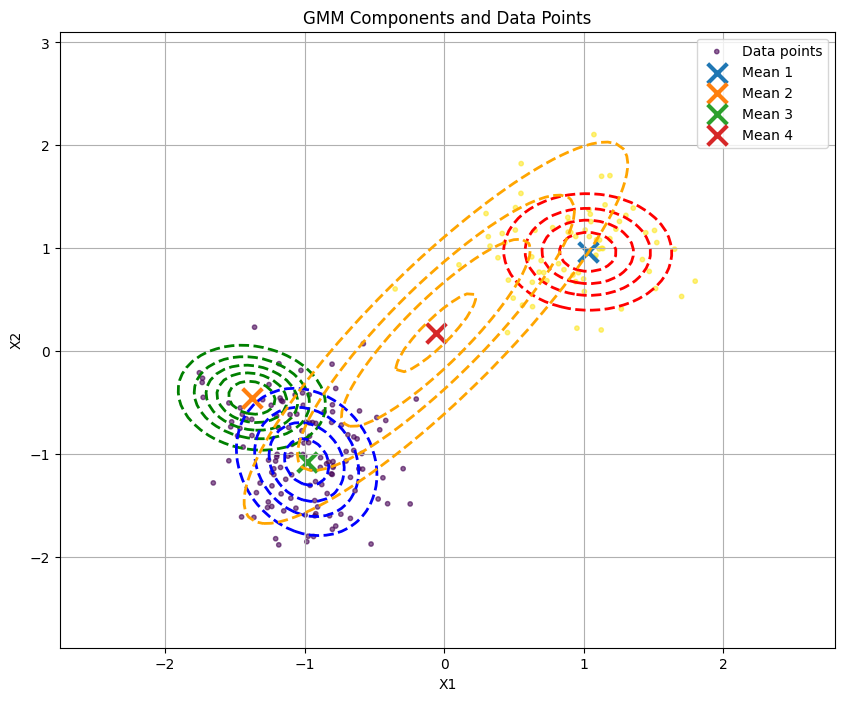

Log-likelihood: -313.7245
Iteration 8/20


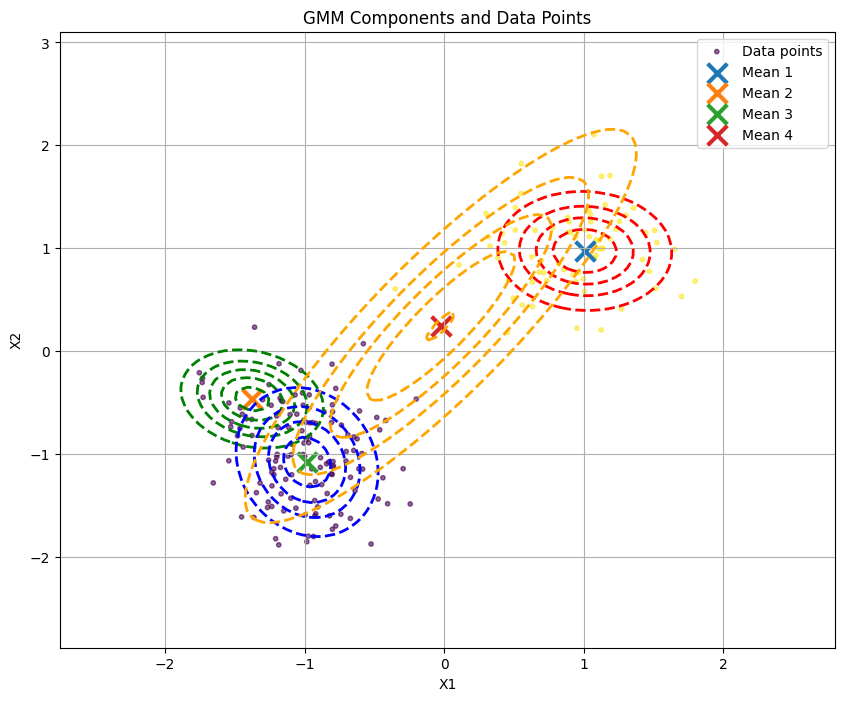

Log-likelihood: -310.9637
Iteration 9/20


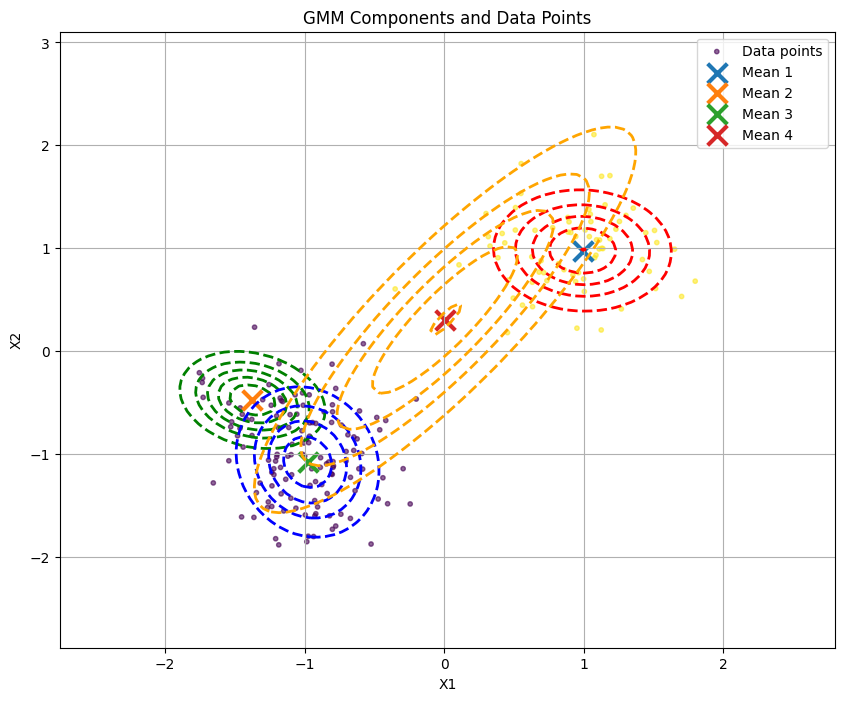

Log-likelihood: -309.2926
Iteration 10/20


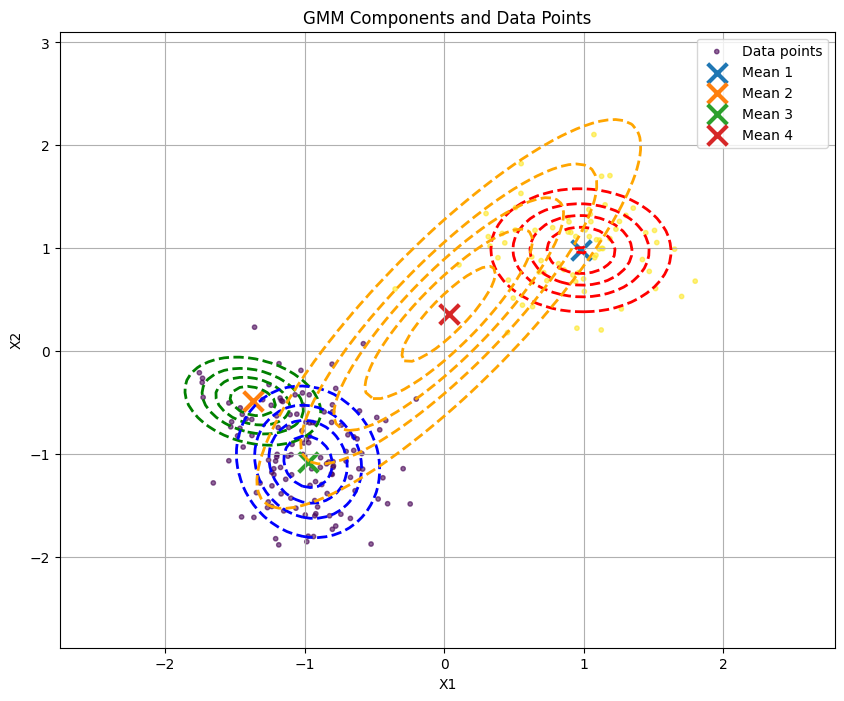

Log-likelihood: -308.2392
Iteration 11/20


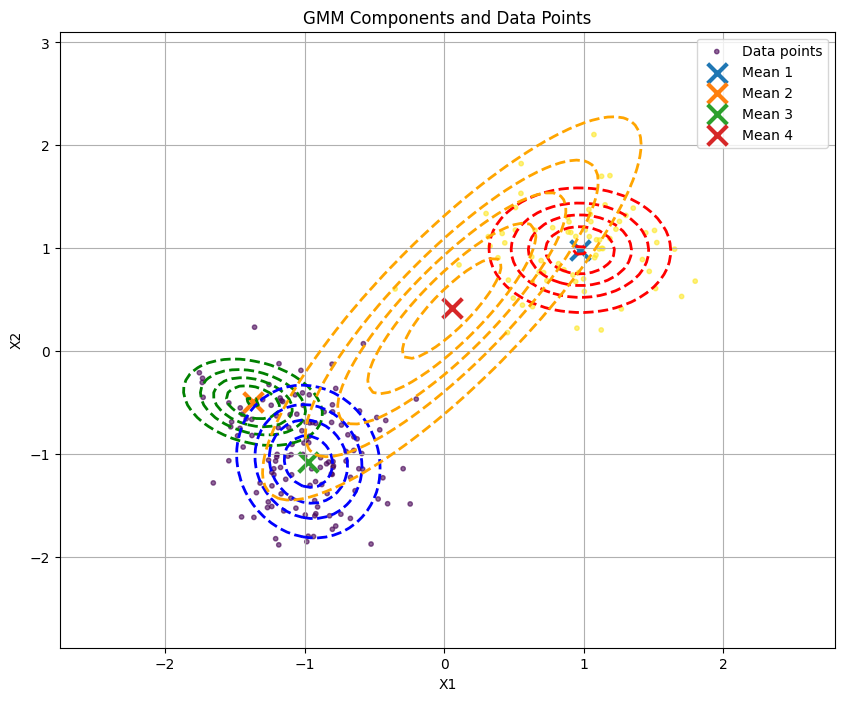

Log-likelihood: -307.5220
Iteration 12/20


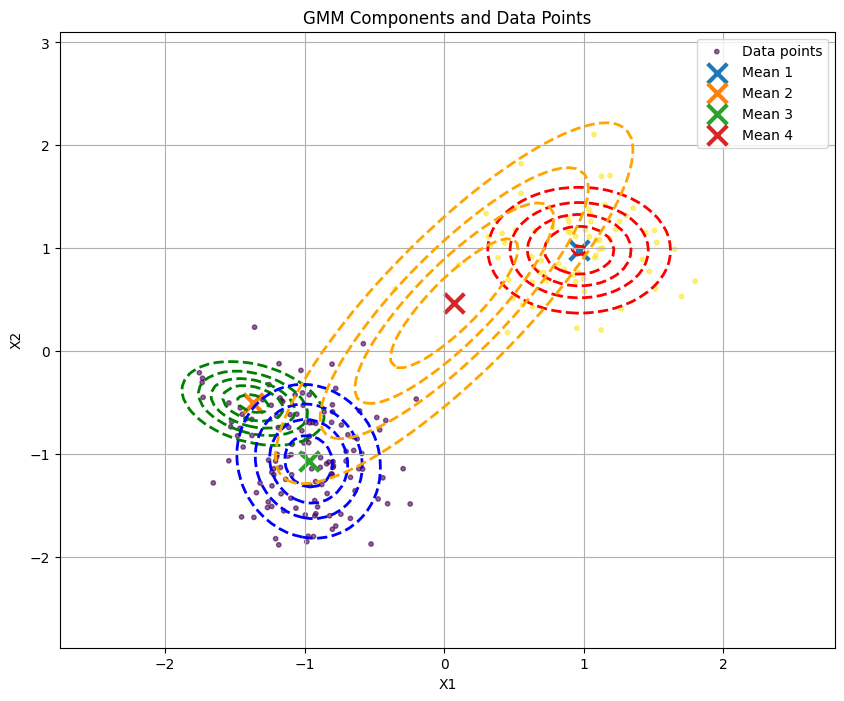

Log-likelihood: -306.9563
Iteration 13/20


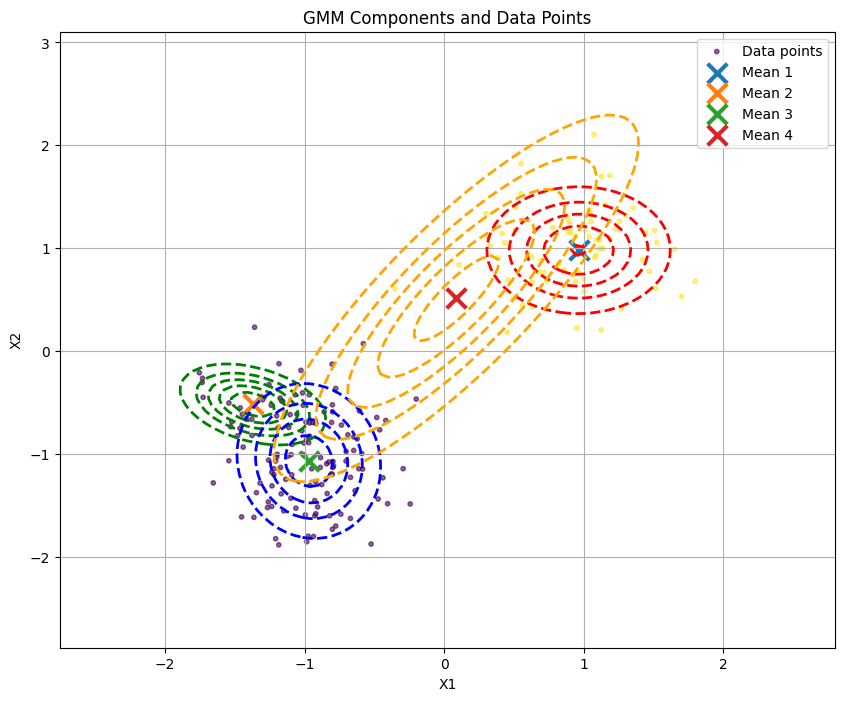

Log-likelihood: -306.4512
Iteration 14/20


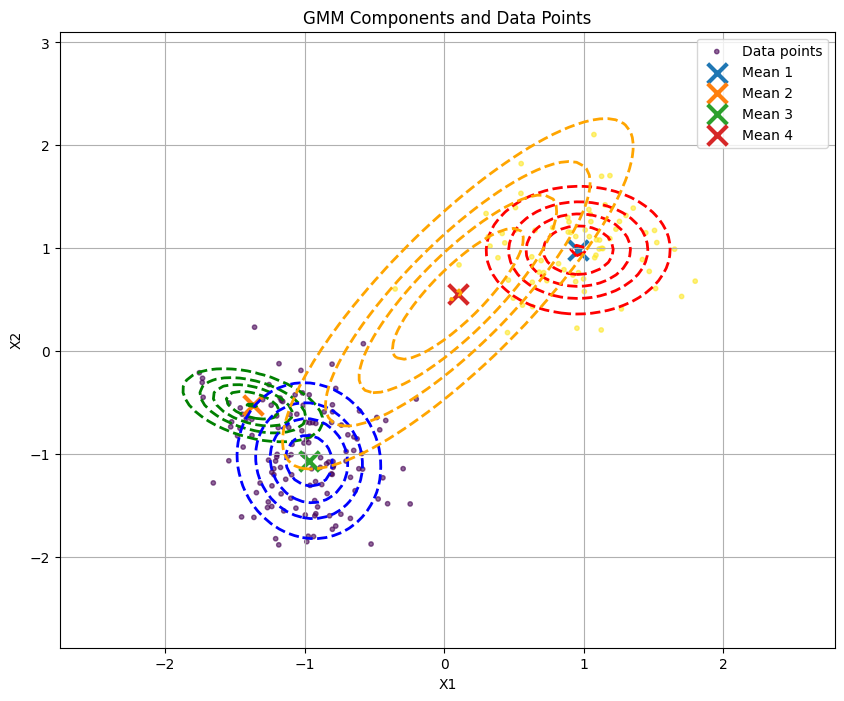

Log-likelihood: -306.0352
Iteration 15/20


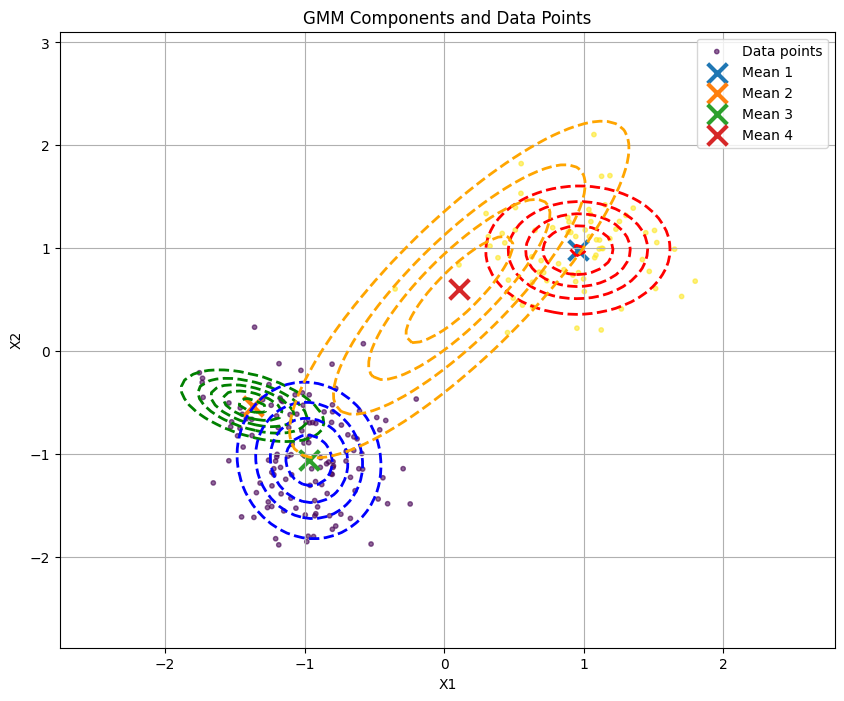

Log-likelihood: -305.7472
Iteration 16/20


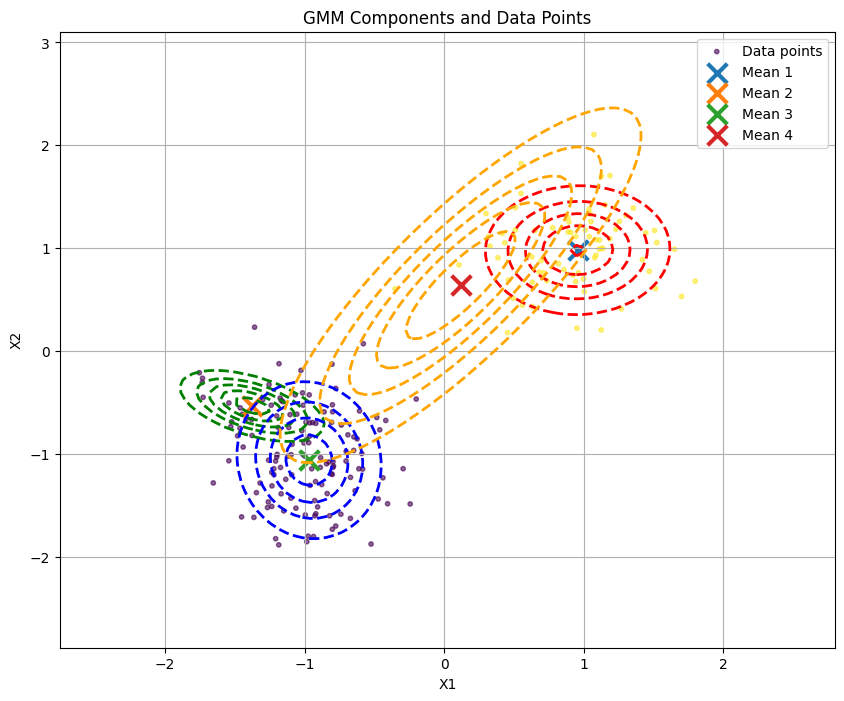

Log-likelihood: -305.5563
Iteration 17/20


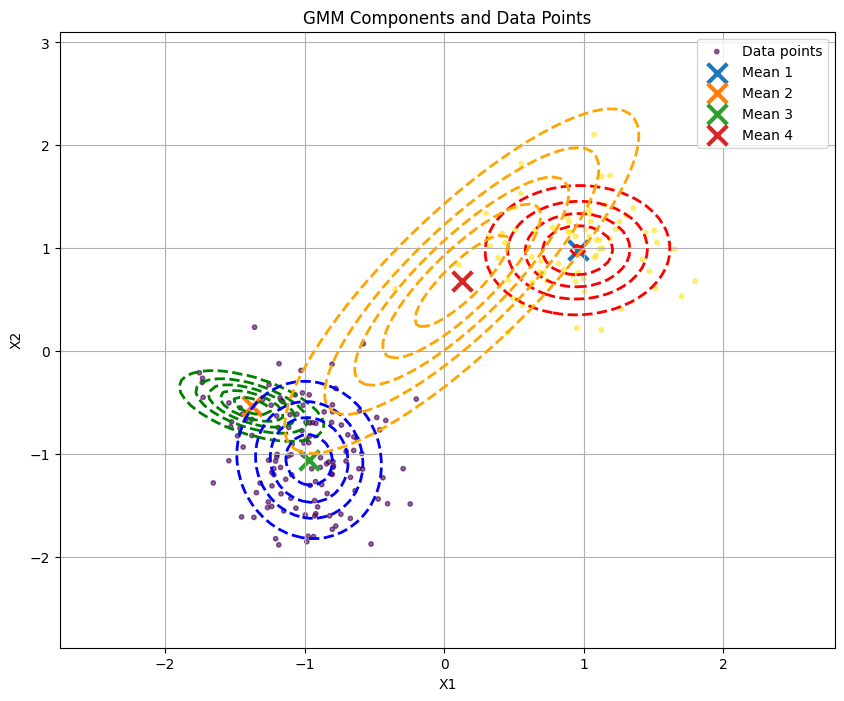

Log-likelihood: -305.4167
Iteration 18/20


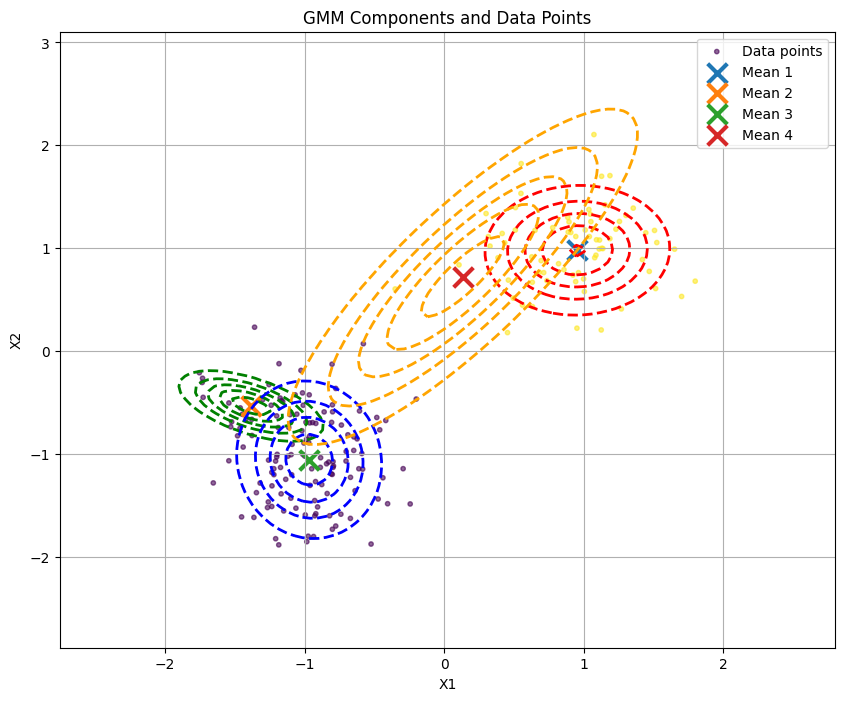

Log-likelihood: -305.2969
Iteration 19/20


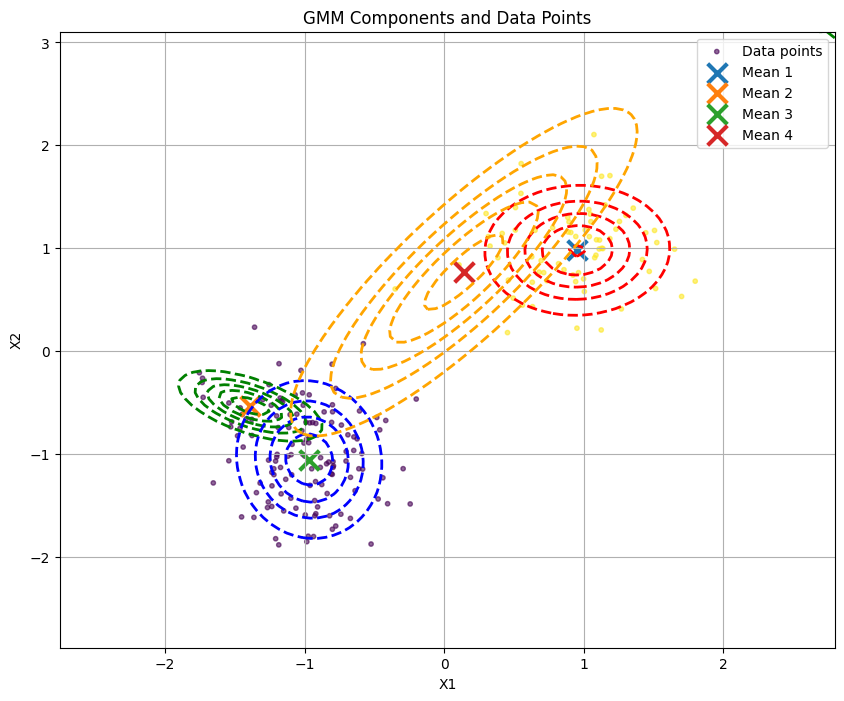

Log-likelihood: -305.1739
Iteration 20/20


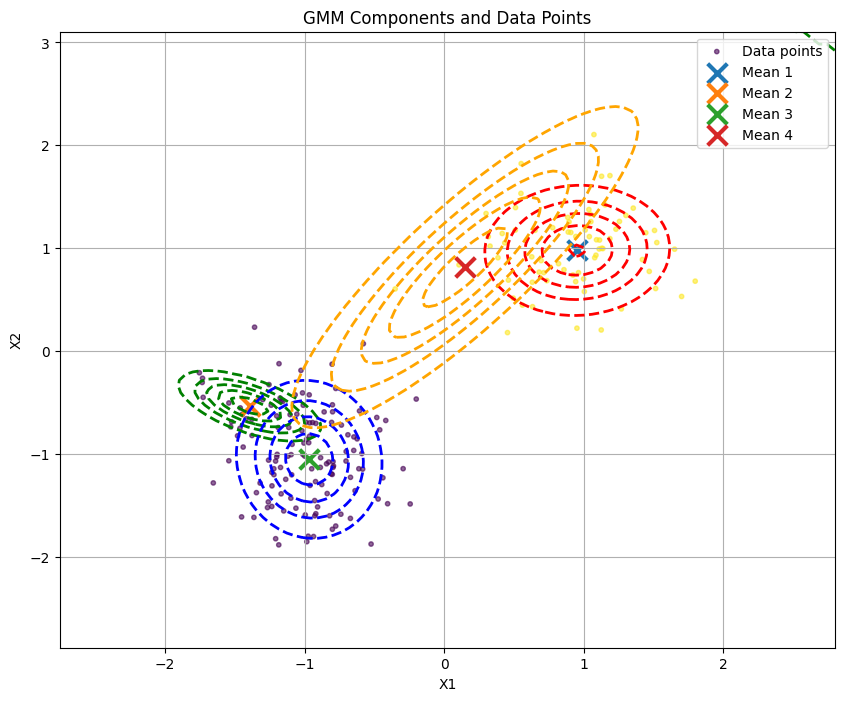

Log-likelihood: -305.0204


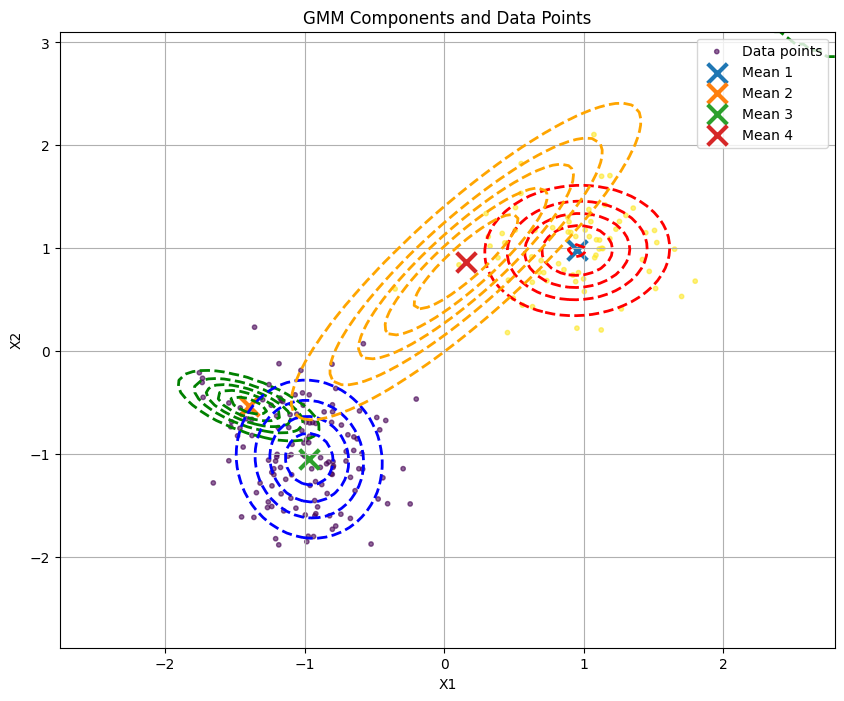

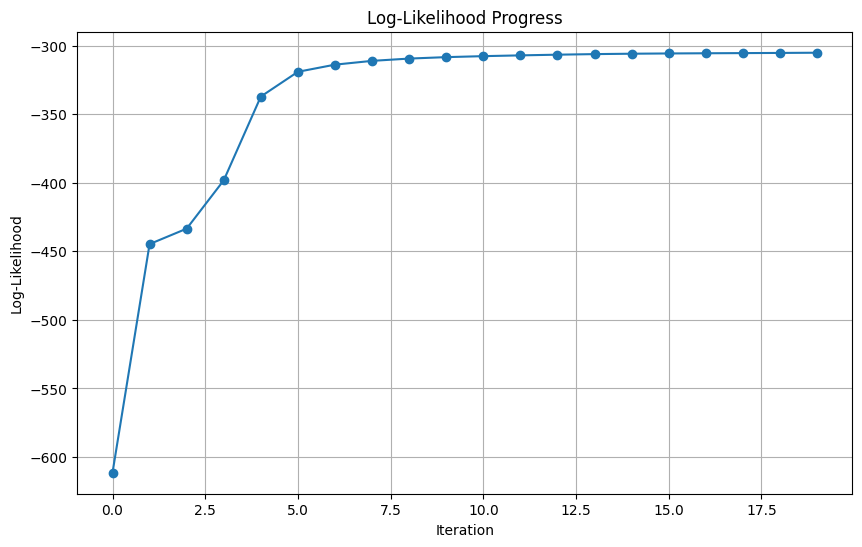


Running EM algorithm with spherical covariance matrices:
Iteration 1/20


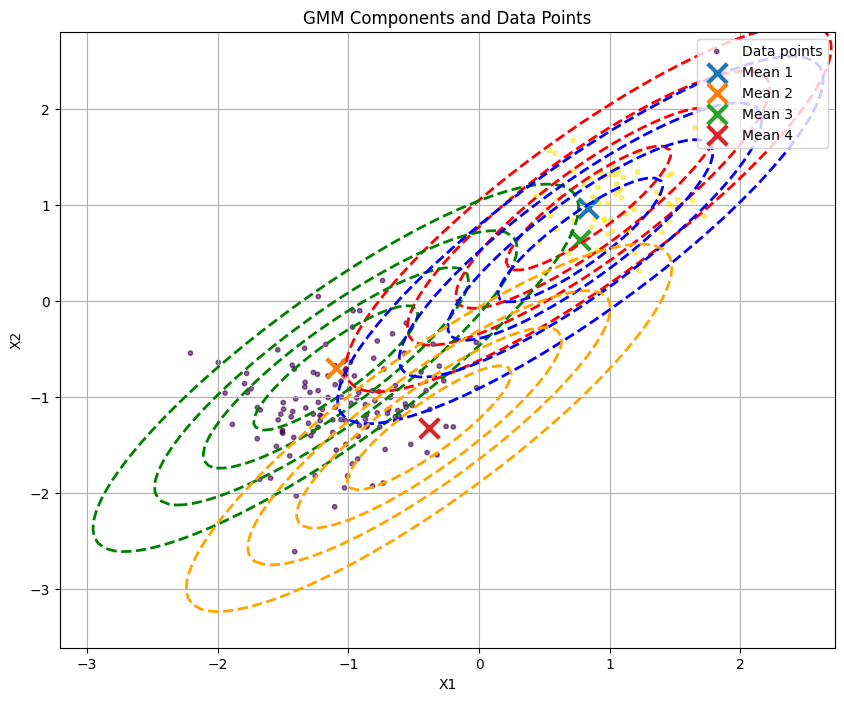

Log-likelihood: -482.5709
Iteration 2/20


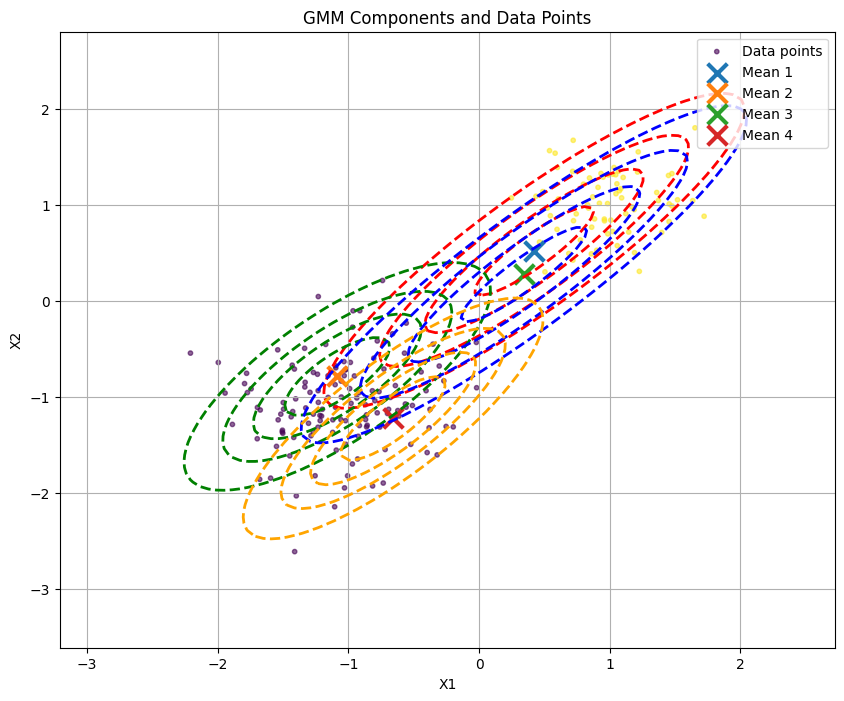

Log-likelihood: -418.8788
Iteration 3/20


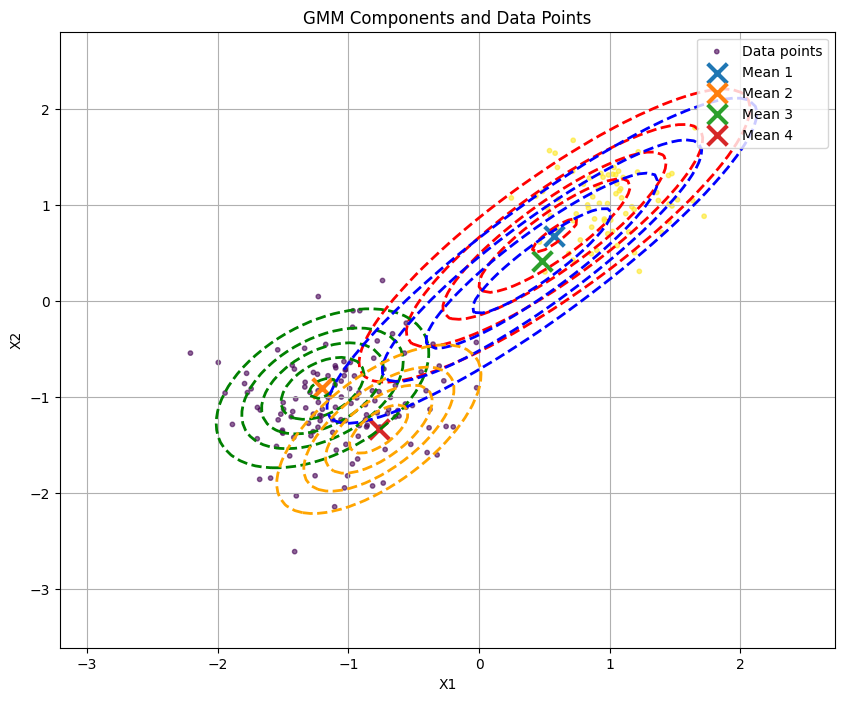

Log-likelihood: -382.5150
Iteration 4/20


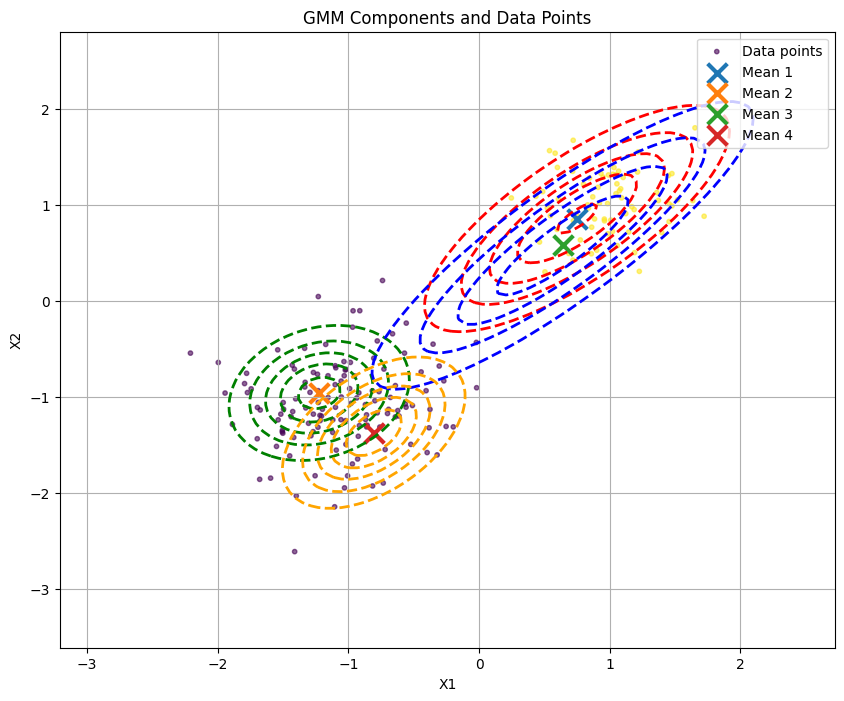

Log-likelihood: -362.2730
Iteration 5/20


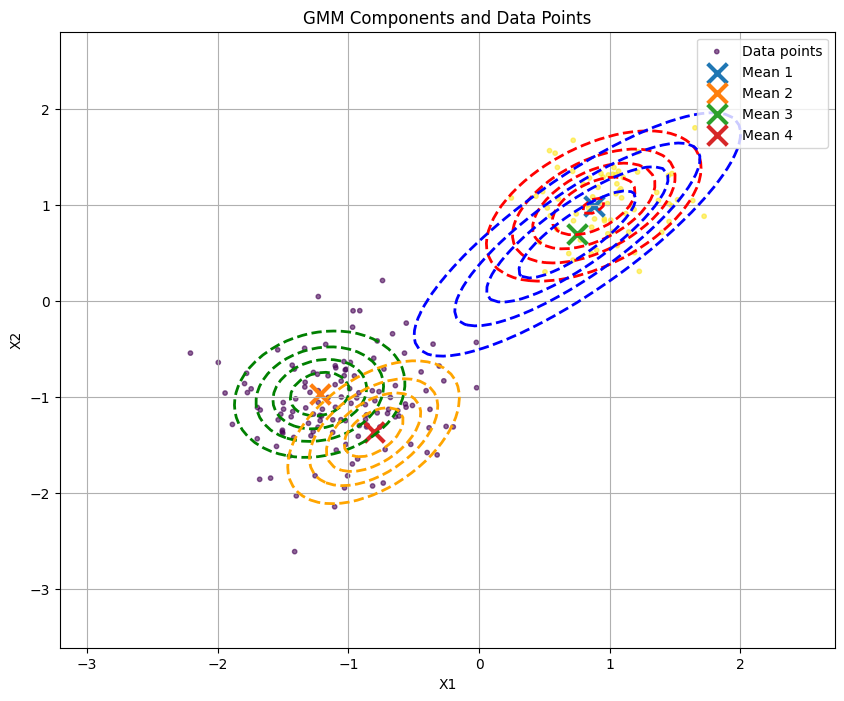

Log-likelihood: -343.5835
Iteration 6/20


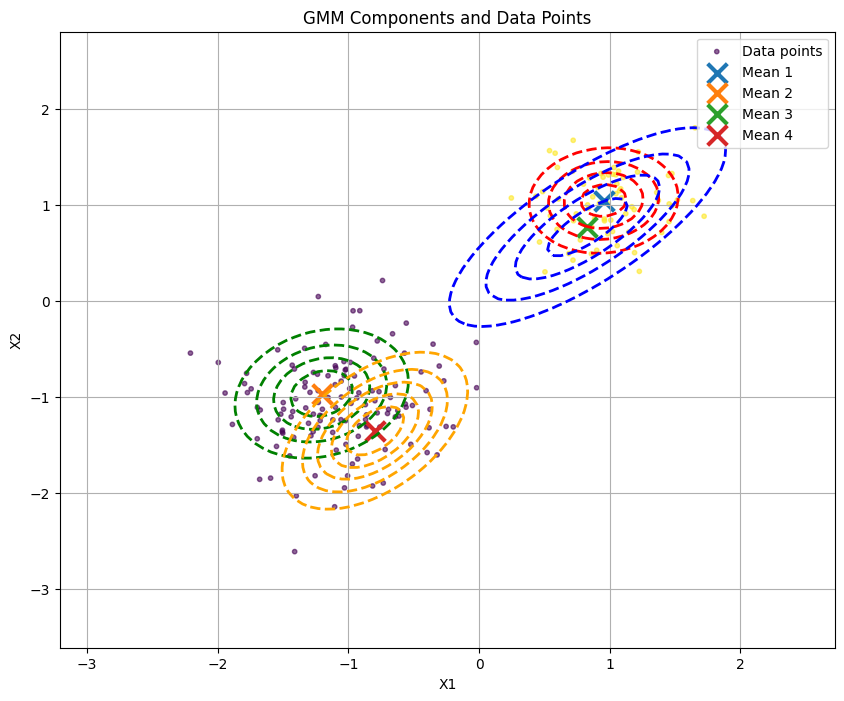

Log-likelihood: -326.6199
Iteration 7/20


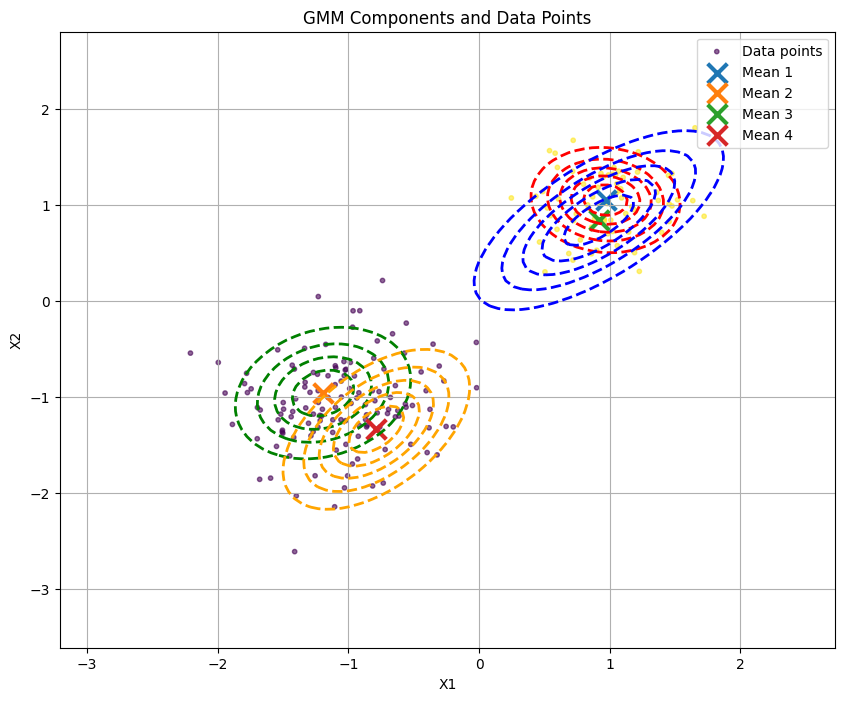

Log-likelihood: -321.7680
Iteration 8/20


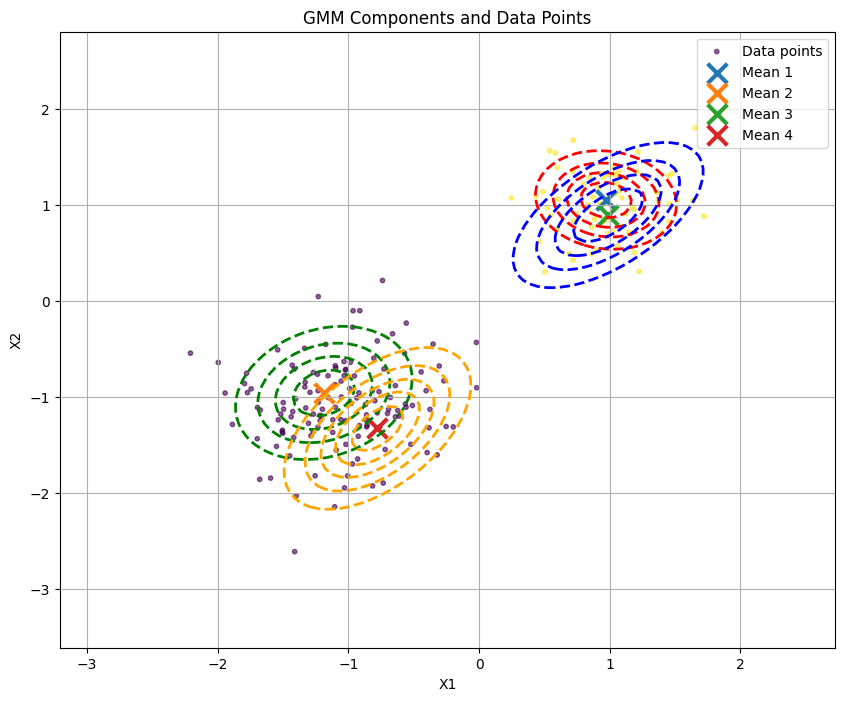

Log-likelihood: -319.7718
Iteration 9/20


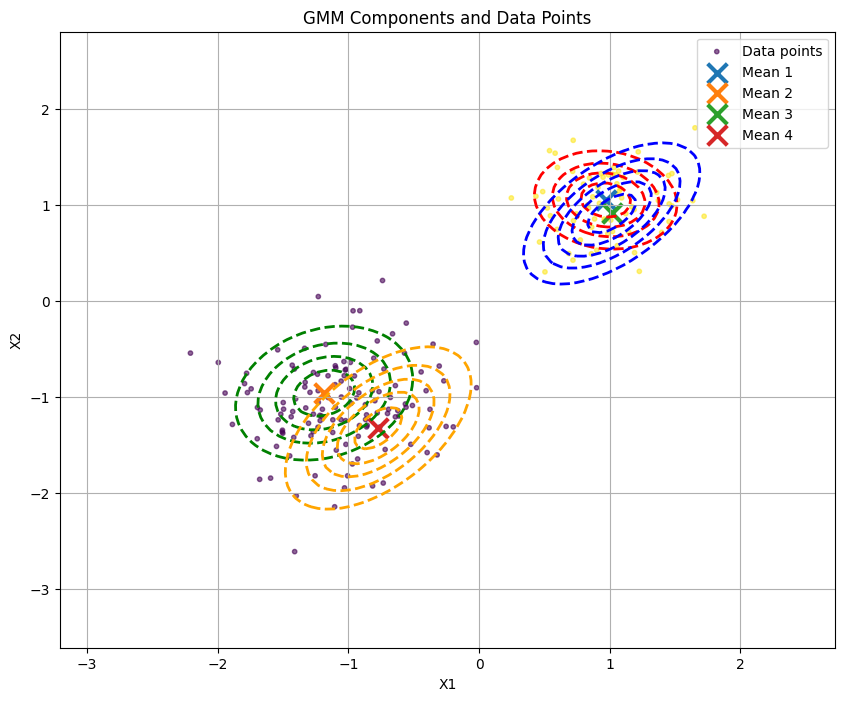

Log-likelihood: -319.2840
Iteration 10/20


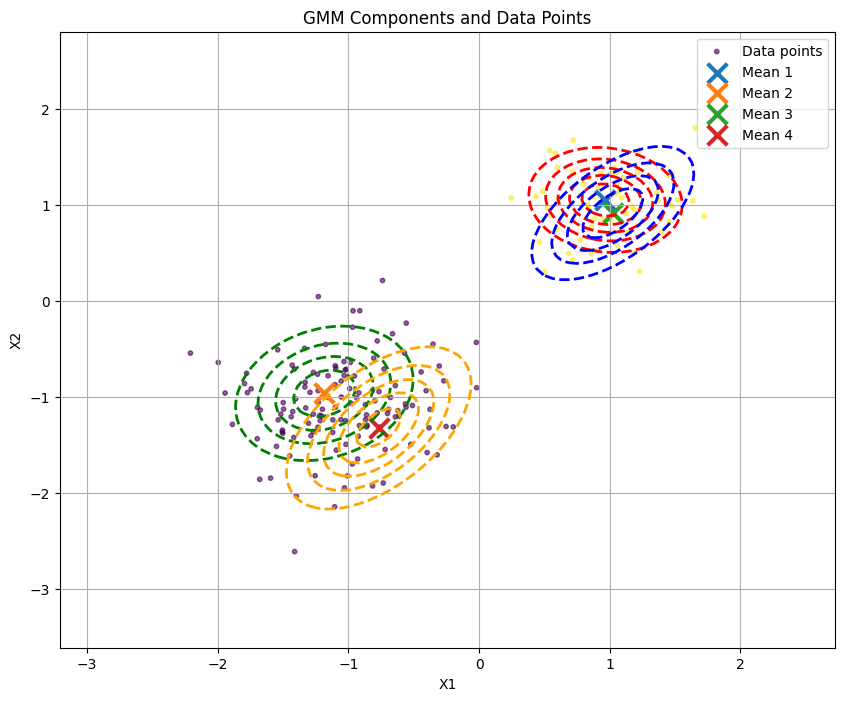

Log-likelihood: -319.1011
Iteration 11/20


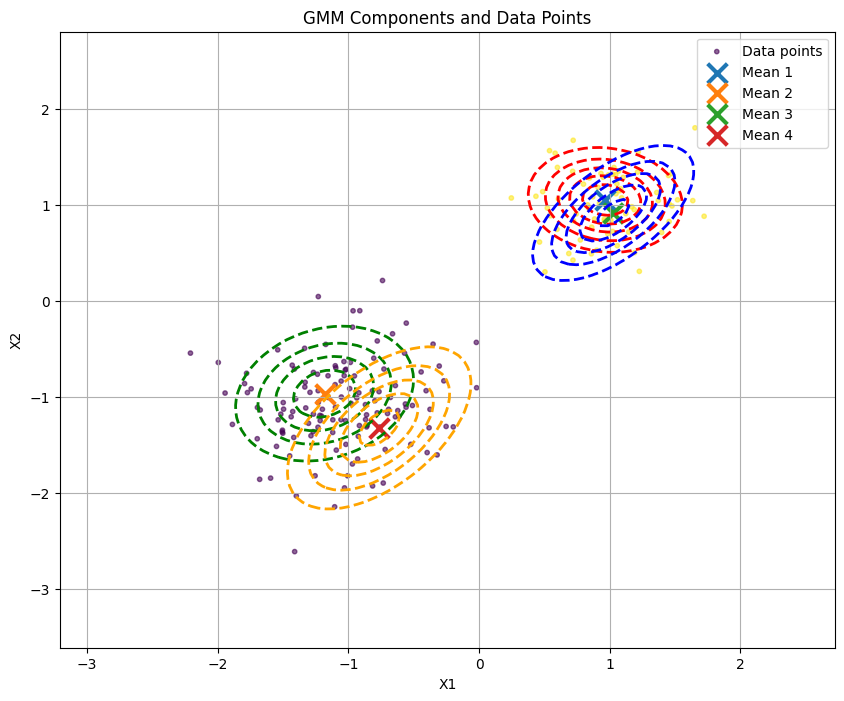

Log-likelihood: -318.9867
Iteration 12/20


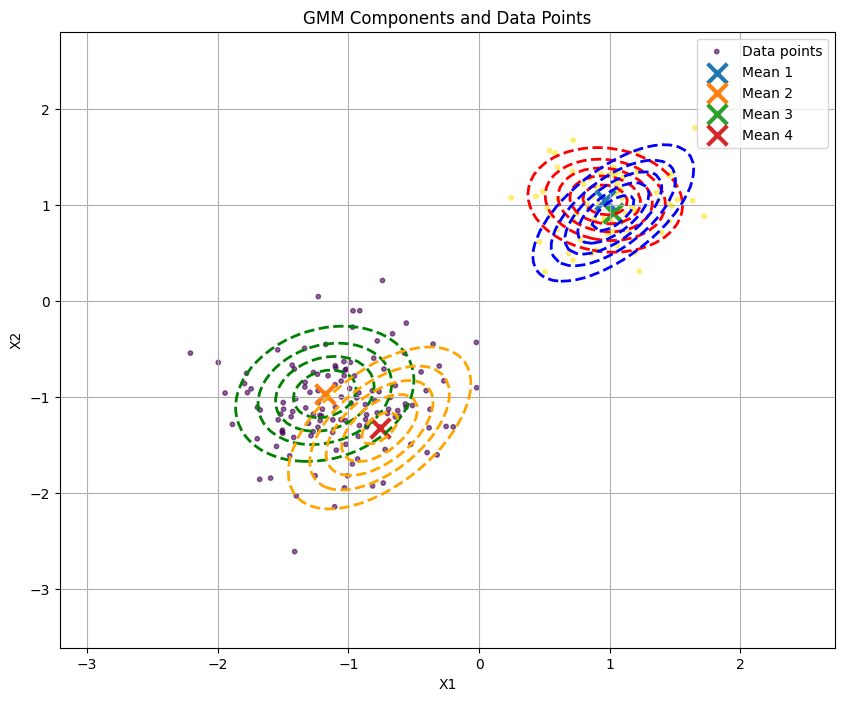

Log-likelihood: -318.9015
Iteration 13/20


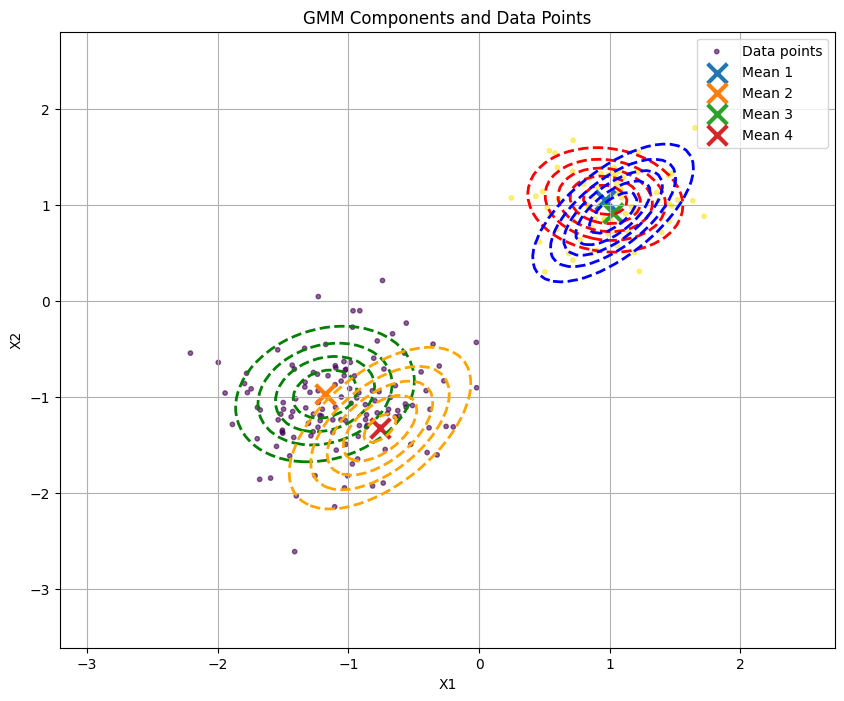

Log-likelihood: -318.8286
Iteration 14/20


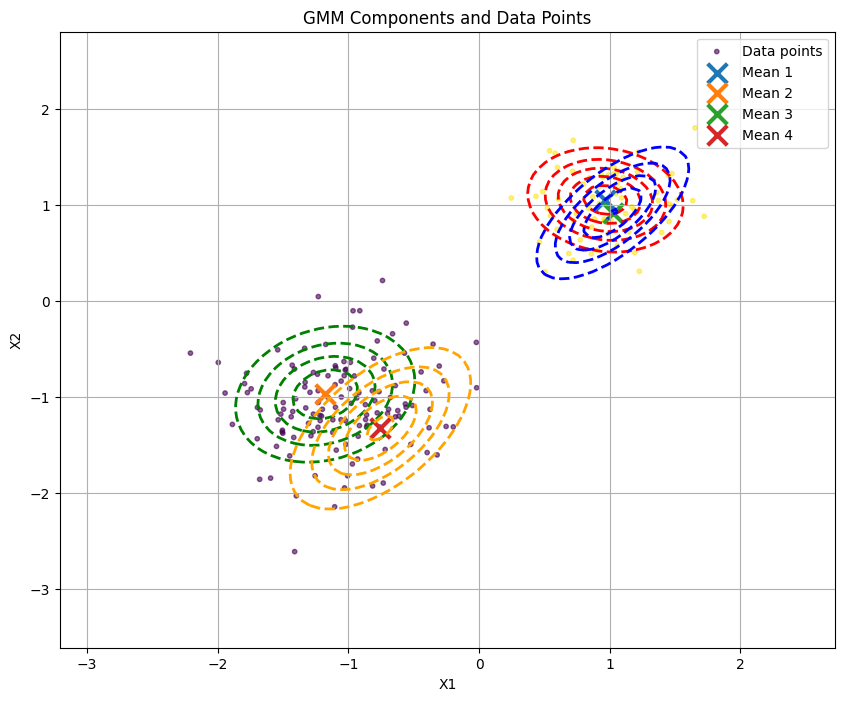

Log-likelihood: -318.7590
Iteration 15/20


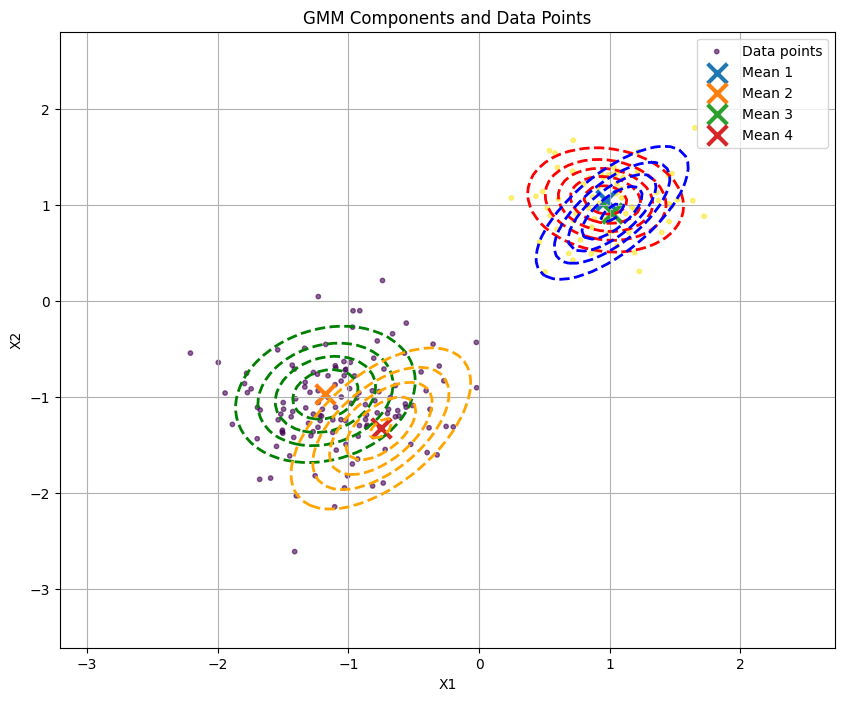

Log-likelihood: -318.6877
Iteration 16/20


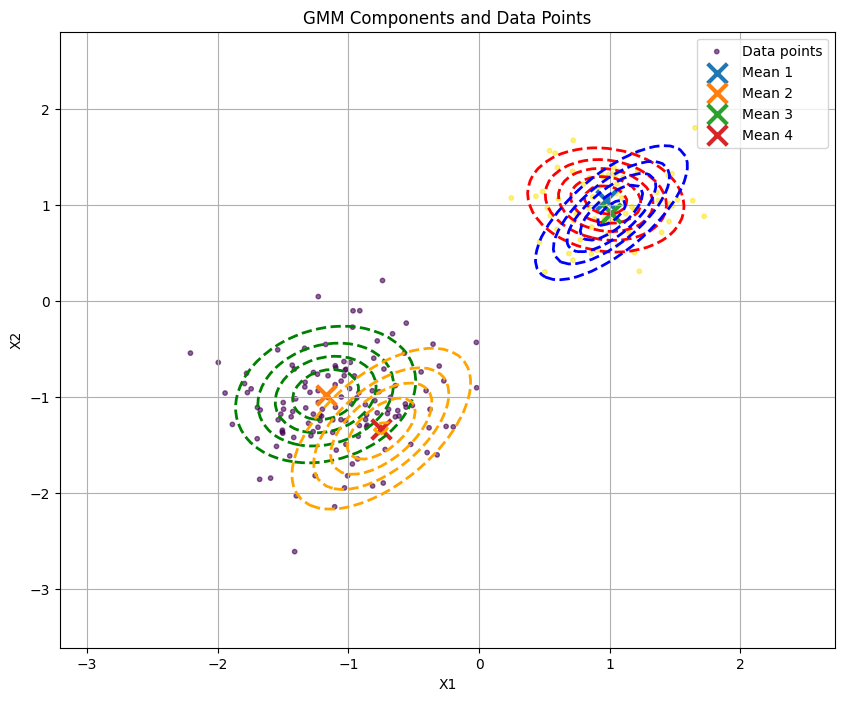

Log-likelihood: -318.6120
Iteration 17/20


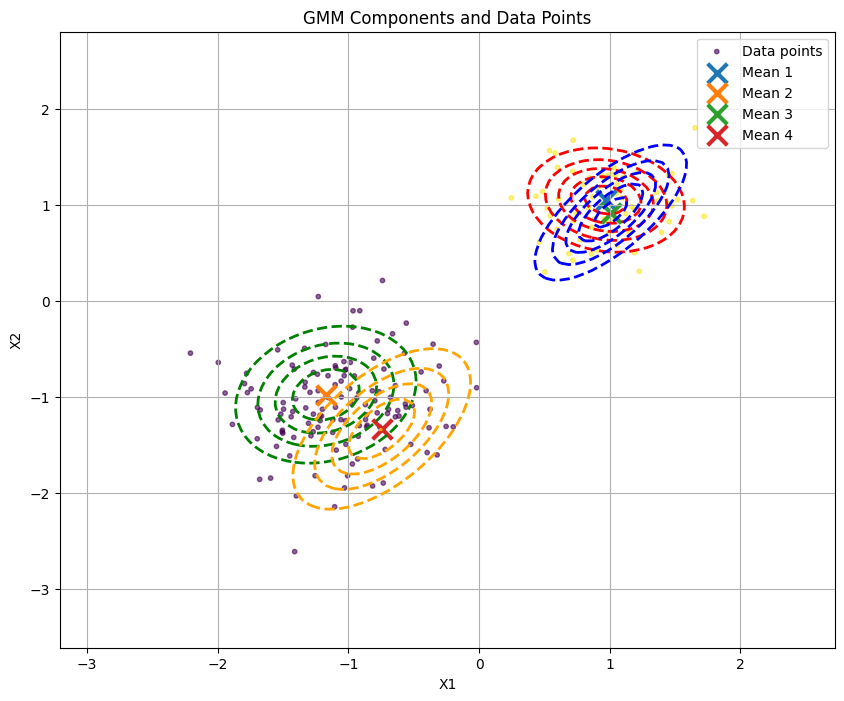

Log-likelihood: -318.5306
Iteration 18/20


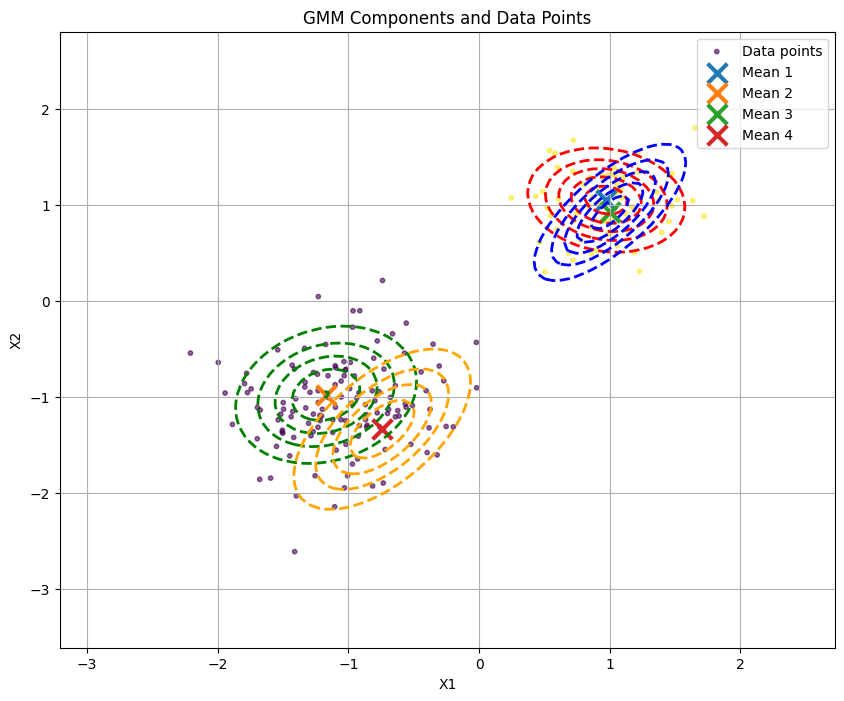

Log-likelihood: -318.4434
Iteration 19/20


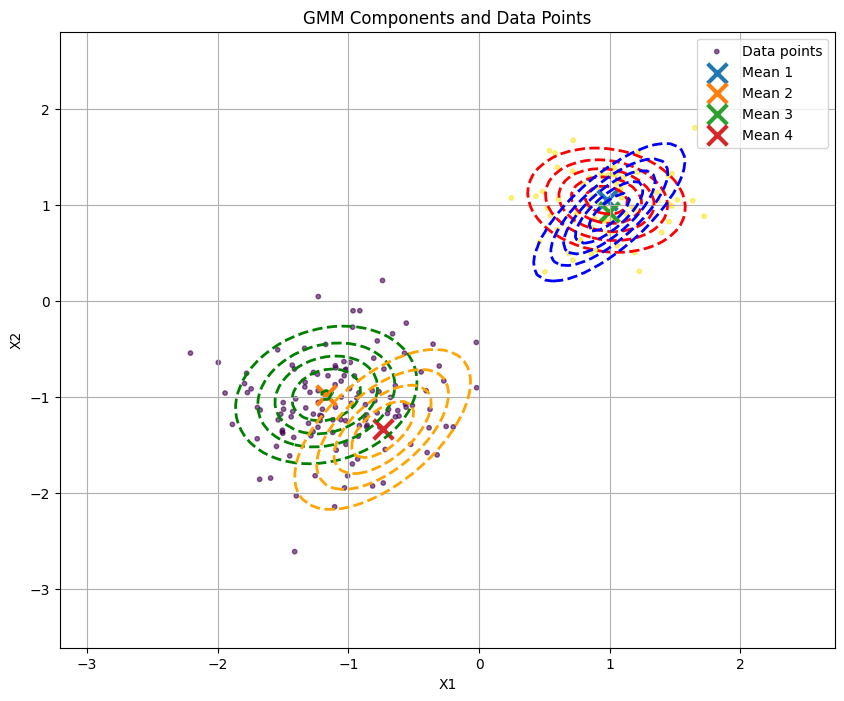

Log-likelihood: -318.3517
Iteration 20/20


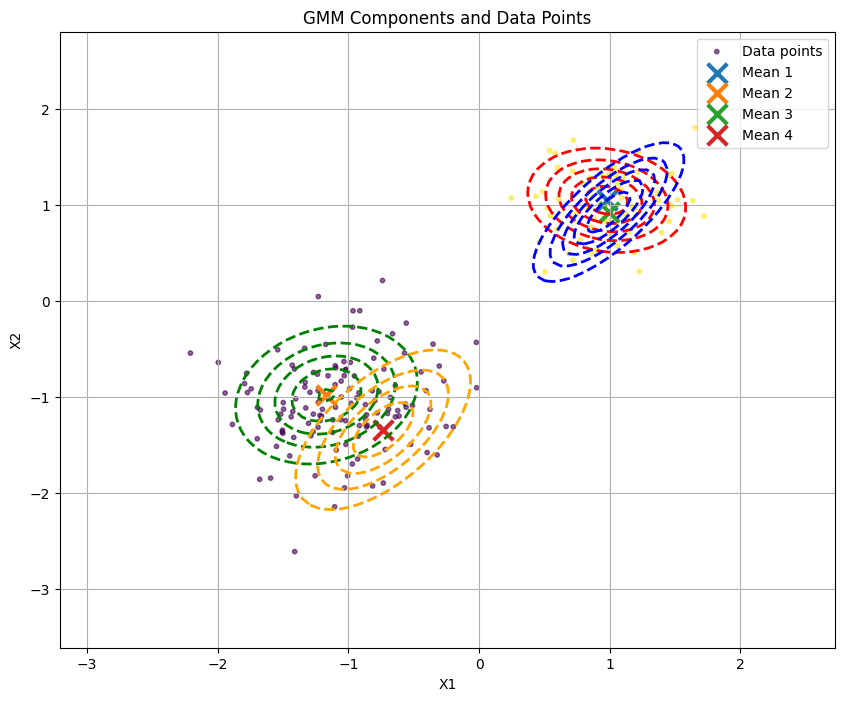

Log-likelihood: -318.2585


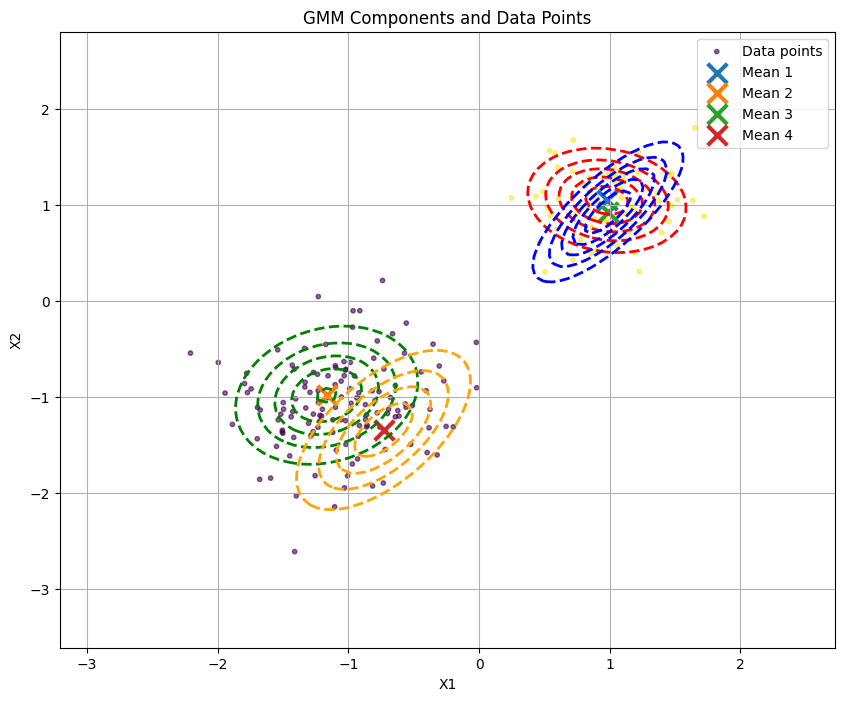

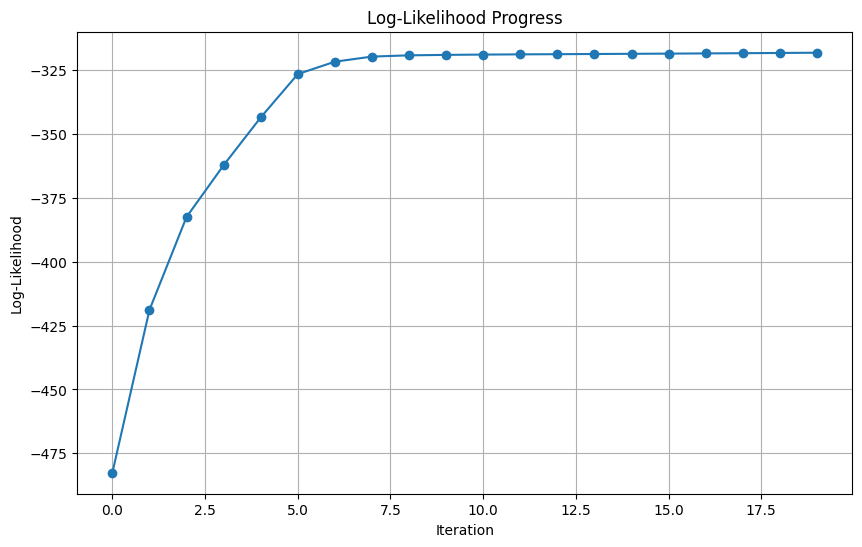

In [54]:
############################################################################
##Part-6)-d: Understand the issues with EM algorithm
############################################################################

# For full covariance matrices:
print("Running EM algorithm with full covariance matrices:")
pi_full, mu_full, sigma_full, ll_full = run_em_algorithm(data_full, labels_full, M=4)

# For diagonal covariance matrices:
print("\nRunning EM algorithm with diagonal covariance matrices:")
pi_diag, mu_diag, sigma_diag, ll_diag = run_em_algorithm(data_dg, labels_dg, M=4)

# For spherical covariance matrices:
print("\nRunning EM algorithm with spherical covariance matrices:")
pi_sph, mu_sph, sigma_sph, ll_sph = run_em_algorithm(data_sp, labels_sp, M=4)

<b> Report your observations </b>

1.  The synthetic data generated with different covariance structures (full, diagonal, spherical) produces visually distinct cluster patterns. Full covariance allows for arbitrary elliptical shapes, diagonal covariance restricts clusters to axis-aligned ellipses, and spherical covariance produces circular clusters.

2.  When initialized reasonably, the algorithm successfully recovers parameters close to the true distributions, with mean vectors approaching the true means and covariance matrices capturing the correct shapes.

3.  **Full Covariance** offers the most flexible, oriented boundaries capturing feature correlations, achieving high log-likelihood but prone to overfitting.  
    **Diagonal Covariance** uses fewer parameters with axis-aligned ellipses, performing well when variation matches coordinate axes.  
    **Spherical Covariance** is simplest and fastest, with circular boundaries, but struggles when clusters have directional variation.

4.  **Full Covariance** offers the most flexible, oriented boundaries capturing feature correlations, achieving high log-likelihood but prone to overfitting.  
    **Diagonal Covariance** uses fewer parameters with axis-aligned ellipses, performing well when variation matches coordinate axes.  
    **Spherical Covariance** is simplest and fastest, with circular boundaries, but struggles when clusters have directional variation.

5.  To mitigate initialization sensitivity, multiple random restarts could be employed to find better solutions.
